## **Stock Forecasting and Portfolio Generation**

About dataset -
The dataset contains historical financial data for 53 unique S&P 500 companies, spanning from 2015 onward. It includes daily stock metrics such as open, close, high, low prices, and trading volume for each ticker.

*   Number of different companies in the dataset: 53

Generating correlation heatmap...


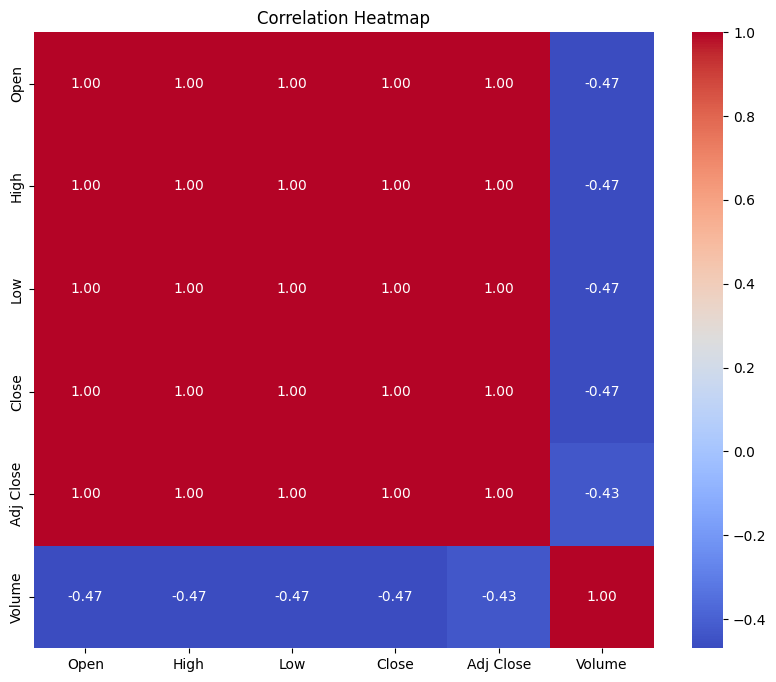

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

file_path = 'stocks_data.csv'
df = pd.read_csv(file_path)

df.dropna(axis=0, inplace=True)
df.dropna(axis=1, inplace=True)
for col in df.columns:
    if 'date' in col.lower():
        df[col] = pd.to_datetime(df[col], errors='coerce')

df.drop_duplicates(inplace=True)

numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_cols:
    df[col] = df[col].apply(lambda x: np.log1p(x) if x > 0 else 0)

categorical_cols = df.select_dtypes(include=['object']).columns
encoder = LabelEncoder()
for col in categorical_cols:
    df[col] = encoder.fit_transform(df[col])

#print(df.head())

import matplotlib.pyplot as plt
import seaborn as sns

# Correlation heatmap for numerical variables
if len(numerical_cols) > 1:
    print("Generating correlation heatmap...")
    plt.figure(figsize=(10, 8))
    sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title("Correlation Heatmap")
    plt.show()

Generating correlation heatmap...


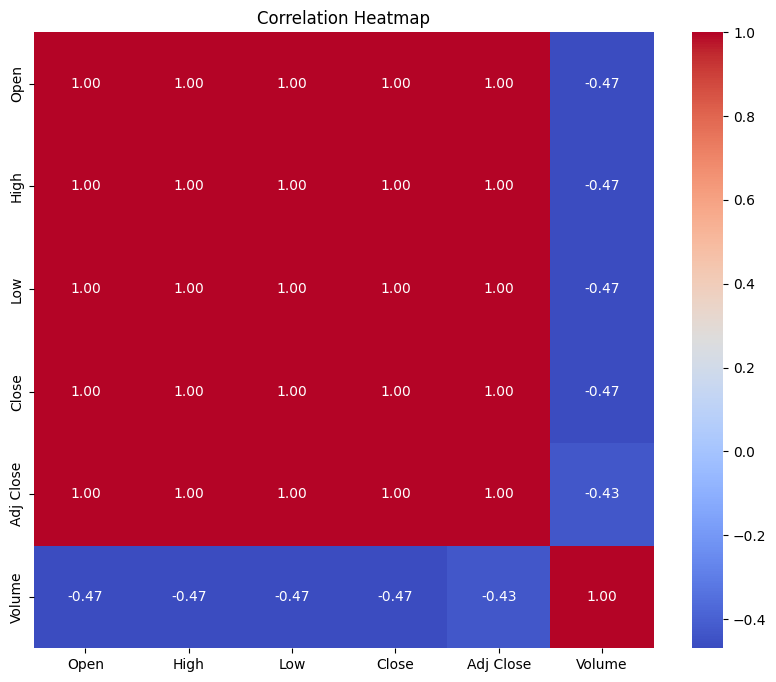

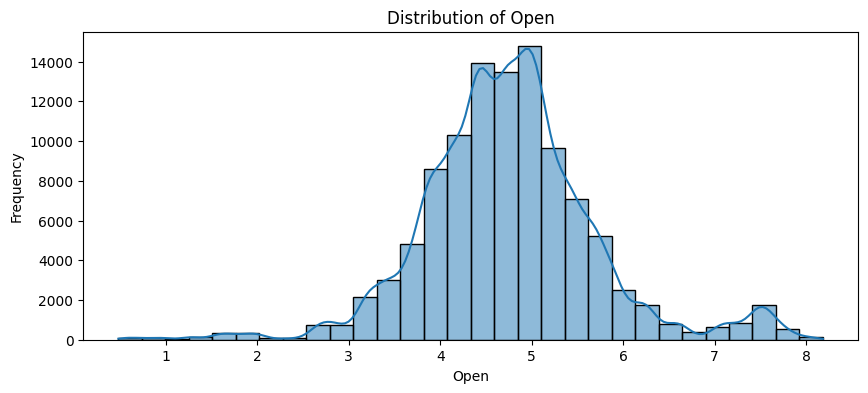

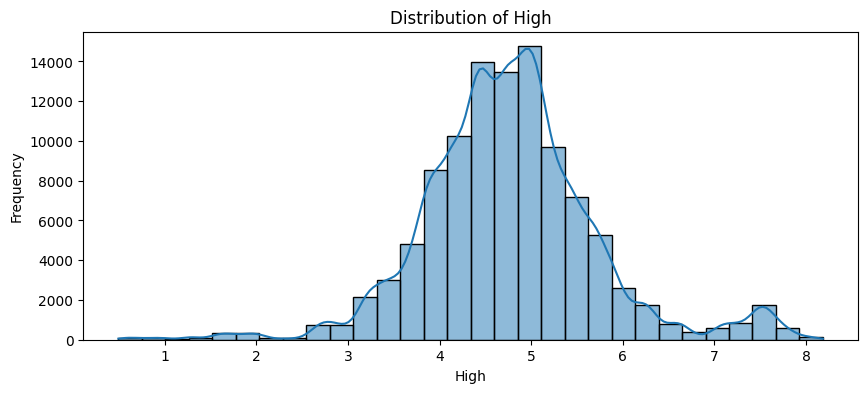

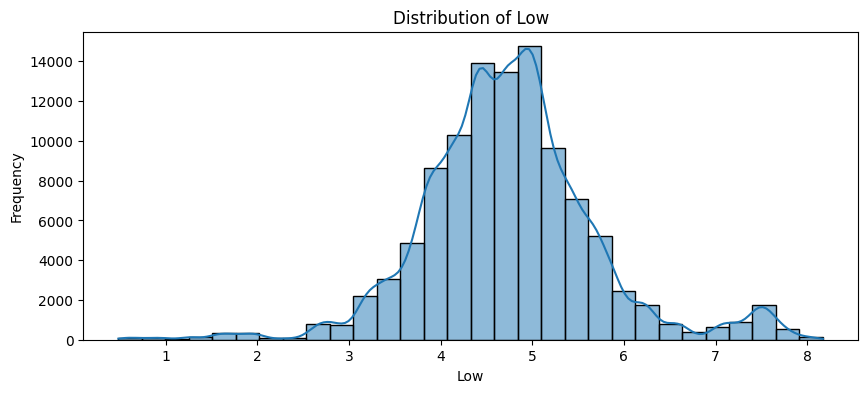

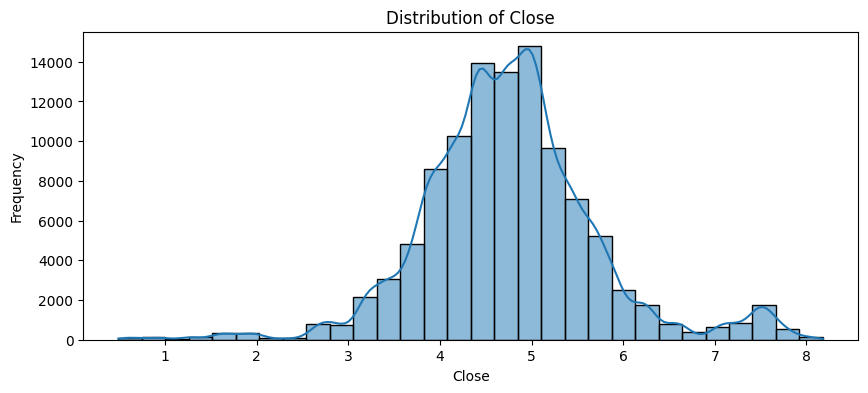

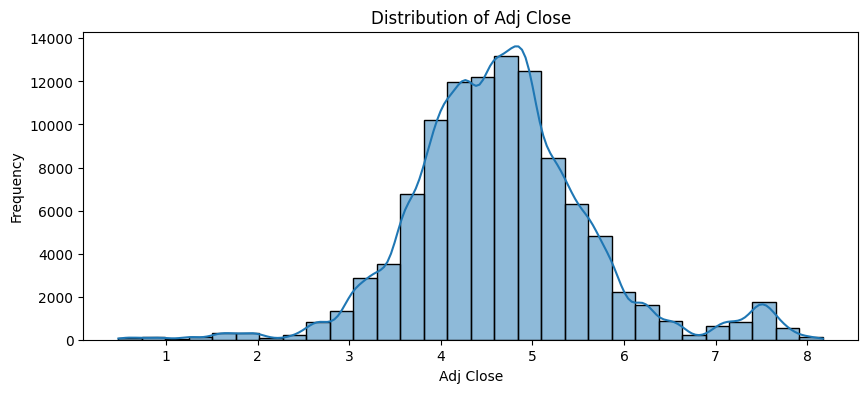

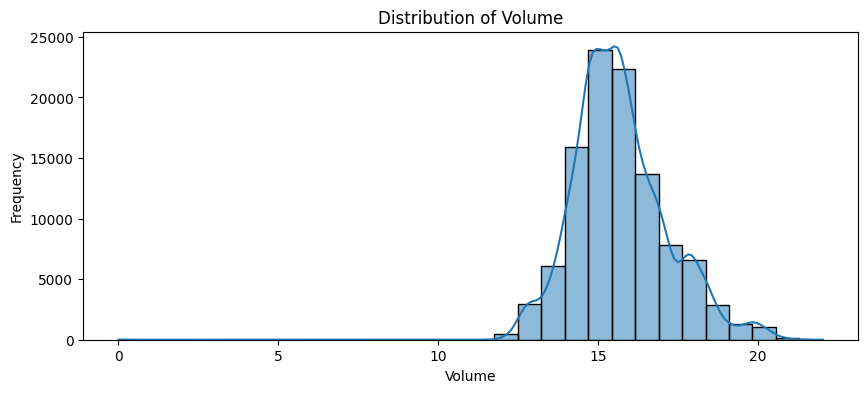

In [53]:
#EDA
# Importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Correlation Heatmap
# Correlation heatmap for numerical variables
if len(numerical_cols) > 1:
    print("Generating correlation heatmap...")
    plt.figure(figsize=(10, 8))
    sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title("Correlation Heatmap")
    plt.show()

# 4. Distribution Analysis
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()


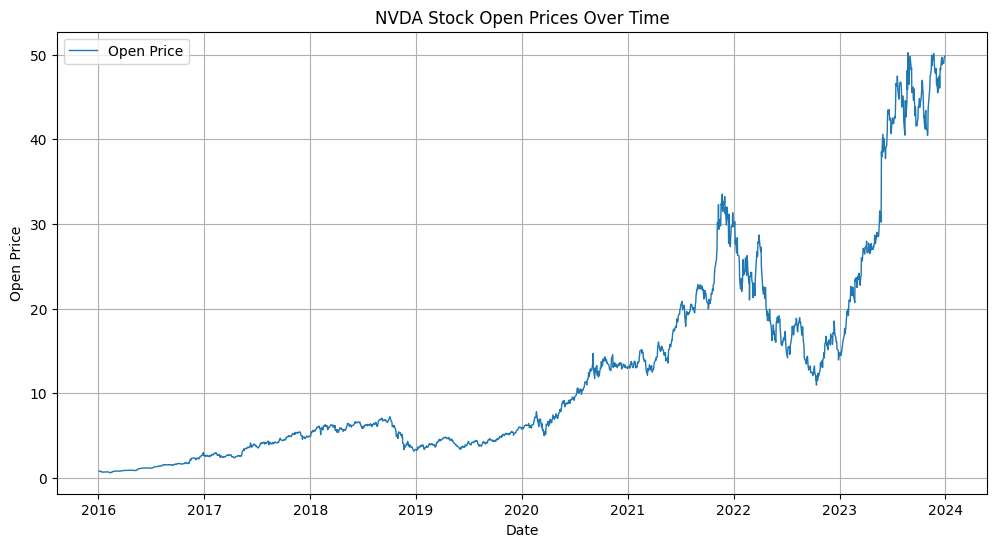

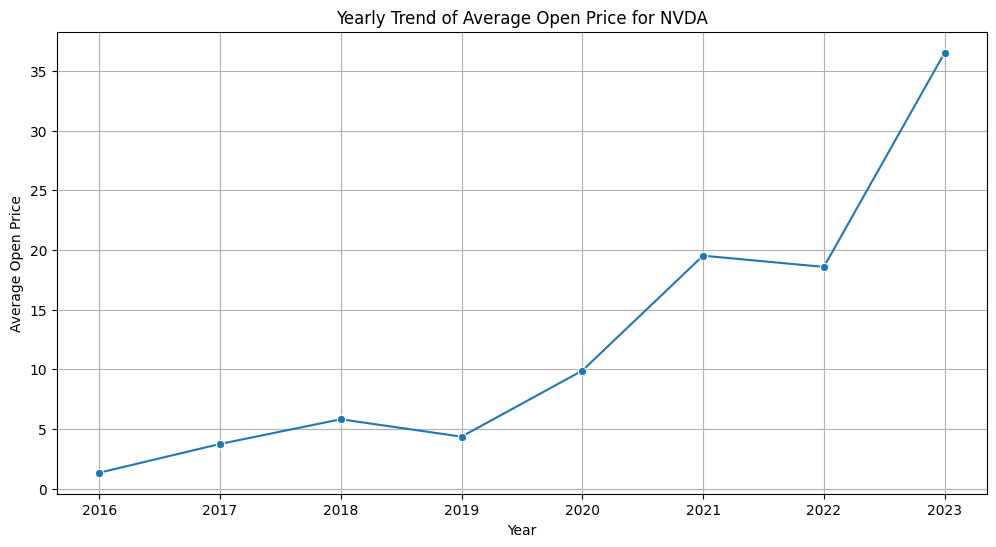

<ipython-input-67-5f887ac151d2>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=seasonality_data, x='Month', y='Open', hue=None, palette='viridis', legend=False)


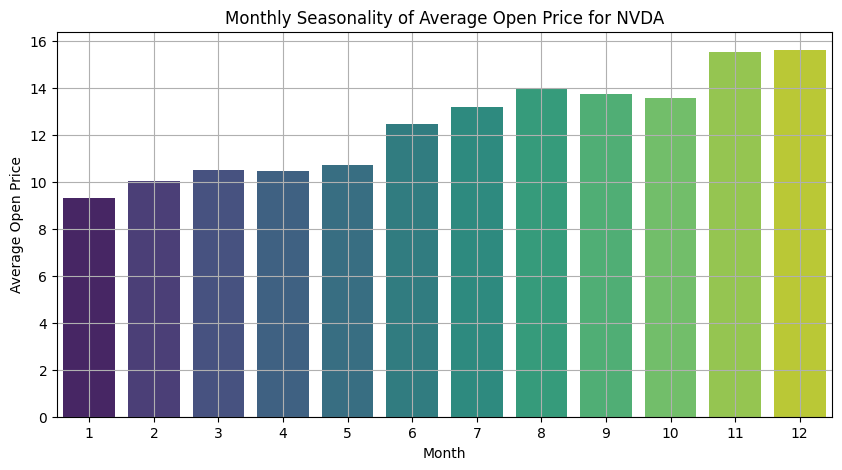

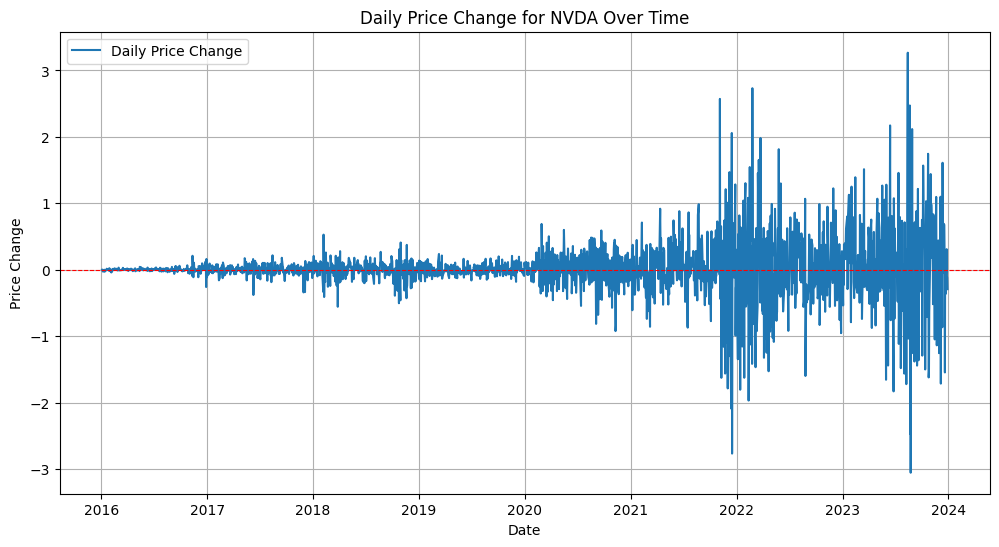

In [67]:
# NVDA EDA

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Reload the dataset
file_path = 'stocks_data.csv'
df = pd.read_csv(file_path)

# Ensure the Ticker column is properly formatted and filter for NVDA
df['Ticker'] = df['Ticker'].astype(str)
nvda_data = df[df['Ticker'].str.strip().str.upper() == 'NVDA'].copy()

# Ensure the Date column is properly parsed as datetime
nvda_data['Date'] = pd.to_datetime(nvda_data['Date'], errors='coerce')

# Drop rows with invalid dates
nvda_data = nvda_data.dropna(subset=['Date'])

# Sort by date
nvda_data = nvda_data.sort_values(by='Date')

# Plot the time series for the 'Open' price
plt.figure(figsize=(12, 6))
plt.plot(nvda_data['Date'], nvda_data['Open'], label='Open Price', markersize=2, linewidth=1)
plt.title("NVDA Stock Open Prices Over Time")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Ensure required columns are present for the analysis
if 'Open' in nvda_data.columns and 'Close' in nvda_data.columns:

    # 1. Trend Analysis: Average 'Open' Price Over Years
    nvda_data['Year'] = nvda_data['Date'].dt.year  # Extract year
    trend_data = nvda_data.groupby('Year')['Open'].mean().reset_index()

    plt.figure(figsize=(12, 6))
    sns.lineplot(data=trend_data, x='Year', y='Open', marker='o')
    plt.title("Yearly Trend of Average Open Price for NVDA")
    plt.xlabel("Year")
    plt.ylabel("Average Open Price")
    plt.grid(True)
    plt.show()

    # 2. Monthly Seasonality: Average 'Open' Price Per Month
    nvda_data['Month'] = nvda_data['Date'].dt.month  # Extract month
    seasonality_data = nvda_data.groupby('Month')['Open'].mean().reset_index()

    plt.figure(figsize=(10, 5))
    sns.barplot(data=seasonality_data, x='Month', y='Open', hue=None, palette='viridis', legend=False)
    plt.title("Monthly Seasonality of Average Open Price for NVDA")
    plt.xlabel("Month")
    plt.ylabel("Average Open Price")
    plt.grid(True)
    plt.show()

    # 3. Volatility Analysis: Daily Price Change
    nvda_data['Daily_Change'] = nvda_data['Close'] - nvda_data['Open']  # Calculate daily price change

    plt.figure(figsize=(12, 6))
    sns.lineplot(data=nvda_data, x='Date', y='Daily_Change', label='Daily Price Change')
    plt.axhline(0, color='red', linestyle='--', linewidth=0.8)
    plt.title("Daily Price Change for NVDA Over Time")
    plt.xlabel("Date")
    plt.ylabel("Price Change")
    plt.legend()
    plt.grid(True)
    plt.show()

else:
    print("Error: Required columns ('Open', 'Close') are missing in the dataset.")


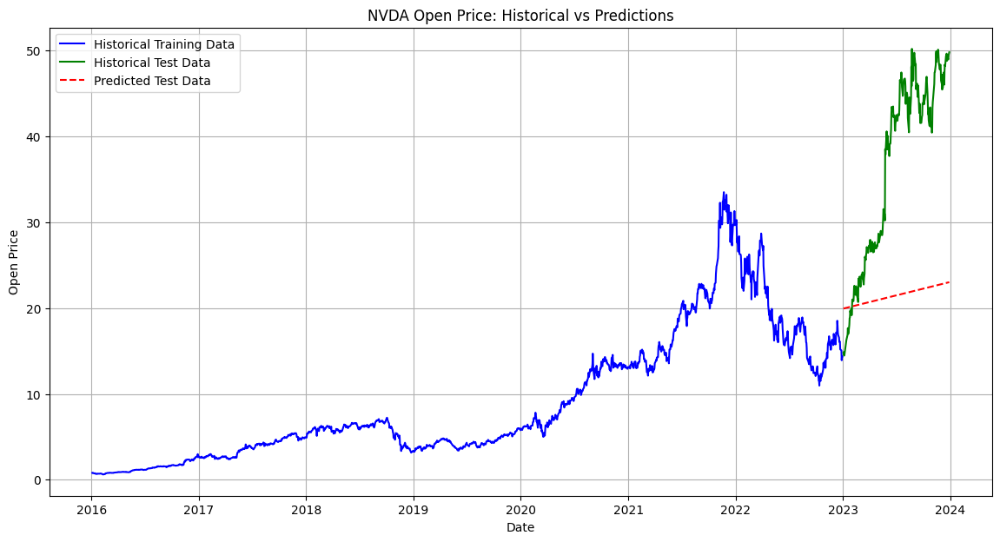

Training Set Metrics:
  Mean Squared Error (MSE): 15.90
  R² Score: 0.71

Testing Set Metrics:
  Mean Squared Error (MSE): 325.88
  R² Score: -1.78


In [68]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = train_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
train_y = train_data['Open'].values

test_X = test_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
test_y = test_data['Open'].values

model = LinearRegression()
model.fit(train_X, train_y)
train_predictions = model.predict(train_X)
test_predictions = model.predict(test_X)

mse = mean_squared_error(test_y, test_predictions)
r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")


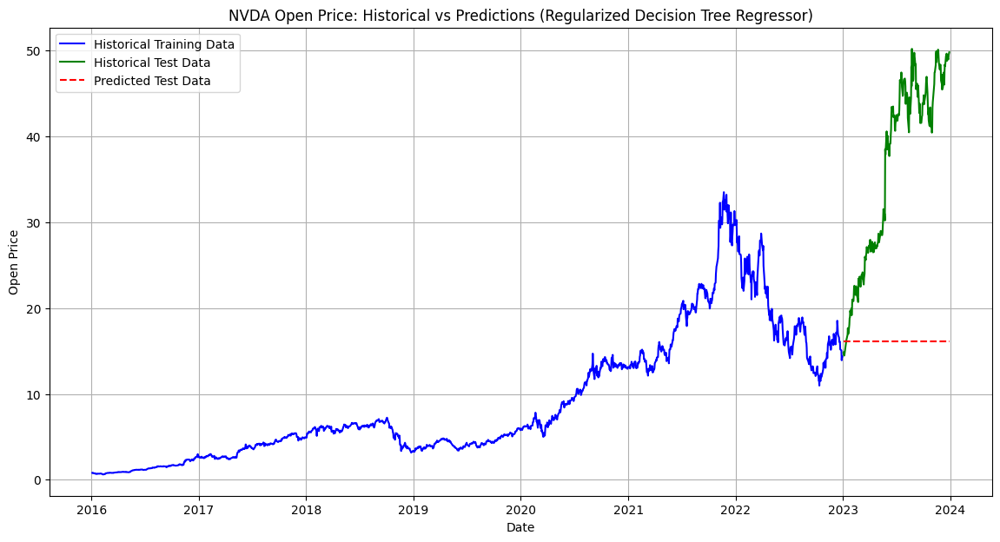

Training Set Metrics:
  Mean Squared Error (MSE): 0.77
  R² Score: 0.99

Testing Set Metrics:
  Mean Squared Error (MSE): 534.31
  R² Score: -3.56


In [69]:
#Regularised Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = train_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
train_y = train_data['Open'].values

test_X = test_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
test_y = test_data['Open'].values

# Initialize and train the Decision Tree Regressor with regularization
dt_model = DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42)
dt_model.fit(train_X, train_y)

train_predictions = dt_model.predict(train_X)
test_predictions = dt_model.predict(test_X)
train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)

# Calculate MSE and R² for the testing set
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Regularized Decision Tree Regressor)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")


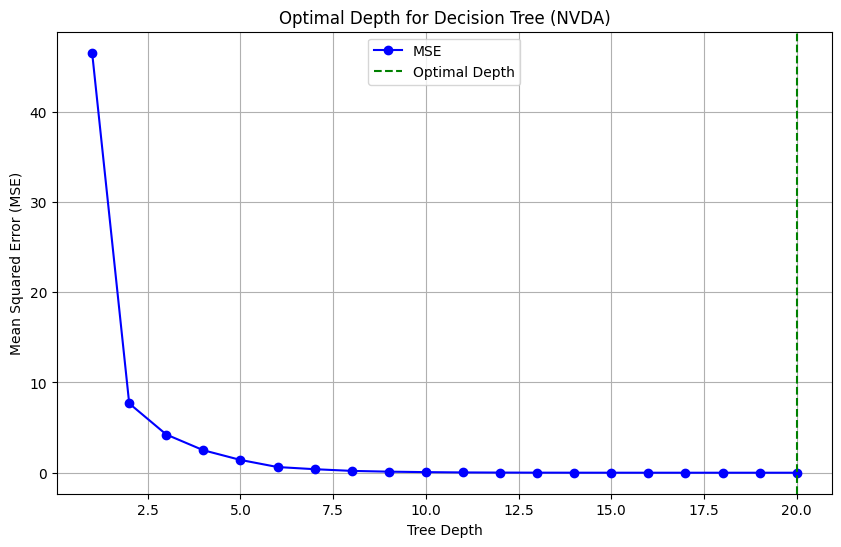

Optimal Depth for NVDA: 20


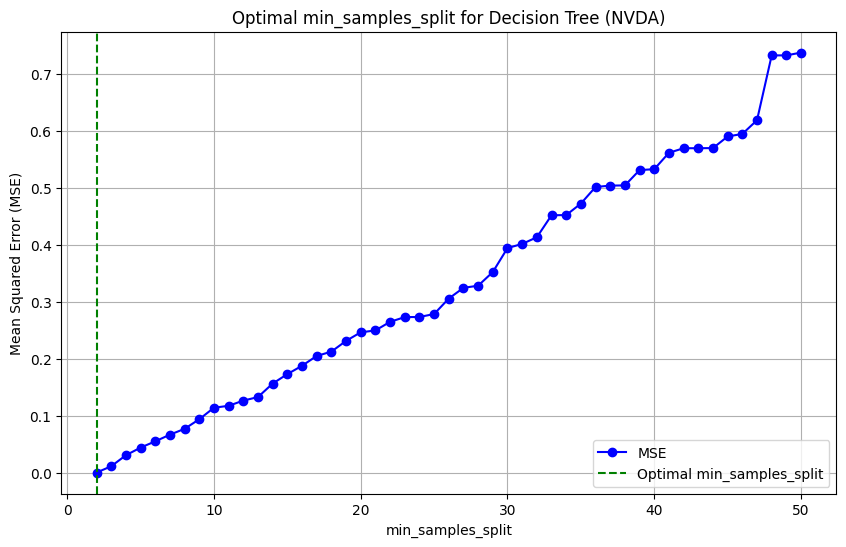

Optimal min_samples_split for NVDA: 2


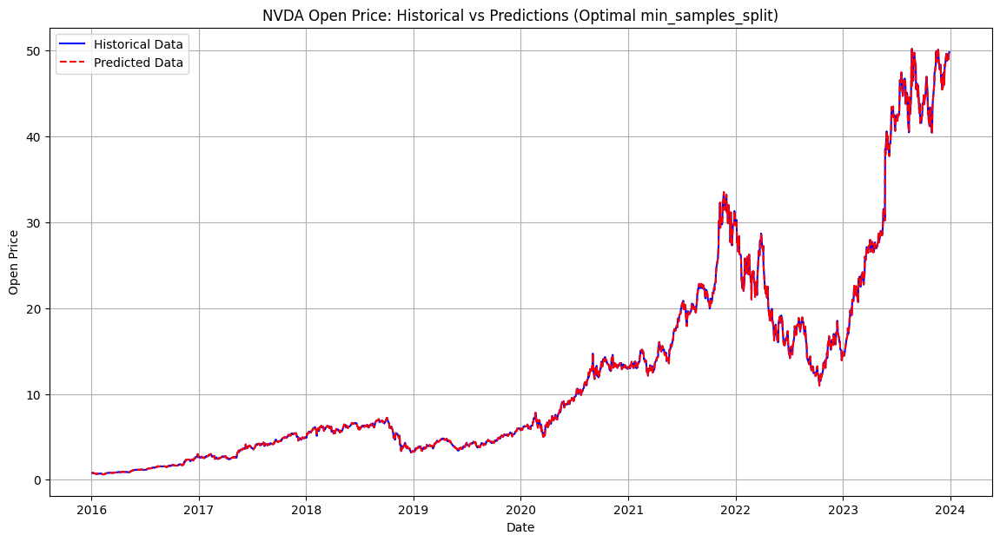


Final Metrics with Optimal min_samples_split:
  MSE: 0.00
  R²: 1.00


In [71]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

nvda_data = nvda_data.sort_values(by='Date')

nvda_data['Date_Ordinal'] = nvda_data['Date'].map(lambda x: x.toordinal())
nvda_data['SMA_60'] = nvda_data['Open'].rolling(window=60).mean().fillna(0)  # Fill NaN with 0

X = nvda_data[['Date_Ordinal', 'SMA_60']].values
y = nvda_data['Open'].values

dt_model = DecisionTreeRegressor(max_depth=5, random_state=42)
dt_model.fit(X, y)

depths = range(1, 21)
mse_list = []

for depth in depths:
    dt_model = DecisionTreeRegressor(max_depth=depth, random_state=42)
    dt_model.fit(X, y)
    predictions = dt_model.predict(X)
    mse_list.append(mean_squared_error(y, predictions))

plt.figure(figsize=(10, 6))
plt.plot(depths, mse_list, label="MSE", color="blue", marker="o")
plt.axvline(x=np.argmin(mse_list) + 1, color="green", linestyle="--", label="Optimal Depth")
plt.title("Optimal Depth for Decision Tree (NVDA)")
plt.xlabel("Tree Depth")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid(True)
plt.show()

# Determine and print the optimal depth
optimal_depth = np.argmin(mse_list) + 1
print(f"Optimal Depth for NVDA: {optimal_depth}")

# Retrain with optimal depth
dt_model_optimal = DecisionTreeRegressor(max_depth=optimal_depth, random_state=42)
dt_model_optimal.fit(X, y)

# Make predictions
final_predictions = dt_model_optimal.predict(X)

final_mse = mean_squared_error(y, final_predictions)
final_r2 = r2_score(y, final_predictions)

nvda_data = nvda_data.sort_values(by='Date')

nvda_data['Date_Ordinal'] = nvda_data['Date'].map(lambda x: x.toordinal())
nvda_data['SMA_60'] = nvda_data['Open'].rolling(window=60).mean().fillna(0)  # Fill NaN with 0

# Prepare feature matrix (X) and target vector (y)
X = nvda_data[['Date_Ordinal', 'SMA_60']].values
y = nvda_data['Open'].values

# Range of min_samples_split values to test
min_samples_splits = range(2, 51)  # Test from 2 to 50
mse_list = []

# Iterate through different min_samples_split values
for min_samples_split in min_samples_splits:
    dt_model = DecisionTreeRegressor(min_samples_split=min_samples_split, random_state=42)
    dt_model.fit(X, y)
    predictions = dt_model.predict(X)
    mse_list.append(mean_squared_error(y, predictions))

# Plot MSE vs min_samples_split
plt.figure(figsize=(10, 6))
plt.plot(min_samples_splits, mse_list, label="MSE", color="blue", marker="o")
plt.axvline(x=min_samples_splits[np.argmin(mse_list)], color="green", linestyle="--", label="Optimal min_samples_split")
plt.title("Optimal min_samples_split for Decision Tree (NVDA)")
plt.xlabel("min_samples_split")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid(True)
plt.show()

# Determine and print the optimal min_samples_split
optimal_min_samples_split = min_samples_splits[np.argmin(mse_list)]
print(f"Optimal min_samples_split for NVDA: {optimal_min_samples_split}")

# Retrain with optimal min_samples_split
dt_model_optimal = DecisionTreeRegressor(min_samples_split=optimal_min_samples_split, random_state=42)
dt_model_optimal.fit(X, y)

# Make predictions
final_predictions = dt_model_optimal.predict(X)

# Calculate MSE and R² for the entire dataset
final_mse = mean_squared_error(y, final_predictions)
final_r2 = r2_score(y, final_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(nvda_data['Date'], y, label='Historical Data', color='blue')
plt.plot(nvda_data['Date'], final_predictions, label='Predicted Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Optimal min_samples_split)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print final metrics
print("\nFinal Metrics with Optimal min_samples_split:")
print(f"  MSE: {final_mse:.2f}")
print(f"  R²: {final_r2:.2f}")


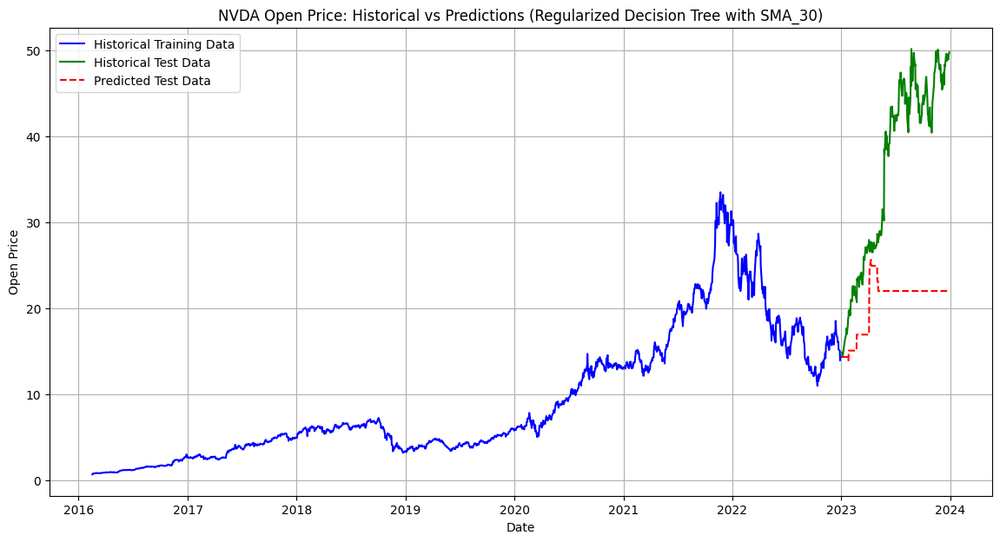

Training Set Metrics:
  Mean Squared Error (MSE): 0.00
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 333.17
  R² Score: -1.84


In [72]:
#decision tree regressor using SMA_30 days with optimal depth and min sample split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Add a 30-day simple moving average (SMA_30) to the nvda_data DataFrame
nvda_data['SMA_30'] = nvda_data['Open'].rolling(window=30).mean()

# Drop NaN values caused by the rolling calculation
nvda_data = nvda_data.dropna(subset=['SMA_30'])

# Prepare the data for training and testing
# Filter data for training (up to end of 2022) and testing (2023)
train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

# Features: Date converted to ordinal and SMA_90
train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'SMA_30': train_data['SMA_30']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'SMA_30': test_data['SMA_30']
})
test_y = test_data['Open'].values

# Initialize and train the Decision Tree Regressor with regularization
dt_model = DecisionTreeRegressor(max_depth=20, min_samples_split=2, random_state=42)
dt_model.fit(train_X, train_y)

# Make predictions
train_predictions = dt_model.predict(train_X)
test_predictions = dt_model.predict(test_X)

# Calculate MSE and R² for the training set
train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)

# Calculate MSE and R² for the testing set
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Regularized Decision Tree with SMA_30)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

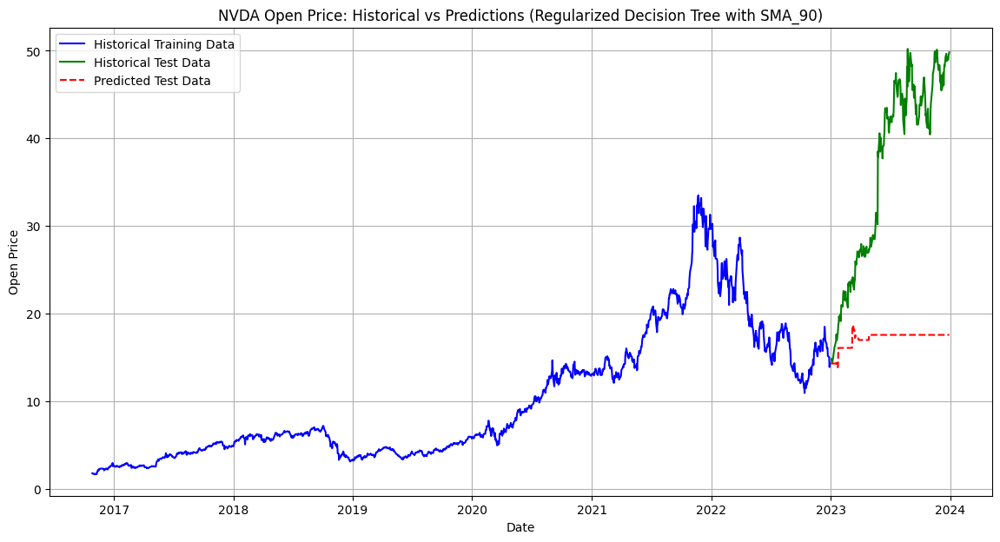

Training Set Metrics:
  Mean Squared Error (MSE): 0.00
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 477.68
  R² Score: -3.07


In [74]:
#decision tree regressor using SMA90 days
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

nvda_data['SMA_90'] = nvda_data['Open'].rolling(window=90).mean()

nvda_data = nvda_data.dropna(subset=['SMA_90'])

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

# Features: Date converted to ordinal and SMA_90
train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'SMA_90': train_data['SMA_90']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'SMA_90': test_data['SMA_90']
})
test_y = test_data['Open'].values

dt_model = DecisionTreeRegressor(max_depth=20, min_samples_split=2, random_state=42)
dt_model.fit(train_X, train_y)
train_predictions = dt_model.predict(train_X)
test_predictions = dt_model.predict(test_X)

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Regularized Decision Tree with SMA_90)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

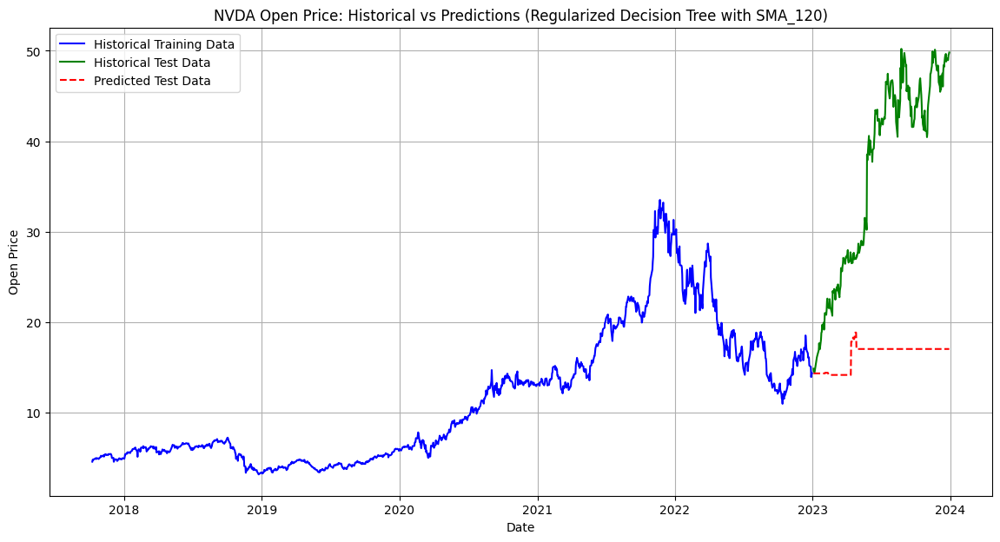

Training Set Metrics:
  Mean Squared Error (MSE): 0.00
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 505.92
  R² Score: -3.32


In [77]:
#decision tree regressor using SMA_120 days
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

nvda_data['SMA_120'] = nvda_data['Open'].rolling(window=120).mean()

nvda_data = nvda_data.dropna(subset=['SMA_120'])

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'SMA_120': train_data['SMA_120']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'SMA_120': test_data['SMA_120']
})
test_y = test_data['Open'].values

dt_model = DecisionTreeRegressor(max_depth=20, min_samples_split=2, random_state=42)
dt_model.fit(train_X, train_y)

train_predictions = dt_model.predict(train_X)
test_predictions = dt_model.predict(test_X)
train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)

test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Regularized Decision Tree with SMA_120)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

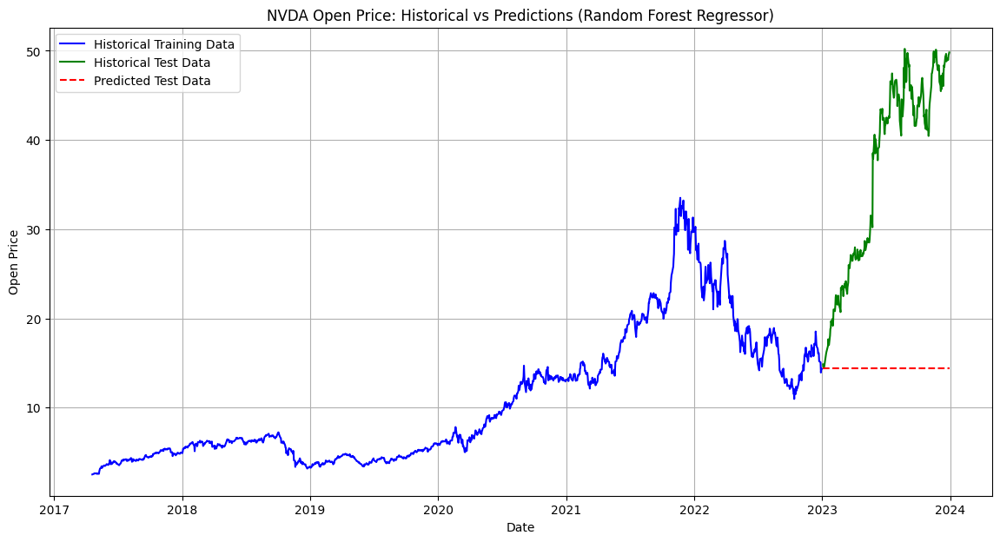

Training Set Metrics:
  Mean Squared Error (MSE): 0.02
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 607.06
  R² Score: -4.18


In [76]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = train_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
train_y = train_data['Open'].values

test_X = test_data['Date'].map(lambda x: x.toordinal()).values.reshape(-1, 1)
test_y = test_data['Open'].values

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(train_X, train_y)
train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Random Forest Regressor)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

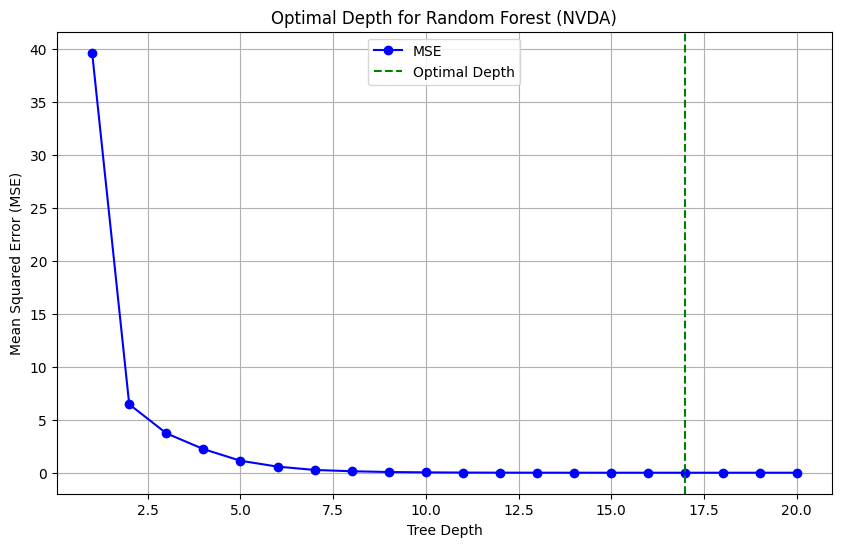

Optimal Depth for NVDA: 17


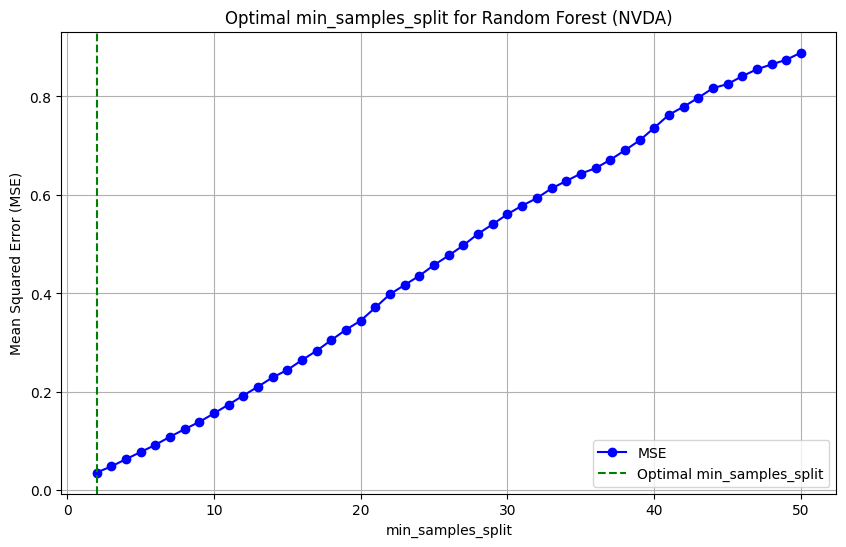

Optimal min_samples_split for NVDA: 2


In [78]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

nvda_data = nvda_data.sort_values(by='Date')

# Feature Engineering: Add Date_Ordinal and 60-day SMA
nvda_data['Date_Ordinal'] = nvda_data['Date'].map(lambda x: x.toordinal())
nvda_data['SMA_60'] = nvda_data['Open'].rolling(window=60).mean().fillna(0)  # Fill NaN with 0

# Prepare feature matrix (X) and target vector (y)
X = nvda_data[['Date_Ordinal', 'SMA_60']].values
y = nvda_data['Open'].values

# Initialize a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Find Optimal Depth for Random Forest
depths = range(1, 21)  # Test depths from 1 to 20
mse_list_depth = []

for depth in depths:
    rf_model = RandomForestRegressor(max_depth=depth, n_estimators=100, random_state=42)
    rf_model.fit(X, y)
    predictions = rf_model.predict(X)
    mse_list_depth.append(mean_squared_error(y, predictions))

# Plot MSE vs Depth
plt.figure(figsize=(10, 6))
plt.plot(depths, mse_list_depth, label="MSE", color="blue", marker="o")
plt.axvline(x=np.argmin(mse_list_depth) + 1, color="green", linestyle="--", label="Optimal Depth")
plt.title("Optimal Depth for Random Forest (NVDA)")
plt.xlabel("Tree Depth")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid(True)
plt.show()

# Determine and print the optimal depth
optimal_depth = np.argmin(mse_list_depth) + 1
print(f"Optimal Depth for NVDA: {optimal_depth}")

# Find Optimal min_samples_split for Random Forest
min_samples_splits = range(2, 51)  # Test from 2 to 50
mse_list_split = []

for min_samples_split in min_samples_splits:
    rf_model = RandomForestRegressor(max_depth=optimal_depth, min_samples_split=min_samples_split, n_estimators=100, random_state=42)
    rf_model.fit(X, y)
    predictions = rf_model.predict(X)
    mse_list_split.append(mean_squared_error(y, predictions))

# Plot MSE vs min_samples_split
plt.figure(figsize=(10, 6))
plt.plot(min_samples_splits, mse_list_split, label="MSE", color="blue", marker="o")
plt.axvline(x=min_samples_splits[np.argmin(mse_list_split)], color="green", linestyle="--", label="Optimal min_samples_split")
plt.title("Optimal min_samples_split for Random Forest (NVDA)")
plt.xlabel("min_samples_split")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid(True)
plt.show()

# Determine and print the optimal min_samples_split
optimal_min_samples_split = min_samples_splits[np.argmin(mse_list_split)]
print(f"Optimal min_samples_split for NVDA: {optimal_min_samples_split}")

# Retrain Random Forest with Optimal Depth and min_samples_split
rf_model_optimal = RandomForestRegressor(max_depth=optimal_depth, min_samples_split=optimal_min_samples_split, n_estimators=100, random_state=42)
rf_model_optimal.fit(X, y)

# Make Predictions
final_predictions = rf_model_optimal.predict(X)

# Calculate MSE and R² for the entire dataset
final_mse = mean_squared_error(y, final_predictions)
final_r2 = r2_score(y, final_predictions)

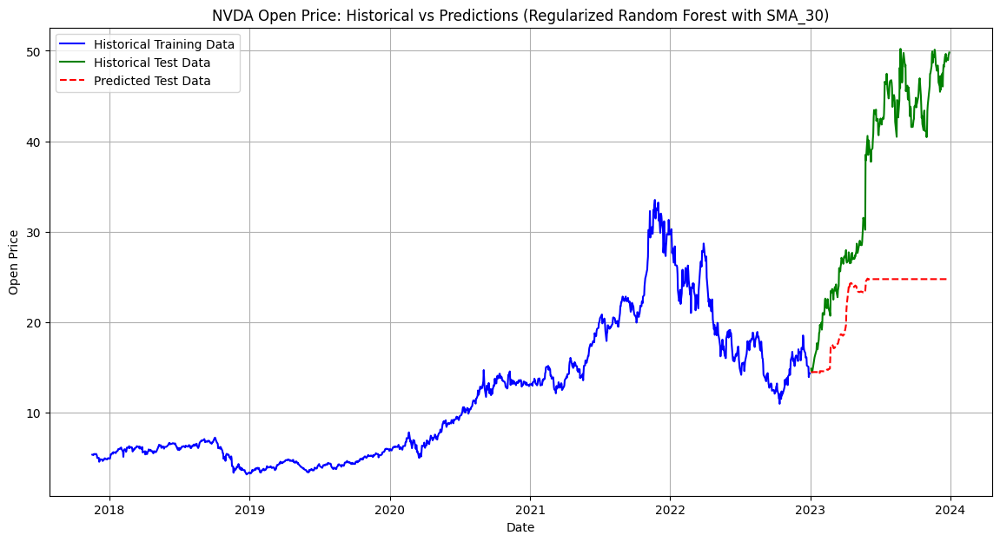

Training Set Metrics:
  Mean Squared Error (MSE): 0.02
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 260.17
  R² Score: -1.22


In [79]:
# Add a 30-day simple moving average (SMA) to the nvda_data DataFrame
nvda_data['SMA_30'] = nvda_data['Open'].rolling(window=30).mean()

nvda_data = nvda_data.dropna(subset=['SMA_30'])

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'SMA_30': train_data['SMA_30']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'SMA_30': test_data['SMA_30']
})
test_y = test_data['Open'].values

rf_model = RandomForestRegressor(
    n_estimators=100, max_depth=17, min_samples_split=2, random_state=42
)
rf_model.fit(train_X, train_y)

train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Regularized Random Forest with SMA_30)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

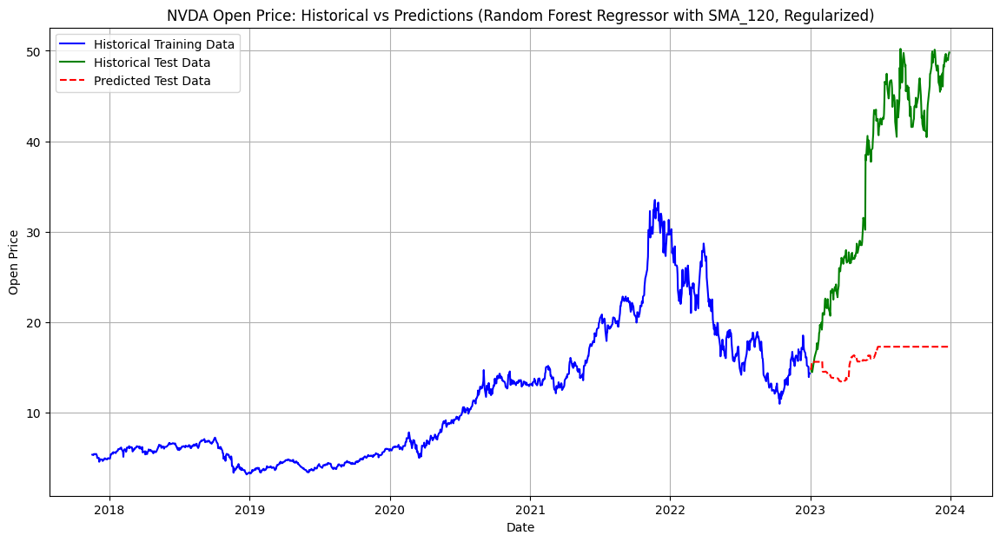

Training Set Metrics:
  Mean Squared Error (MSE): 0.02
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 506.75
  R² Score: -3.32


In [80]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'SMA_120': train_data['SMA_120']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'SMA_120': test_data['SMA_120']
})
test_y = test_data['Open'].values

# Initialize and train the Random Forest Regressor with regularization
rf_model = RandomForestRegressor(
    n_estimators=100, max_depth=17, min_samples_split=2, random_state=42
)
rf_model.fit(train_X, train_y)

train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)
train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)

test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Random Forest Regressor with SMA_120, Regularized)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

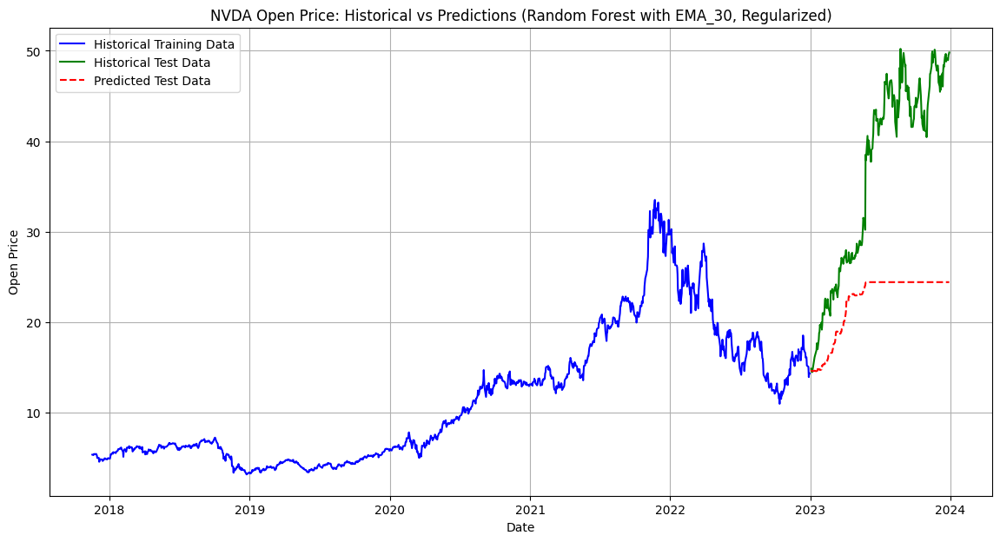

Training Set Metrics:
  Mean Squared Error (MSE): 0.03
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 266.92
  R² Score: -1.28


In [81]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd

nvda_data['EMA_30'] = nvda_data['Open'].ewm(span=30, adjust=False).mean()

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'EMA_30': train_data['EMA_30']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'EMA_30': test_data['EMA_30']
})
test_y = test_data['Open'].values

rf_model = RandomForestRegressor(
    n_estimators=100, max_depth=17, min_samples_split=2, random_state=42
)
rf_model.fit(train_X, train_y)

train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Random Forest with EMA_30, Regularized)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")

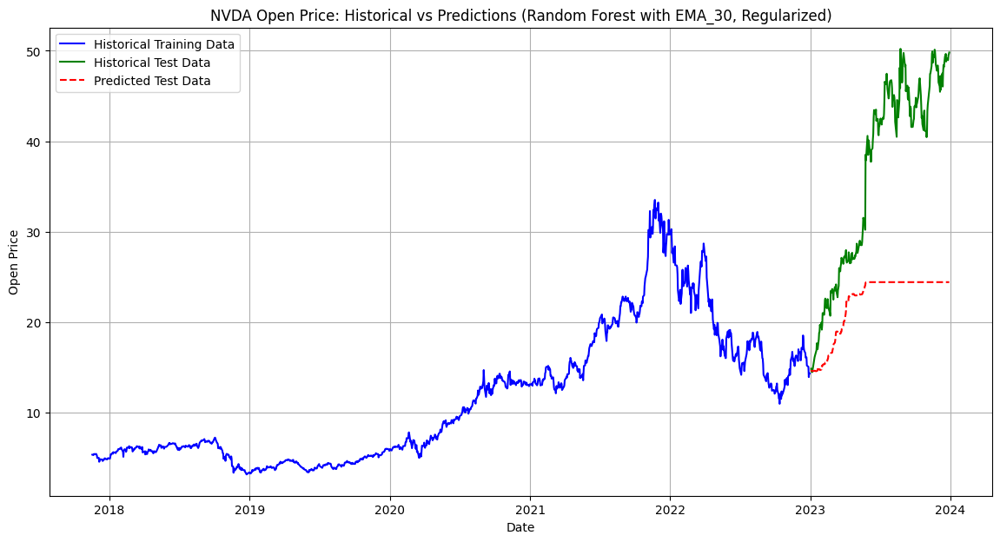

Training Set Metrics:
  Mean Squared Error (MSE): 0.03
  R² Score: 1.00

Testing Set Metrics:
  Mean Squared Error (MSE): 266.92
  R² Score: -1.28


In [82]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd

nvda_data['EMA_30'] = nvda_data['Open'].ewm(span=30, adjust=False).mean()

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

train_X = pd.DataFrame({
    'Date_Ordinal': train_data['Date'].map(lambda x: x.toordinal()),
    'EMA_30': train_data['EMA_30']
})
train_y = train_data['Open'].values

test_X = pd.DataFrame({
    'Date_Ordinal': test_data['Date'].map(lambda x: x.toordinal()),
    'EMA_30': test_data['EMA_30']
})
test_y = test_data['Open'].values

# Initialize and train the Random Forest Regressor with regularization
rf_model = RandomForestRegressor(
    n_estimators=100, max_depth=17, min_samples_split=2, random_state=42
)
rf_model.fit(train_X, train_y)

train_predictions = rf_model.predict(train_X)
test_predictions = rf_model.predict(test_X)

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (Random Forest with EMA_30, Regularized)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()

# Print performance metrics
print("Training Set Metrics:")
print(f"  Mean Squared Error (MSE): {train_mse:.2f}")
print(f"  R² Score: {train_r2:.2f}")

print("\nTesting Set Metrics:")
print(f"  Mean Squared Error (MSE): {test_mse:.2f}")
print(f"  R² Score: {test_r2:.2f}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 30, 50)              │          10,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,651 (119.73 KB)

 Trainable params: 30,651 (119.73 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0505 - val_loss: 0.0815
Epoch 2/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0020 - val_loss: 0.0399
Epoch 3/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0015 - val_loss: 0.0166
Epoch 4/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0013 - val_loss: 0.0144
Epoch 5/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0011 - val_loss: 0.0119
Epoch 6/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 9.8675e-04 - val_loss: 0.0068
Epoch 7/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 8.3330e-04 - val_loss: 0.0089
Epoch 8/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 9.0420e-04 - val_loss: 0.0165
Epoch 9/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 7.8107e-04 - val_loss: 0.0054
Epoch 10/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 8.5263e-04 - val_loss: 0.0201
Epoch 11/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 7.7709e-04 - val_loss: 0.0138
Epoch 12/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 

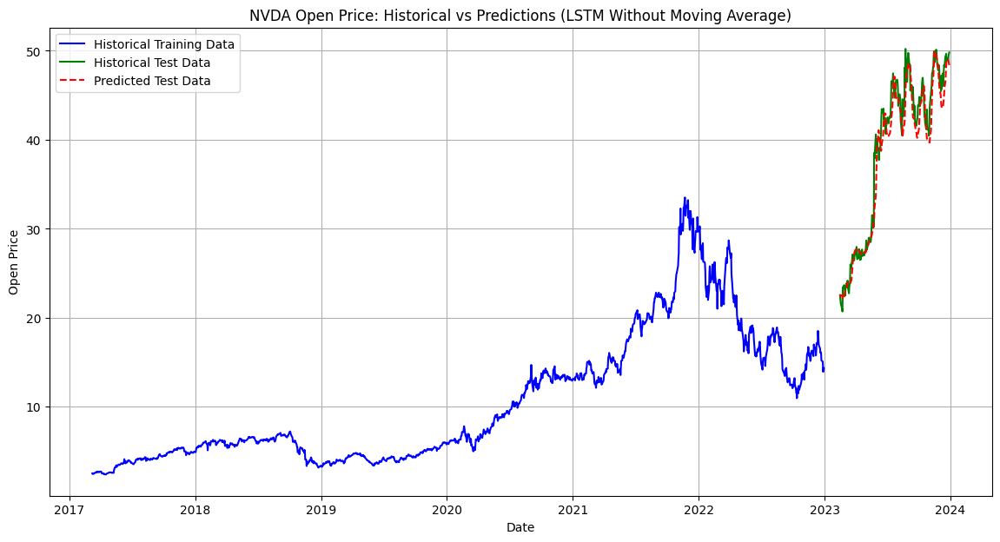

In [14]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] > '2022-12-31') & (nvda_data['Date'] <= '2023-12-31')]

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_data[['Open']].values)
test_scaled = scaler.transform(test_data[['Open']].values)

# Create sequences for LSTM (lookback = 30 days)
def create_sequences(data, lookback=30):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i - lookback:i, 0])  # Use 'Open' price as feature
        y.append(data[i, 0])  # Use 'Open' price as target
    return np.array(X), np.array(y)

lookback = 30
train_X, train_y = create_sequences(train_scaled, lookback)
test_X, test_y = create_sequences(test_scaled, lookback)

# Reshape input data for LSTM (samples, time steps, features)
train_X = train_X.reshape(train_X.shape[0], train_X.shape[1], 1)
test_X = test_X.reshape(test_X.shape[0], test_X.shape[1], 1)

# Build the LSTM model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(50, activation='relu', return_sequences=True, input_shape=(lookback, 1)),
    tf.keras.layers.LSTM(50, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mse')
model.summary()

history = model.fit(train_X, train_y, epochs=20, batch_size=32, validation_data=(test_X, test_y), verbose=1)

train_predictions = model.predict(train_X)
test_predictions = model.predict(test_X)

# Rescale predictions
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Rescale true values
train_y = scaler.inverse_transform(train_y.reshape(-1, 1))
test_y = scaler.inverse_transform(test_y.reshape(-1, 1))

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
print("TrainMSE = ", train_mse)
print("TrainR2 = ", train_r2)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)
print("TestMSE = ", test_mse)
print("TestR2 = ", test_r2)

plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'].iloc[lookback:], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'].iloc[lookback:], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'].iloc[lookback:], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (LSTM Without Moving Average)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 30, 50)              │          10,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,851 (120.51 KB)

 Trainable params: 30,851 (120.51 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0451 - val_loss: 0.0973
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0027 - val_loss: 0.0215
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0021 - val_loss: 0.0204
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0017 - val_loss: 0.0101
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0014 - val_loss: 0.0071
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0011 - val_loss: 0.0274
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0012 - val_loss: 0.0129
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 9.6118e-04 - val_loss: 0.0189
Epoch 9/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 9.7734e-04 - val_loss: 0.0387
Epoch 10/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 9.0882e-04 - val_loss: 0.0106
Epoch 11/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 7.7202e-04 - val_loss: 0.0116
Epoch 12/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/

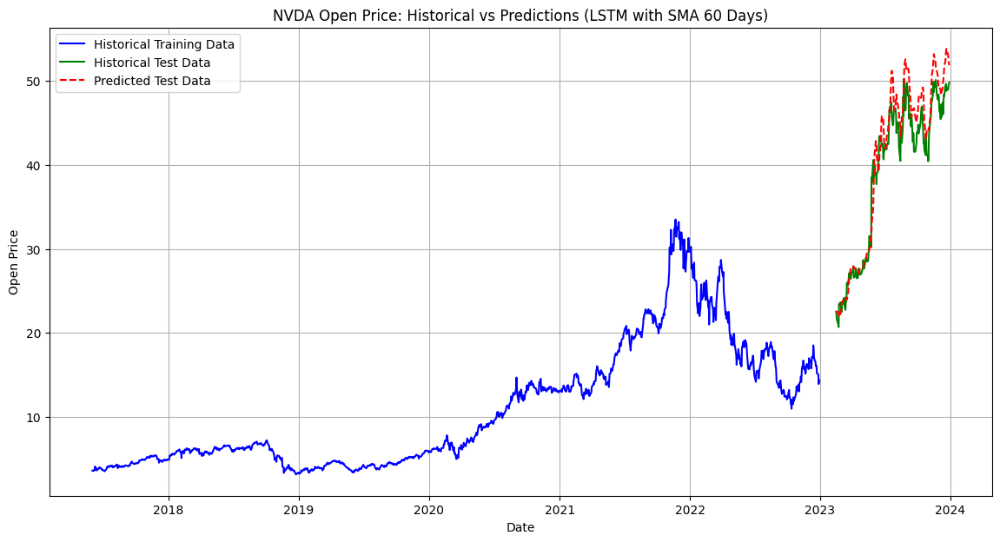

In [15]:
#LSTM with SMA60
import numpy as np
import tensorflow as tf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

nvda_data['SMA_60'] = nvda_data['Open'].rolling(window=60).mean()
nvda_data = nvda_data.dropna(subset=['SMA_60'])  # Drop rows with NaN values due to SMA calculation

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_data[['Open', 'SMA_60']].values)
test_scaled = scaler.transform(test_data[['Open', 'SMA_60']].values)

# Create sequences for LSTM (lookback = 30 days)
def create_sequences(data, lookback=30):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i - lookback:i, :])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

lookback = 30
train_X, train_y = create_sequences(train_scaled, lookback)
test_X, test_y = create_sequences(test_scaled, lookback)

# Reshape input data for LSTM (samples, time steps, features)
train_X = train_X.reshape(train_X.shape[0], train_X.shape[1], train_X.shape[2])
test_X = test_X.reshape(test_X.shape[0], test_X.shape[1], test_X.shape[2])

# Build the LSTM model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(50, activation='relu', return_sequences=True, input_shape=(lookback, 2)),
    tf.keras.layers.LSTM(50, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mse')
model.summary()

history = model.fit(train_X, train_y, epochs=20, batch_size=32, validation_data=(test_X, test_y), verbose=1)

train_predictions = model.predict(train_X)
test_predictions = model.predict(test_X)

train_predictions = scaler.inverse_transform(np.concatenate((train_predictions, train_X[:, -1, 1:]), axis=1))[:, 0]
test_predictions = scaler.inverse_transform(np.concatenate((test_predictions, test_X[:, -1, 1:]), axis=1))[:, 0]

train_y = scaler.inverse_transform(np.concatenate((train_y.reshape(-1, 1), train_X[:, -1, 1:]), axis=1))[:, 0]
test_y = scaler.inverse_transform(np.concatenate((test_y.reshape(-1, 1), test_X[:, -1, 1:]), axis=1))[:, 0]

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
print("TrainMSE = ", train_mse)
print("TrainR2 = ", train_r2)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)
print("TestMSE = ", test_mse)
print("TestR2 = ", test_r2)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'].iloc[lookback:], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'].iloc[lookback:], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'].iloc[lookback:], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (LSTM with SMA 60 Days)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_248 (LSTM)                      │ (None, 30, 50)              │          10,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_249 (LSTM)                      │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_124 (Dense)                    │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 30,851 (120.51 KB)

 Trainable params: 30,851 (120.51 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.0706 - val_loss: 0.1676
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0034 - val_loss: 0.0575
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0020 - val_loss: 0.0125
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.0018 - val_loss: 0.0105
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.0013 - val_loss: 0.0159
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.0016 - val_loss: 0.0092
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 9.9808e-04 - val_loss: 0.0202
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.0013 - val_loss: 0.0105
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 9.4688e-04 - val_loss: 0.0200
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.0010 - val_loss: 0.0198
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 8.6488e-04 - val_loss: 0.0198
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/

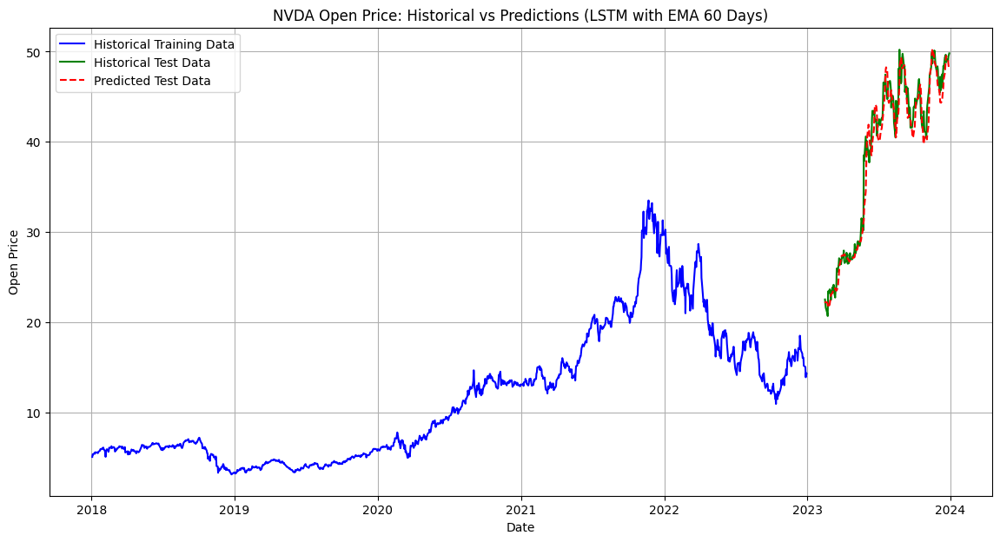

In [84]:
#LSTM EMA 60
import numpy as np
import tensorflow as tf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

nvda_data['EMA_60'] = nvda_data['Open'].ewm(span=60, adjust=False).mean()
nvda_data = nvda_data.dropna(subset=['EMA_60'])

train_data = nvda_data[nvda_data['Date'] <= '2022-12-31']
test_data = nvda_data[(nvda_data['Date'] >= '2023-01-01') & (nvda_data['Date'] <= '2023-12-31')]

scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_data[['Open', 'EMA_60']].values)
test_scaled = scaler.transform(test_data[['Open', 'EMA_60']].values)

# Create sequences for LSTM (lookback = 30 days)
def create_sequences(data, lookback=30):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i - lookback:i, :])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

lookback = 30
train_X, train_y = create_sequences(train_scaled, lookback)
test_X, test_y = create_sequences(test_scaled, lookback)

# Reshape input data for LSTM (samples, time steps, features)
train_X = train_X.reshape(train_X.shape[0], train_X.shape[1], train_X.shape[2])
test_X = test_X.reshape(test_X.shape[0], test_X.shape[1], test_X.shape[2])

# Build the LSTM model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(50, activation='relu', return_sequences=True, input_shape=(lookback, 2)),
    tf.keras.layers.LSTM(50, activation='relu'),
    tf.keras.layers.Dense(1)
])

model.compile(optimizer='adam', loss='mse')
model.summary()

history = model.fit(train_X, train_y, epochs=20, batch_size=32, validation_data=(test_X, test_y), verbose=1)

train_predictions = model.predict(train_X)
test_predictions = model.predict(test_X)

train_predictions = scaler.inverse_transform(np.concatenate((train_predictions, train_X[:, -1, 1:]), axis=1))[:, 0]
test_predictions = scaler.inverse_transform(np.concatenate((test_predictions, test_X[:, -1, 1:]), axis=1))[:, 0]

train_y = scaler.inverse_transform(np.concatenate((train_y.reshape(-1, 1), train_X[:, -1, 1:]), axis=1))[:, 0]
test_y = scaler.inverse_transform(np.concatenate((test_y.reshape(-1, 1), test_X[:, -1, 1:]), axis=1))[:, 0]

train_mse = mean_squared_error(train_y, train_predictions)
train_r2 = r2_score(train_y, train_predictions)
print("TrainMSE = ", train_mse)
print("TrainR2 = ", train_r2)
test_mse = mean_squared_error(test_y, test_predictions)
test_r2 = r2_score(test_y, test_predictions)
print("TestMSE = ", test_mse)
print("TestR2 = ", test_r2)

# Plot historical and predicted data
plt.figure(figsize=(14, 7))
plt.plot(train_data['Date'].iloc[lookback:], train_y, label='Historical Training Data', color='blue')
plt.plot(test_data['Date'].iloc[lookback:], test_y, label='Historical Test Data', color='green')
plt.plot(test_data['Date'].iloc[lookback:], test_predictions, label='Predicted Test Data', color='red', linestyle='dashed')
plt.title("NVDA Open Price: Historical vs Predictions (LSTM with EMA 60 Days)")
plt.xlabel("Date")
plt.ylabel("Open Price")
plt.legend()
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for AAPL:
  Train MSE: 12.82, Train RMSE: 3.58, Train R²: 0.99
  Test MSE: 28.84, Test RMSE: 5.37, Test R²: 0.91
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1

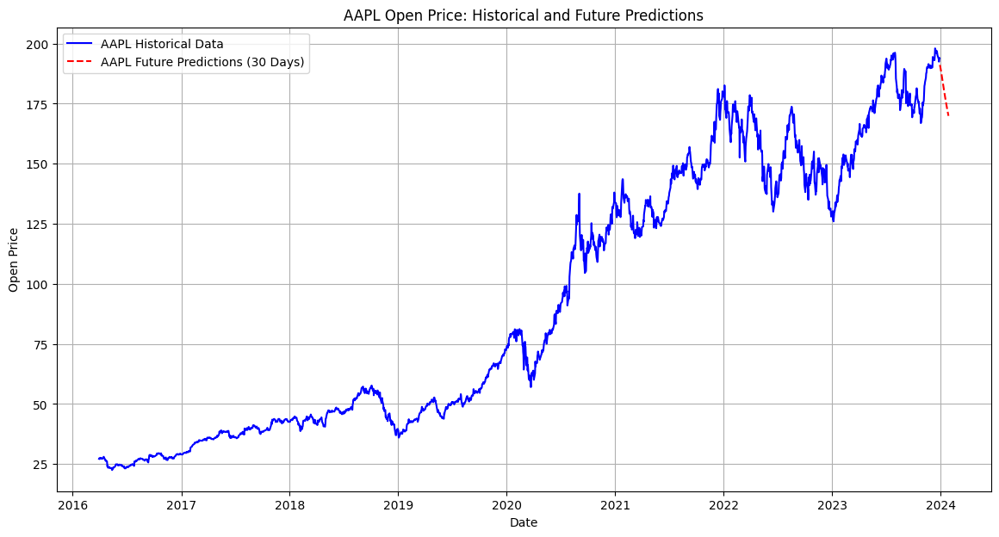

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for ABBV:
  Train MSE: 13.12, Train RMSE: 3.62, Train R²: 0.98
  Test MSE: 23.79, Test RMSE: 4.88, Test R²: 0.60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1

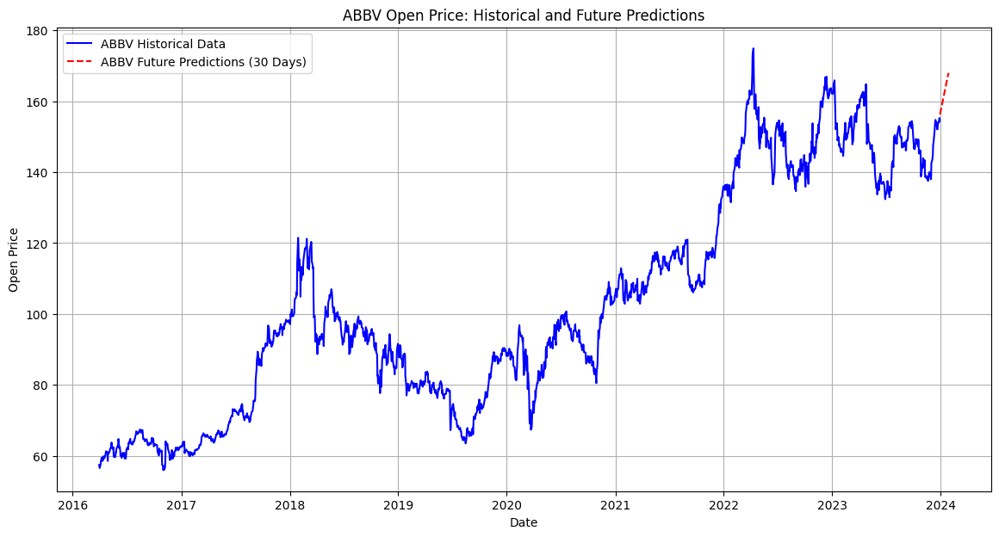

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Metrics for AMT:
  Train MSE: 39.99, Train RMSE: 6.32, Train R²: 0.99
  Test MSE: 67.61, Test RMSE: 8.22, Test R²: 0.76
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 

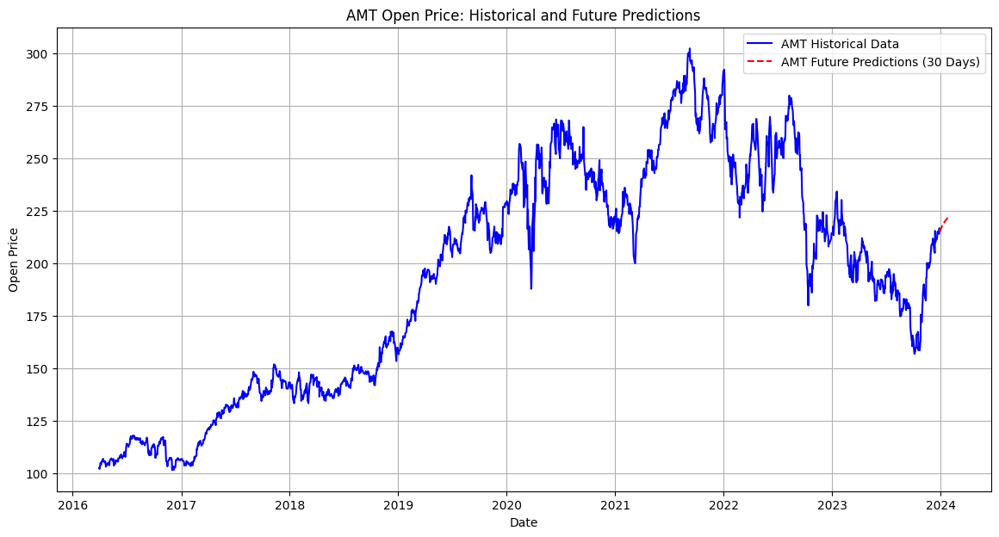

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Metrics for AMZN:
  Train MSE: 20.31, Train RMSE: 4.51, Train R²: 0.99
  Test MSE: 15.39, Test RMSE: 3.92, Test R²: 0.96
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1

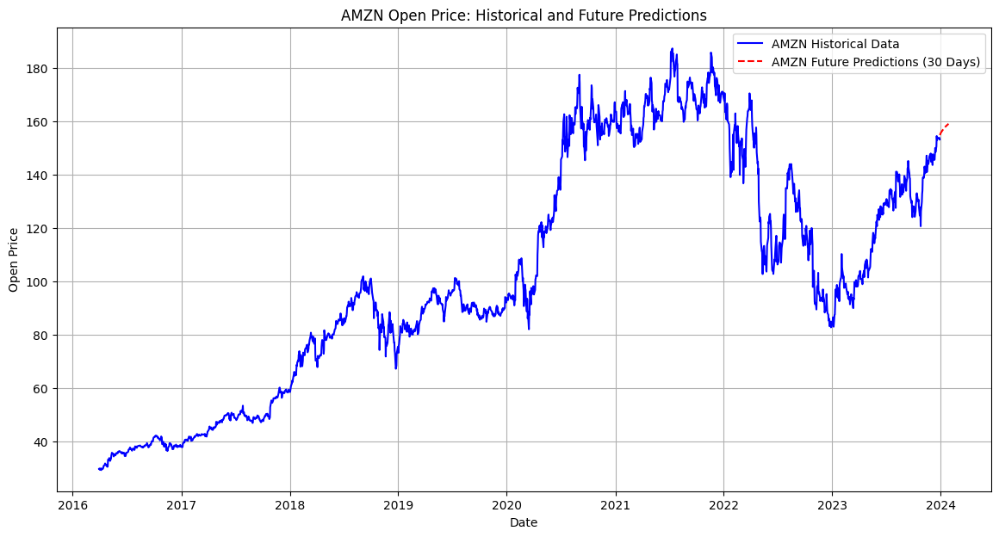

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for APD:
  Train MSE: 32.37, Train RMSE: 5.69, Train R²: 0.99
  Test MSE: 45.57, Test RMSE: 6.75, Test R²: 0.68
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 

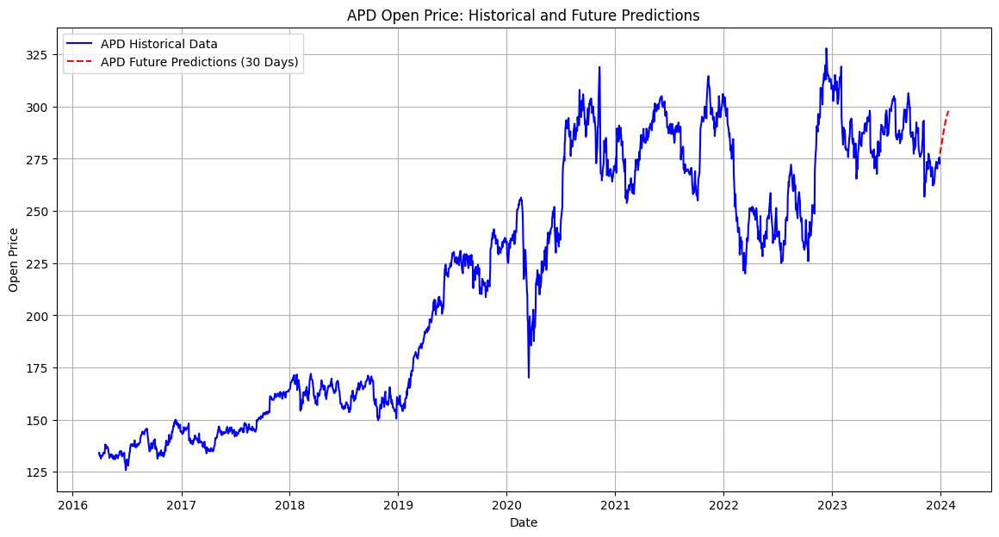

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for AVGO:
  Train MSE: 2.28, Train RMSE: 1.51, Train R²: 0.99
  Test MSE: 80.26, Test RMSE: 8.96, Test R²: 0.65
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 

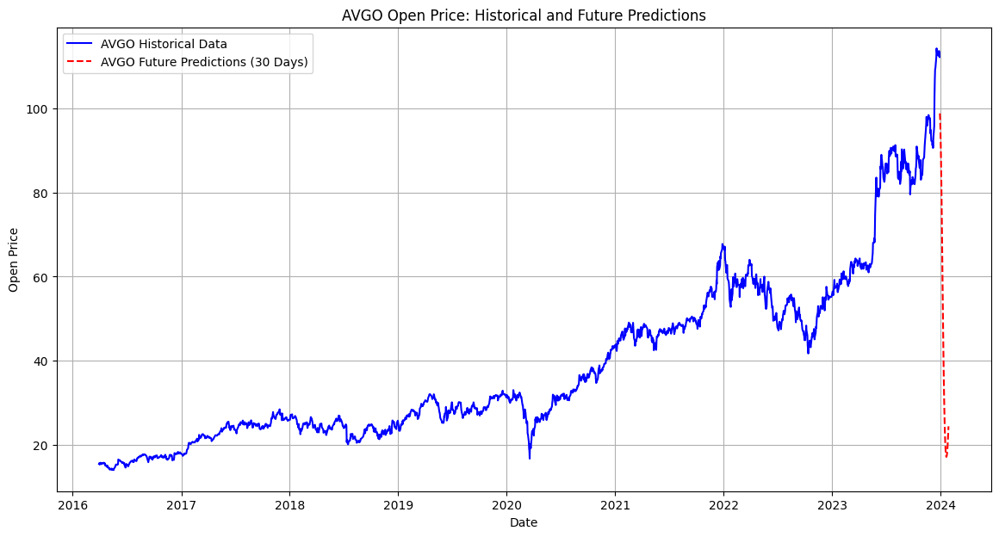

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for BAC:
  Train MSE: 1.33, Train RMSE: 1.15, Train R²: 0.98
  Test MSE: 1.11, Test RMSE: 1.05, Test R²: 0.85
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━

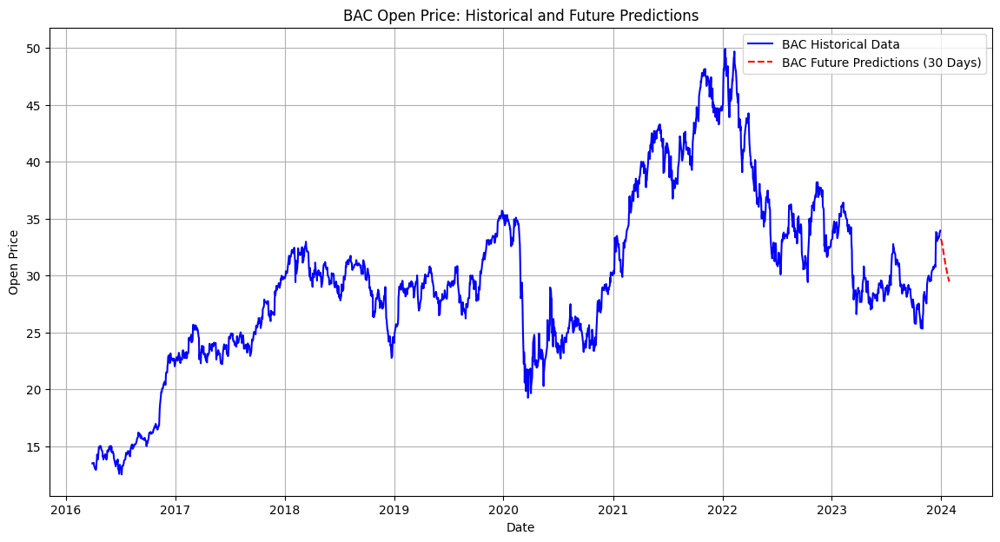

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for BKNG:
  Train MSE: 4208.12, Train RMSE: 64.87, Train R²: 0.95
  Test MSE: 7692.30, Test RMSE: 87.71, Test R²: 0.93
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/st

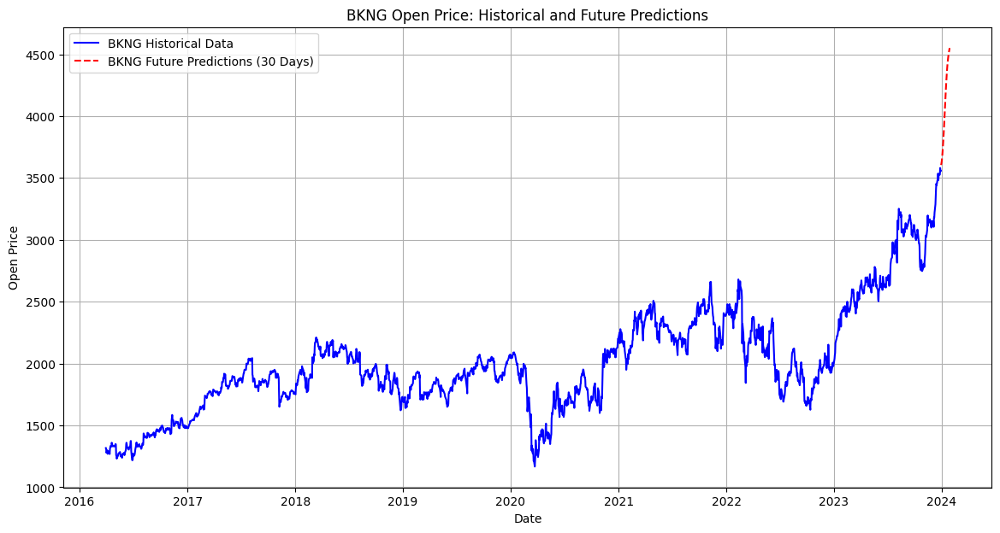

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for CAT:
  Train MSE: 26.71, Train RMSE: 5.17, Train R²: 0.99
  Test MSE: 59.65, Test RMSE: 7.72, Test R²: 0.89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 

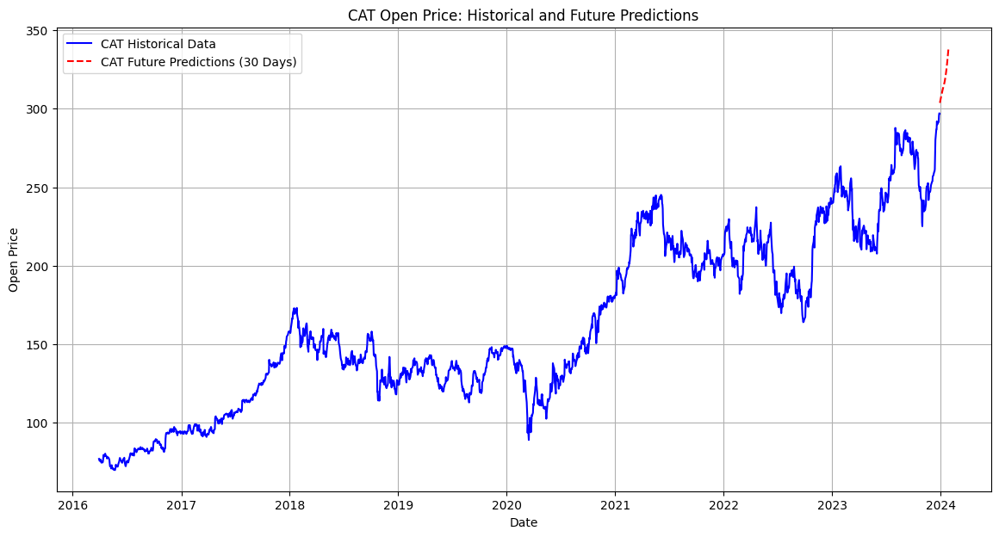

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for CEG:
  Train MSE: 30.53, Train RMSE: 5.53, Train R²: 0.84
  Test MSE: 23.19, Test RMSE: 4.82, Test R²: 0.91
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━

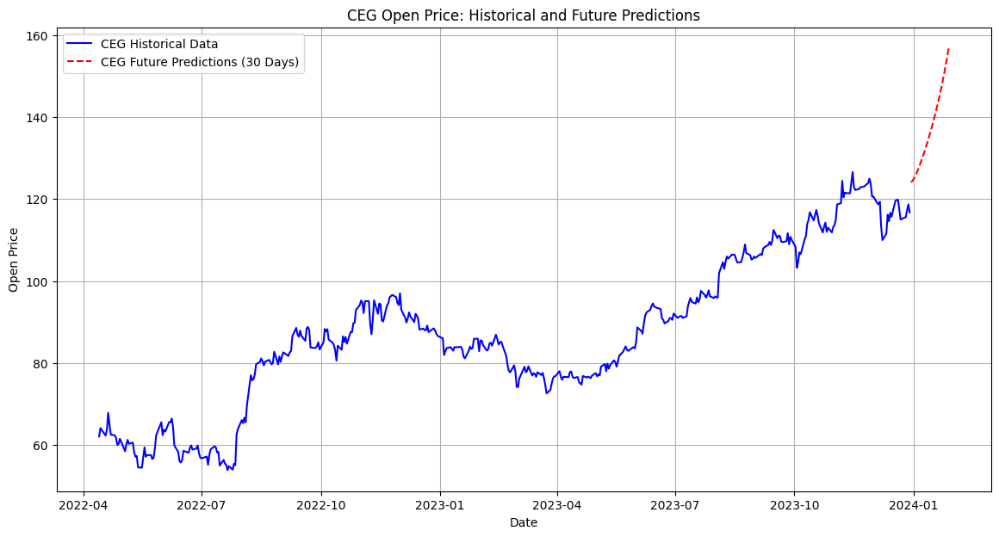

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for COP:
  Train MSE: 9.12, Train RMSE: 3.02, Train R²: 0.98
  Test MSE: 17.58, Test RMSE: 4.19, Test R²: 0.74
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━

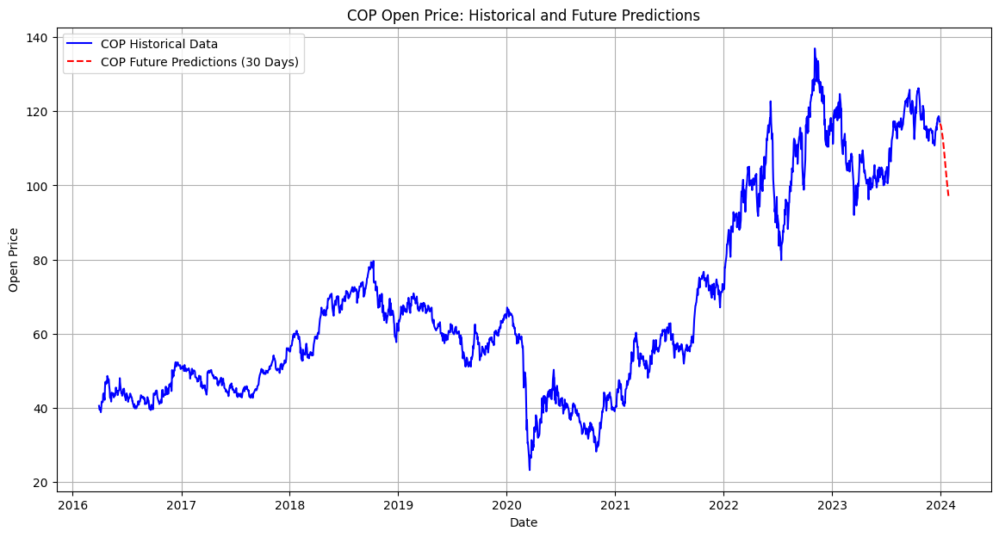

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for COST:
  Train MSE: 91.21, Train RMSE: 9.55, Train R²: 0.99
  Test MSE: 170.44, Test RMSE: 13.06, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1

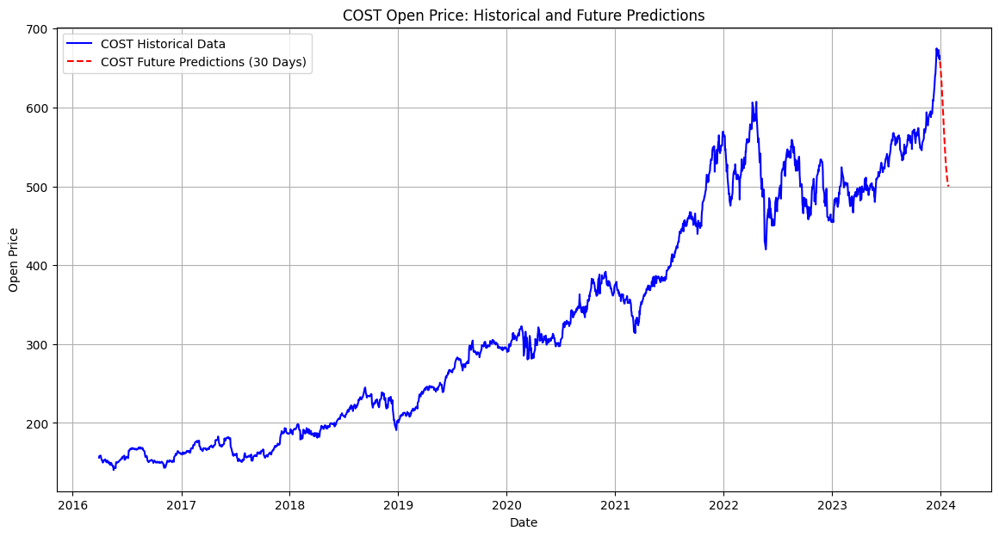

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for CVX:
  Train MSE: 20.79, Train RMSE: 4.56, Train R²: 0.96
  Test MSE: 44.18, Test RMSE: 6.65, Test R²: 0.51
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 

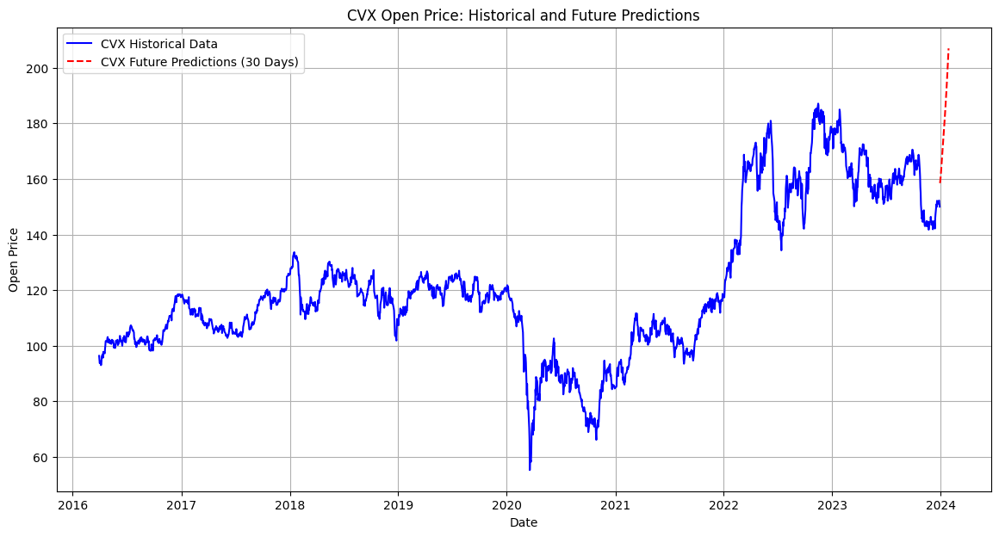

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for DIS:
  Train MSE: 17.01, Train RMSE: 4.12, Train R²: 0.98
  Test MSE: 14.12, Test RMSE: 3.76, Test R²: 0.76
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 

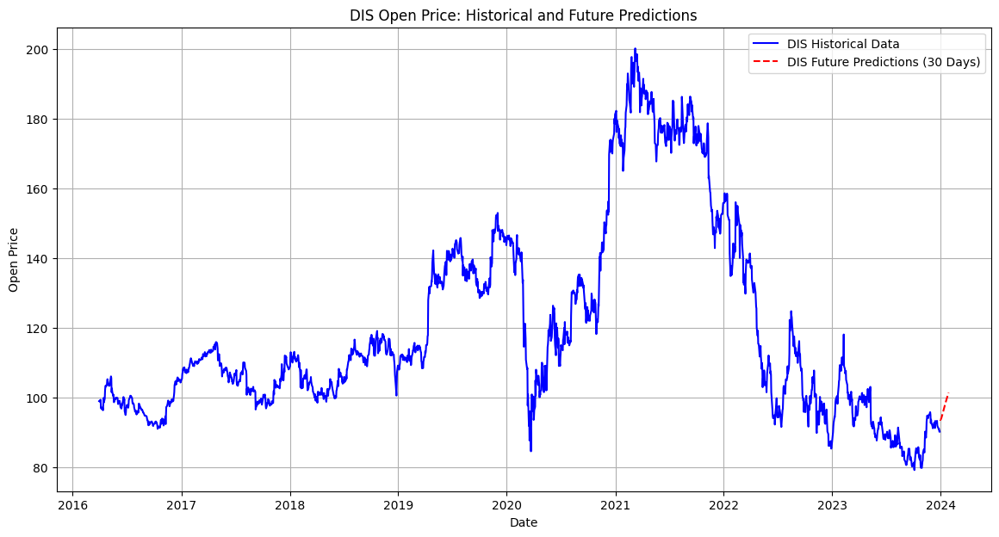

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for DUK:
  Train MSE: 3.31, Train RMSE: 1.82, Train R²: 0.97
  Test MSE: 3.30, Test RMSE: 1.82, Test R²: 0.85
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━

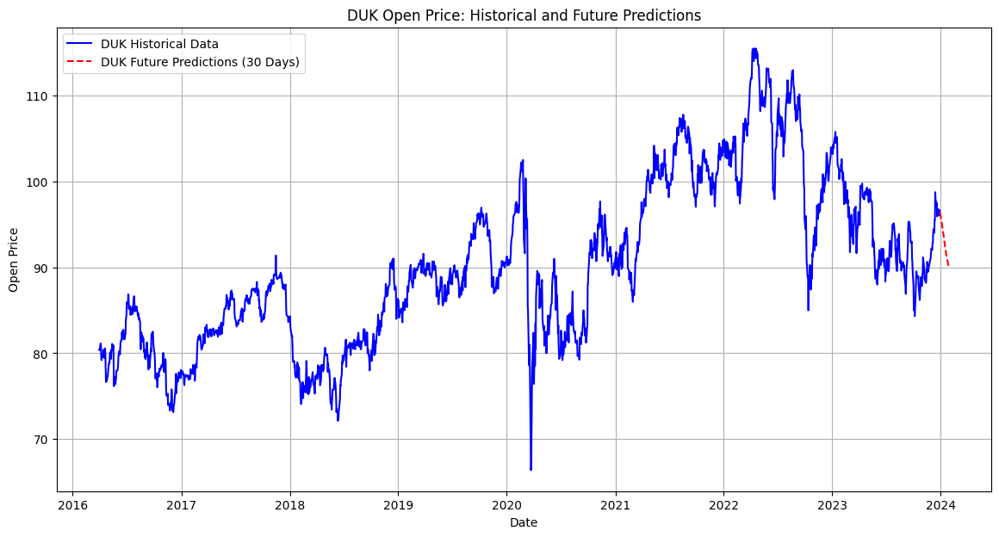

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for ECL:
  Train MSE: 22.87, Train RMSE: 4.78, Train R²: 0.98
  Test MSE: 14.10, Test RMSE: 3.75, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 

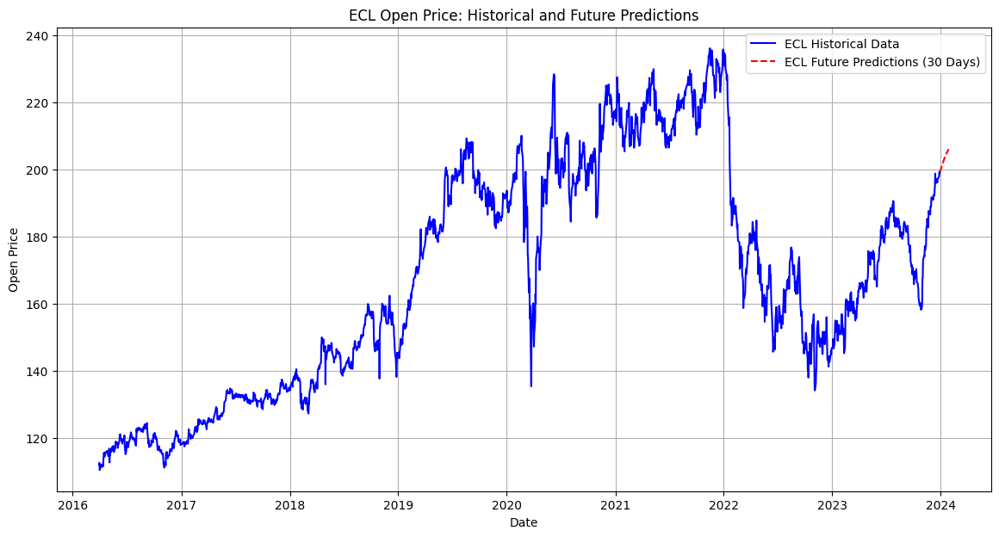

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for EOG:
  Train MSE: 18.01, Train RMSE: 4.24, Train R²: 0.97
  Test MSE: 17.84, Test RMSE: 4.22, Test R²: 0.73
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 

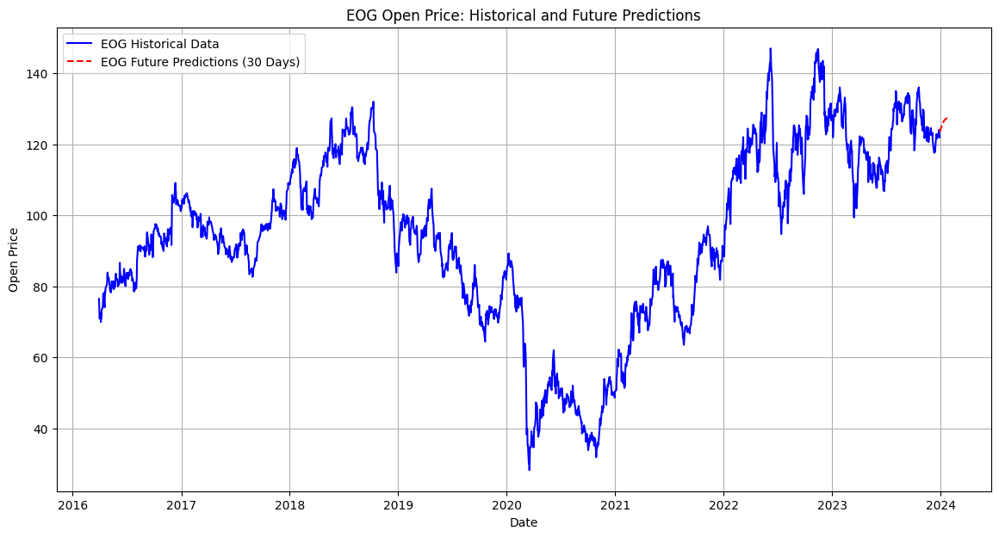

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for EQIX:
  Train MSE: 221.96, Train RMSE: 14.90, Train R²: 0.99
  Test MSE: 264.71, Test RMSE: 16.27, Test R²: 0.84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

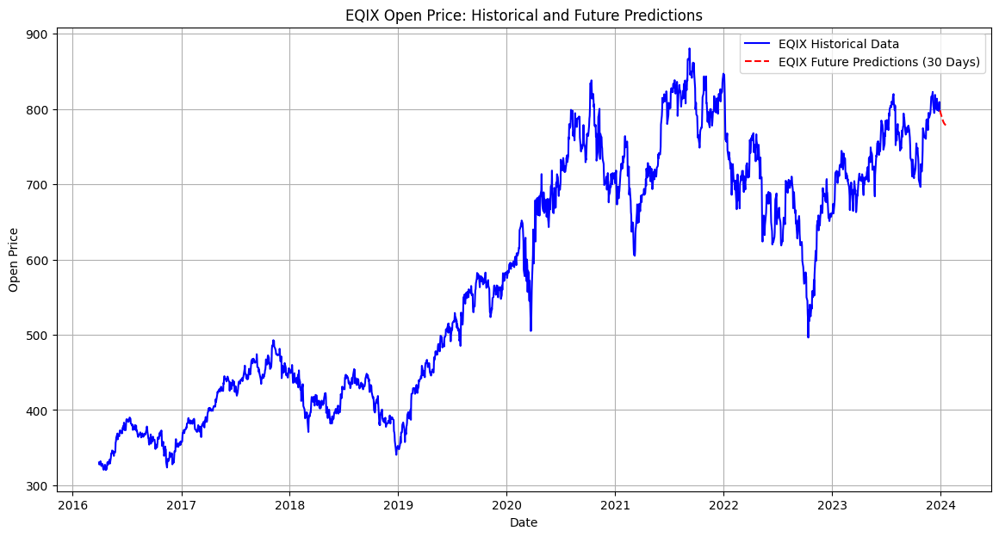

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for ETN:
  Train MSE: 12.11, Train RMSE: 3.48, Train R²: 0.99
  Test MSE: 148.77, Test RMSE: 12.20, Test R²: 0.78
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/

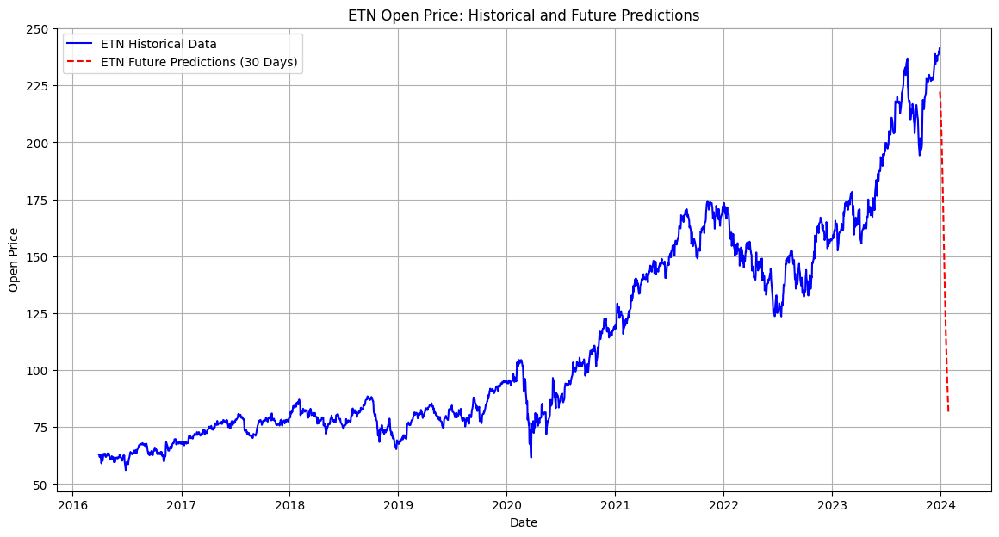

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for GE:
  Train MSE: 7.09, Train RMSE: 2.66, Train R²: 0.99
  Test MSE: 11.99, Test RMSE: 3.46, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━

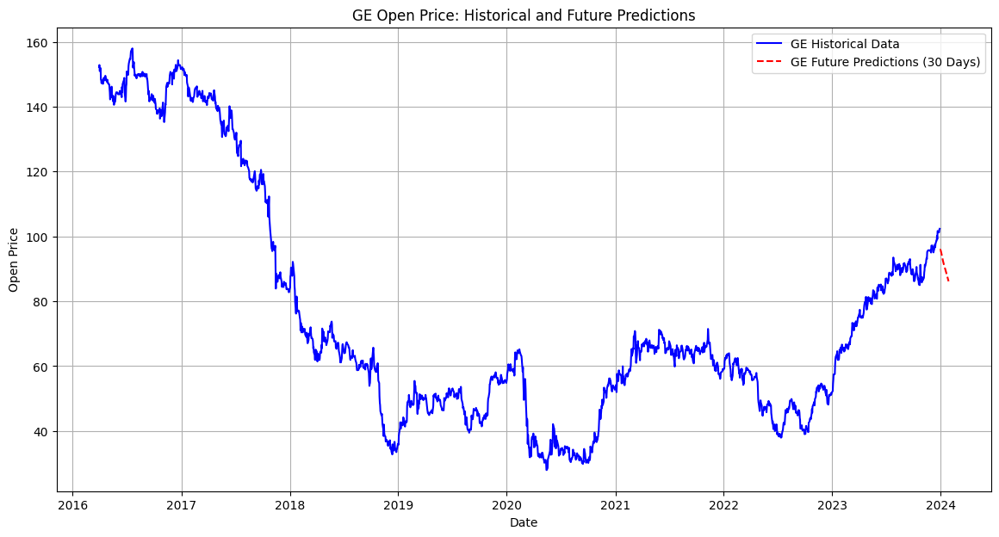

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for GOOG:
  Train MSE: 9.31, Train RMSE: 3.05, Train R²: 0.99
  Test MSE: 21.60, Test RMSE: 4.65, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 

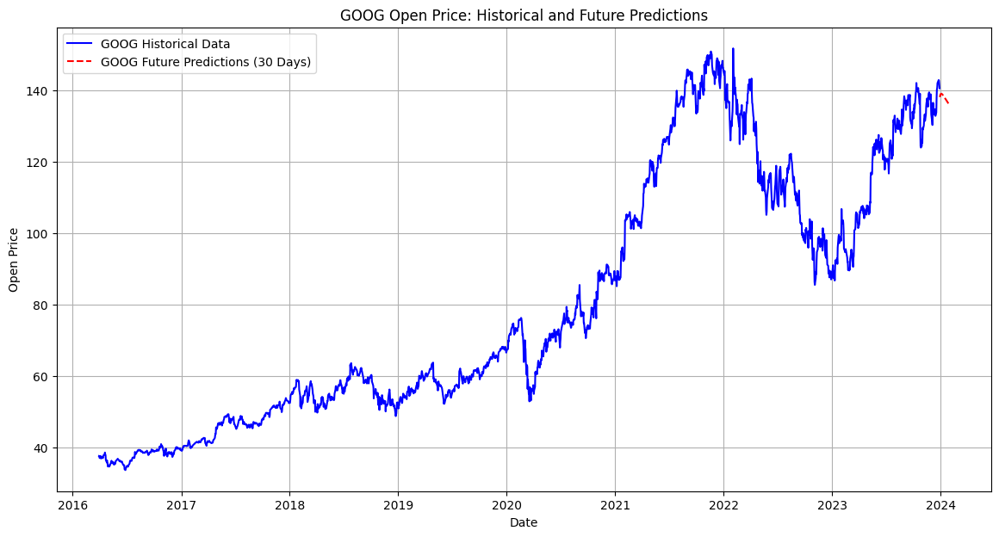

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for HD:
  Train MSE: 58.90, Train RMSE: 7.67, Train R²: 0.99
  Test MSE: 58.00, Test RMSE: 7.62, Test R²: 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━

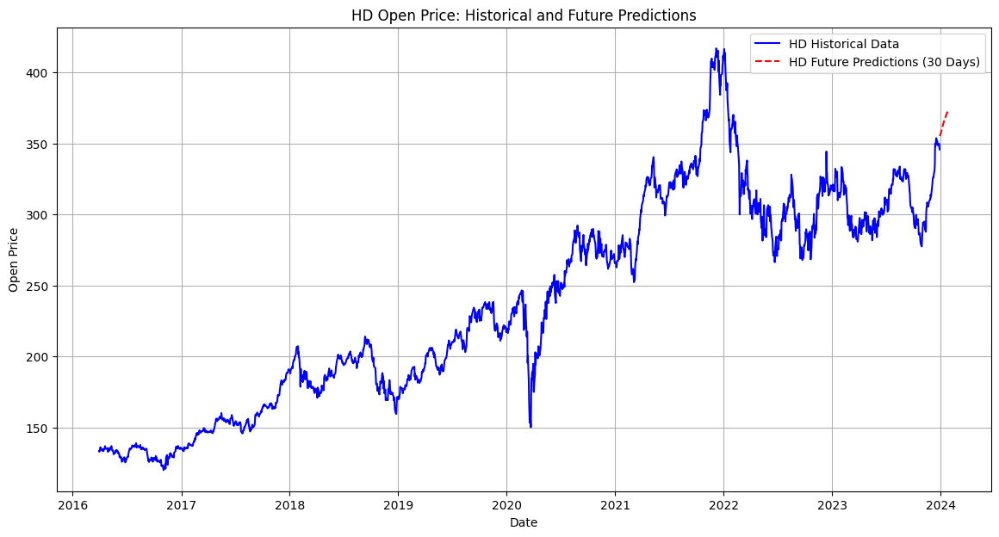

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for HON:
  Train MSE: 23.69, Train RMSE: 4.87, Train R²: 0.98
  Test MSE: 20.47, Test RMSE: 4.52, Test R²: 0.69
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 

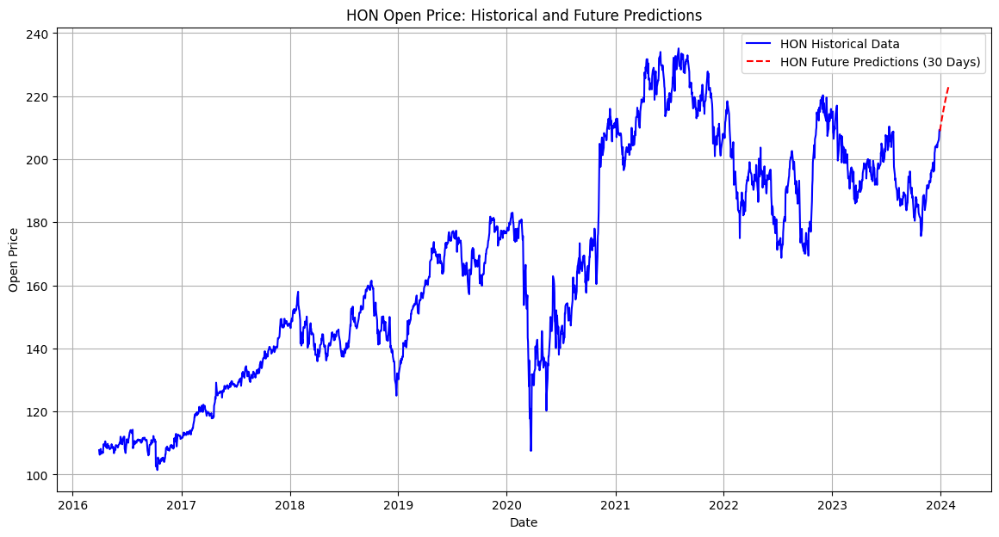

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Metrics for JNJ:
  Train MSE: 7.39, Train RMSE: 2.72, Train R²: 0.98
  Test MSE: 8.54, Test RMSE: 2.92, Test R²: 0.83
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━

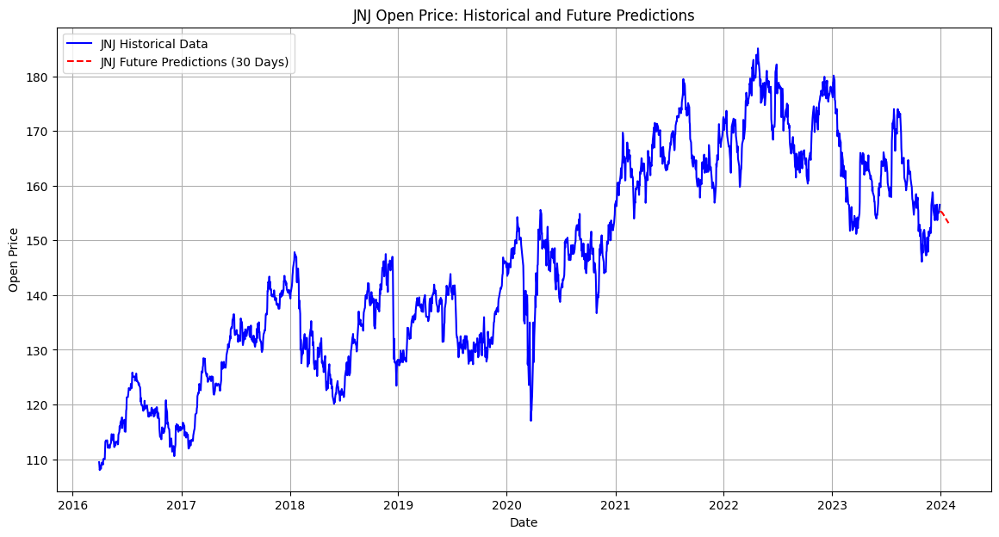

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for JPM:
  Train MSE: 13.35, Train RMSE: 3.65, Train R²: 0.98
  Test MSE: 15.84, Test RMSE: 3.98, Test R²: 0.81
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 

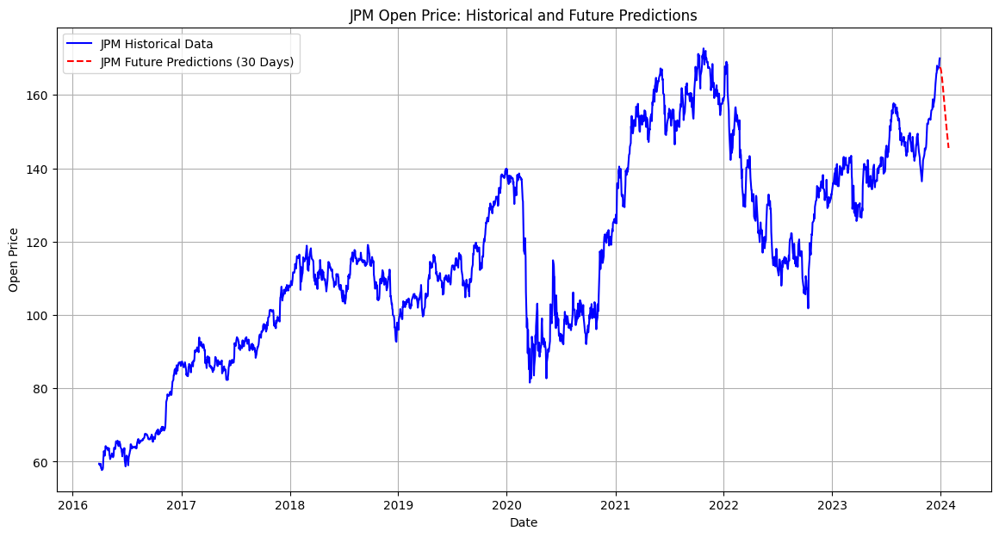

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for KO:
  Train MSE: 0.95, Train RMSE: 0.98, Train R²: 0.98
  Test MSE: 0.96, Test RMSE: 0.98, Test R²: 0.85
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━

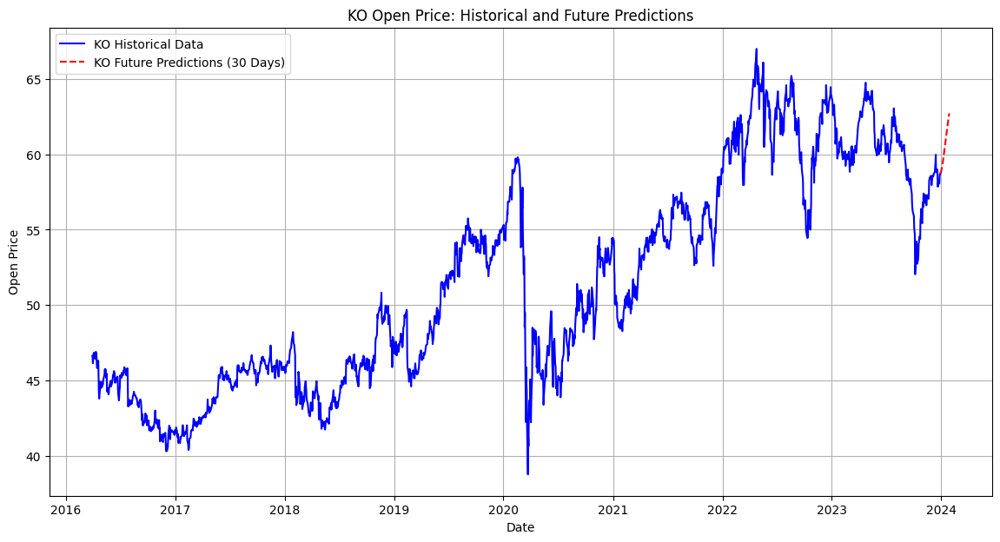

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Metrics for LIN:
  Train MSE: 42.29, Train RMSE: 6.50, Train R²: 0.99
  Test MSE: 395.20, Test RMSE: 19.88, Test R²: 0.37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/

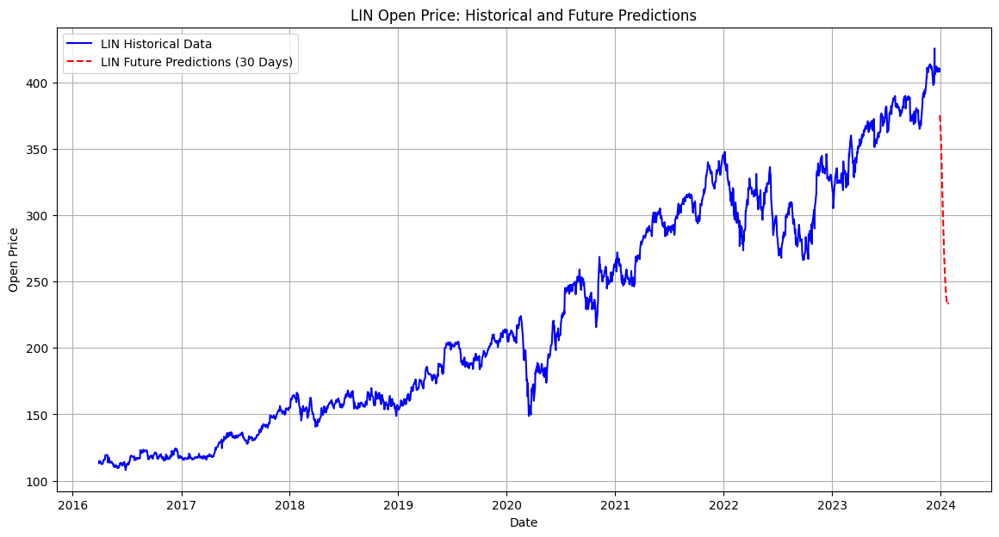

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for LLY:
  Train MSE: 41.15, Train RMSE: 6.42, Train R²: 0.99
  Test MSE: 443.74, Test RMSE: 21.07, Test R²: 0.96
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/

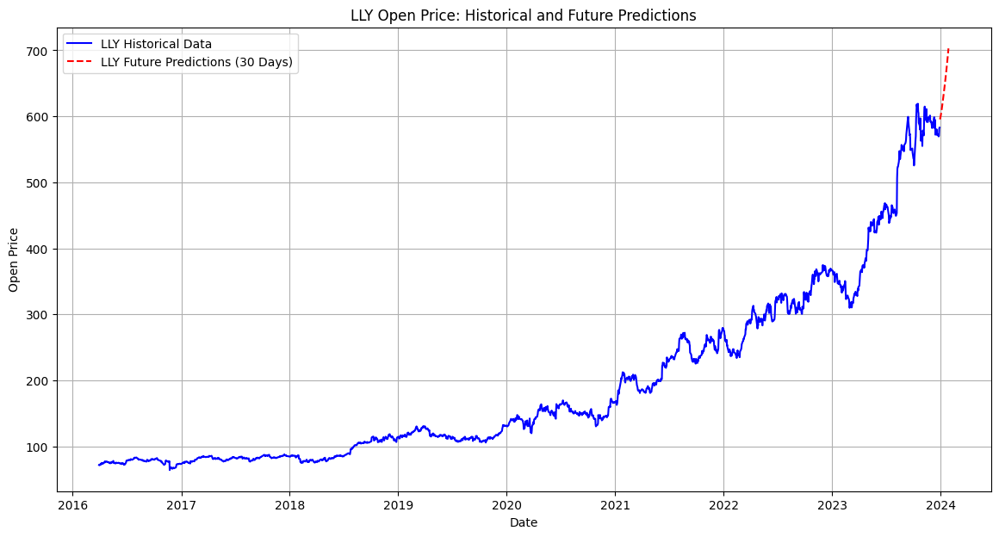

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for MA:
  Train MSE: 198.80, Train RMSE: 14.10, Train R²: 0.98
  Test MSE: 228.78, Test RMSE: 15.13, Test R²: 0.43
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1

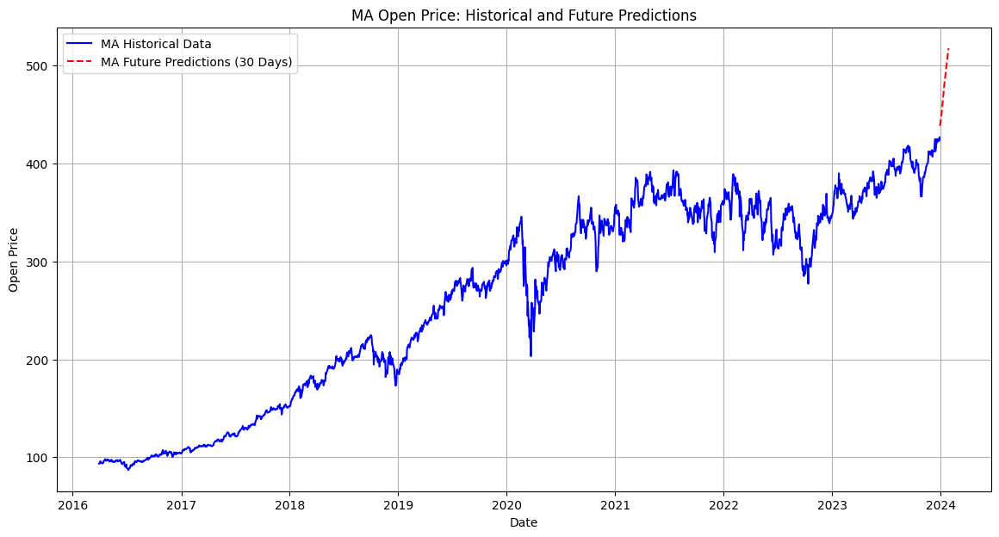

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for MCD:
  Train MSE: 27.87, Train RMSE: 5.28, Train R²: 0.99
  Test MSE: 75.77, Test RMSE: 8.70, Test R²: 0.57
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 

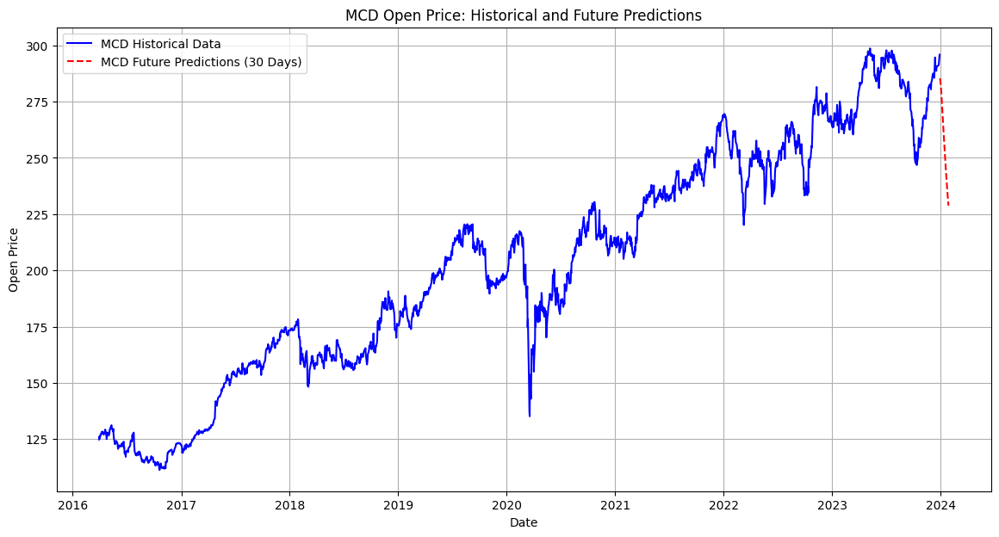

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for META:
  Train MSE: 67.62, Train RMSE: 8.22, Train R²: 0.99
  Test MSE: 113.11, Test RMSE: 10.64, Test R²: 0.97
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1

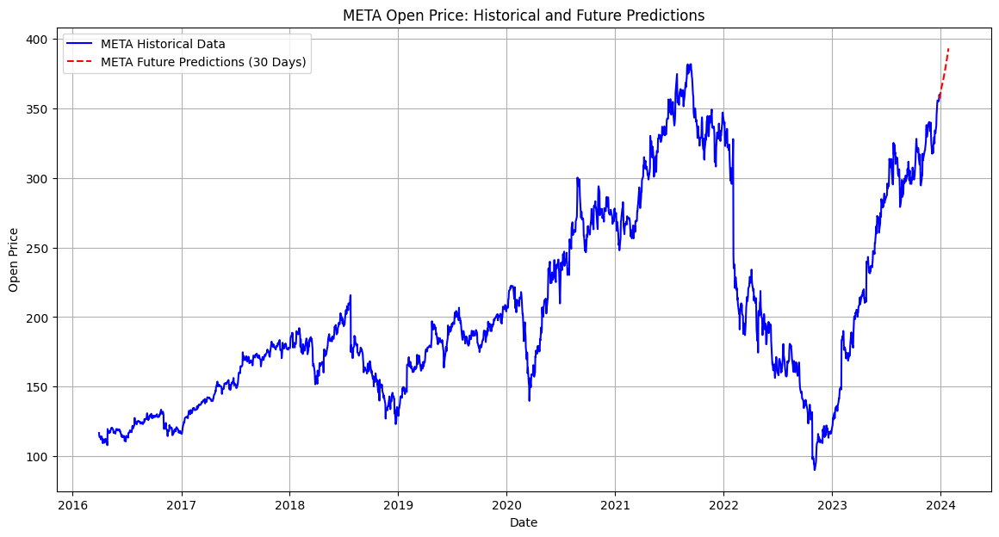

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for MRK:
  Train MSE: 3.73, Train RMSE: 1.93, Train R²: 0.98
  Test MSE: 4.83, Test RMSE: 2.20, Test R²: 0.73
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━

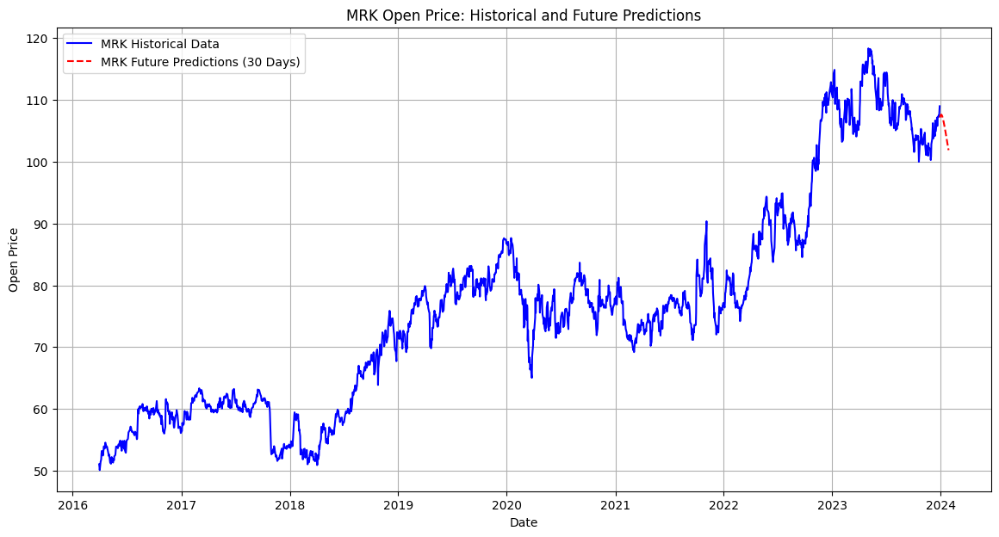

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for MSFT:
  Train MSE: 44.31, Train RMSE: 6.66, Train R²: 0.99
  Test MSE: 127.35, Test RMSE: 11.28, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1

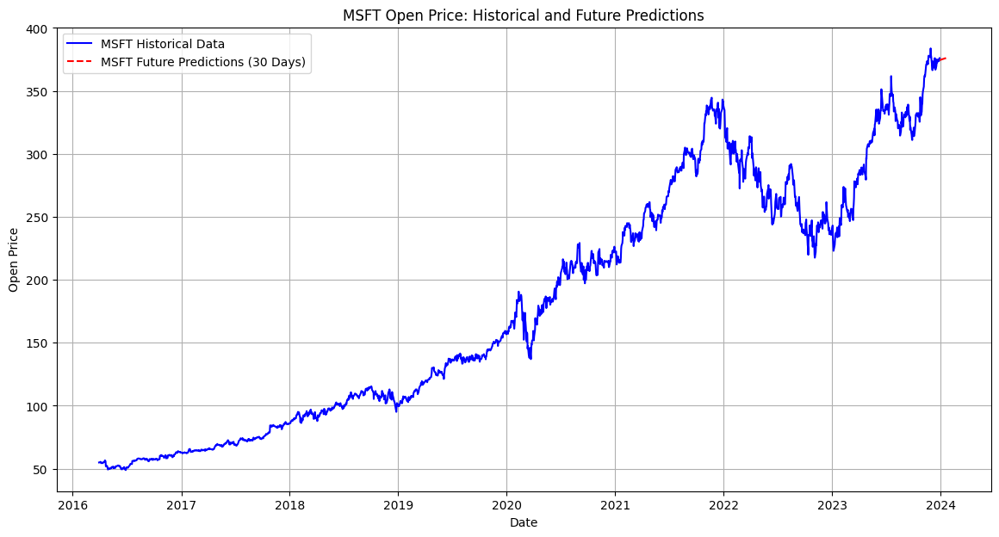

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for NEE:
  Train MSE: 3.52, Train RMSE: 1.88, Train R²: 0.99
  Test MSE: 12.06, Test RMSE: 3.47, Test R²: 0.84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━

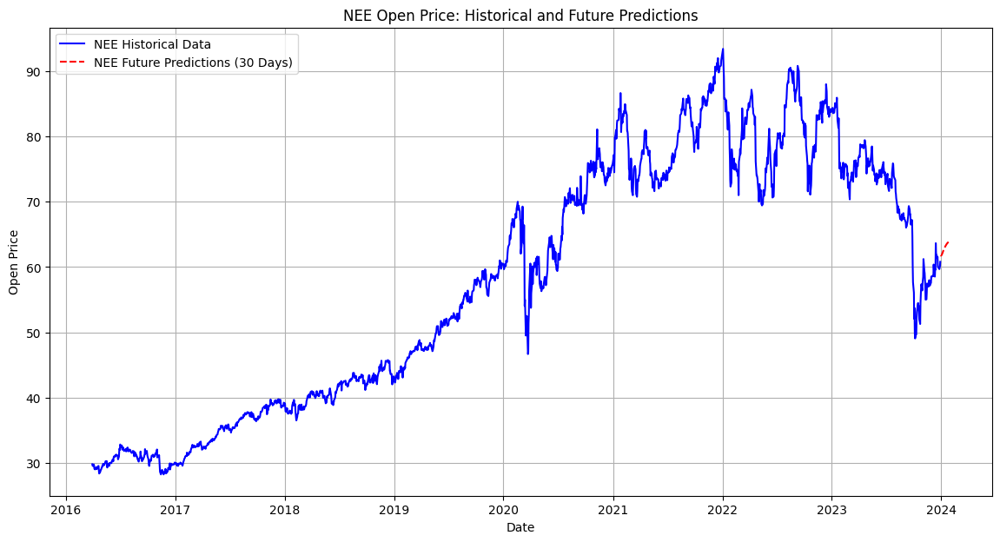

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for NFLX:
  Train MSE: 298.81, Train RMSE: 17.29, Train R²: 0.99
  Test MSE: 251.29, Test RMSE: 15.85, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

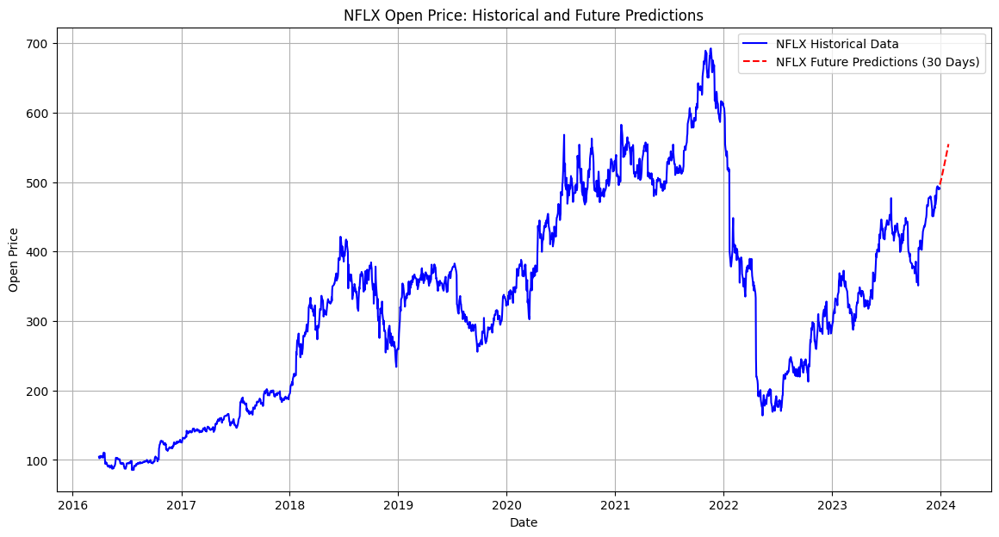

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for NVDA:
  Train MSE: 0.65, Train RMSE: 0.81, Train R²: 0.99
  Test MSE: 14.06, Test RMSE: 3.75, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 

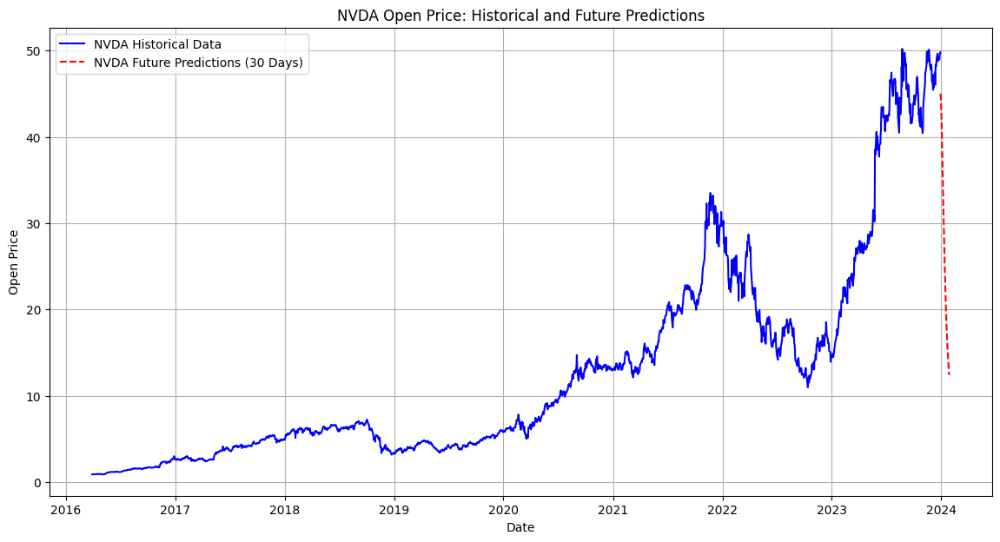

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for ORCL:
  Train MSE: 3.84, Train RMSE: 1.96, Train R²: 0.98
  Test MSE: 12.90, Test RMSE: 3.59, Test R²: 0.91
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 

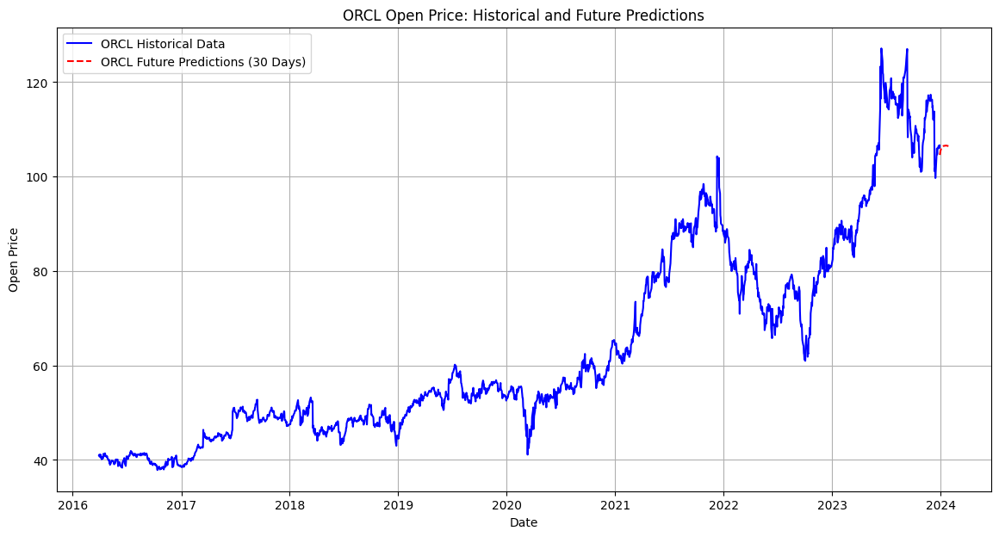

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for PEP:
  Train MSE: 5.68, Train RMSE: 2.38, Train R²: 0.99
  Test MSE: 17.24, Test RMSE: 4.15, Test R²: 0.78
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━

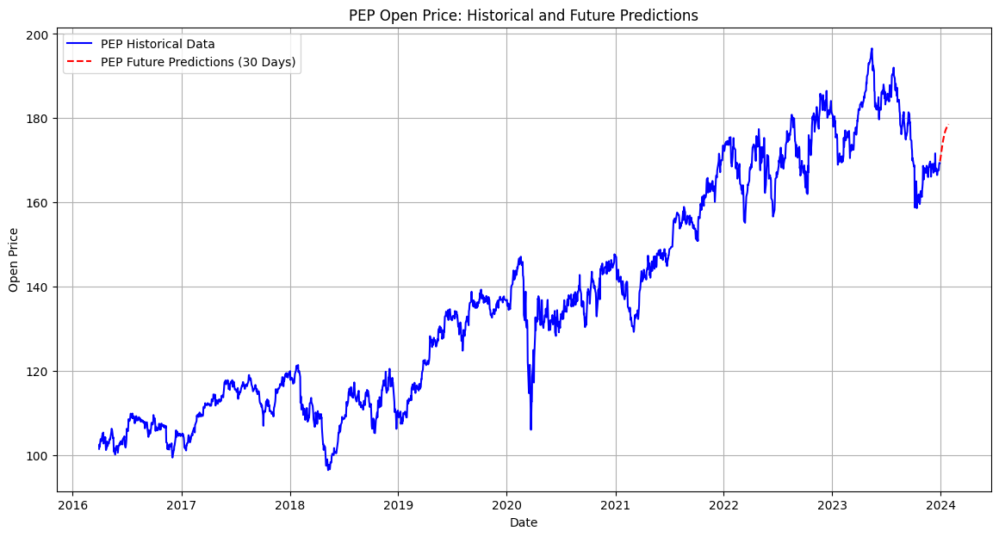

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for PG:
  Train MSE: 6.00, Train RMSE: 2.45, Train R²: 0.99
  Test MSE: 7.09, Test RMSE: 2.66, Test R²: 0.74
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━

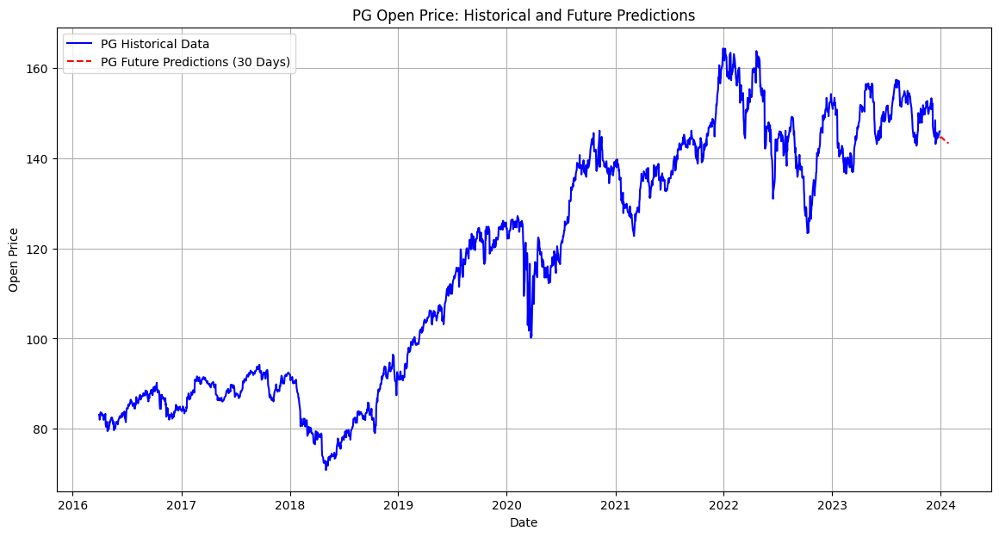

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for PLD:
  Train MSE: 9.66, Train RMSE: 3.11, Train R²: 0.99
  Test MSE: 13.58, Test RMSE: 3.69, Test R²: 0.76
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━

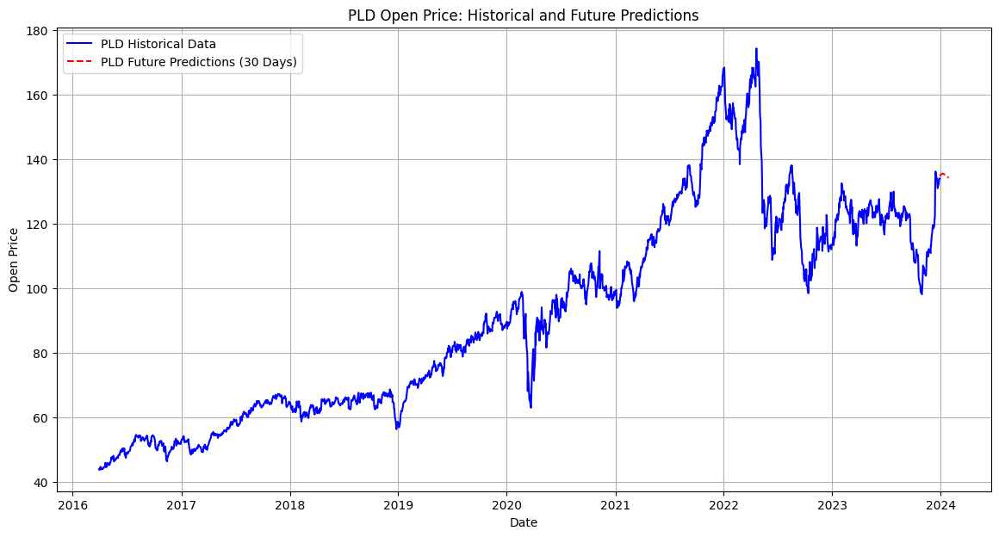

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for RTX:
  Train MSE: 6.78, Train RMSE: 2.60, Train R²: 0.94
  Test MSE: 12.11, Test RMSE: 3.48, Test R²: 0.87
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━

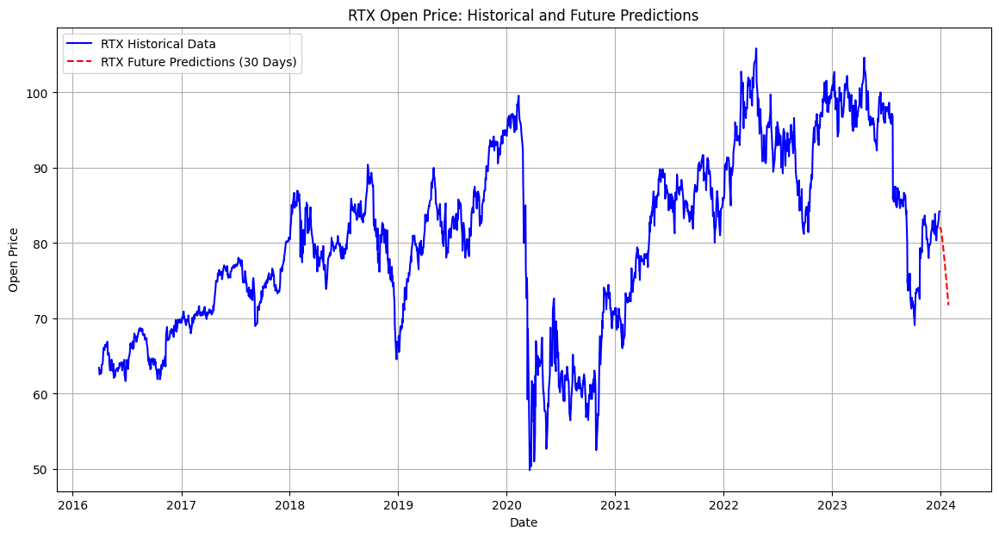

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Metrics for SCCO:
  Train MSE: 5.27, Train RMSE: 2.29, Train R²: 0.97
  Test MSE: 22.49, Test RMSE: 4.74, Test R²: -0.03
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1

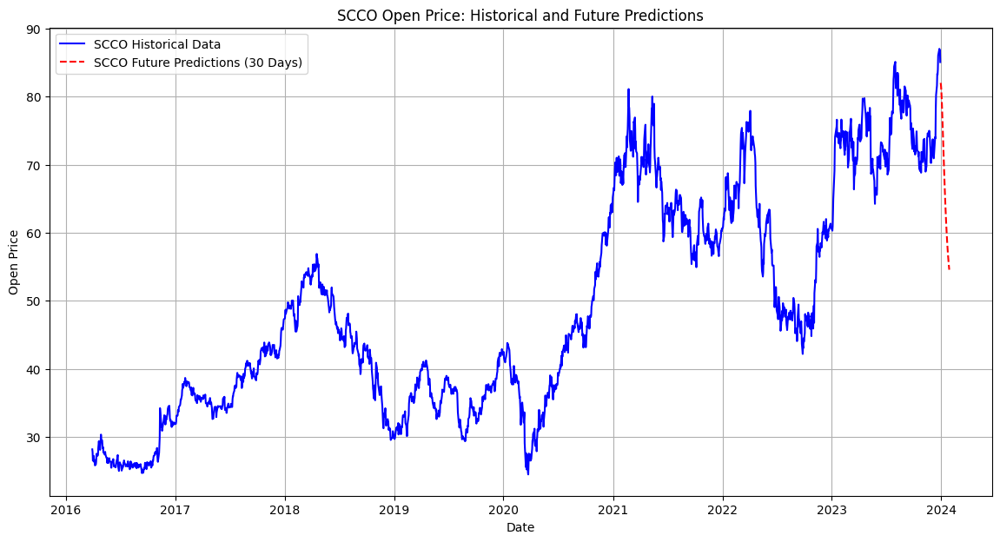

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for SHW:
  Train MSE: 42.66, Train RMSE: 6.53, Train R²: 0.99
  Test MSE: 54.48, Test RMSE: 7.38, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 

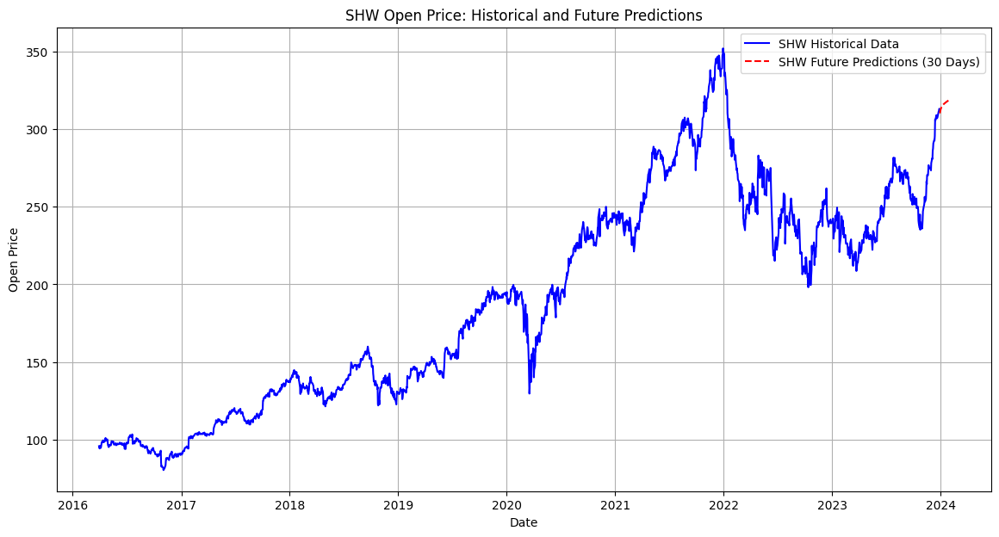

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for SO:
  Train MSE: 1.65, Train RMSE: 1.28, Train R²: 0.98
  Test MSE: 1.93, Test RMSE: 1.39, Test R²: 0.72
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━

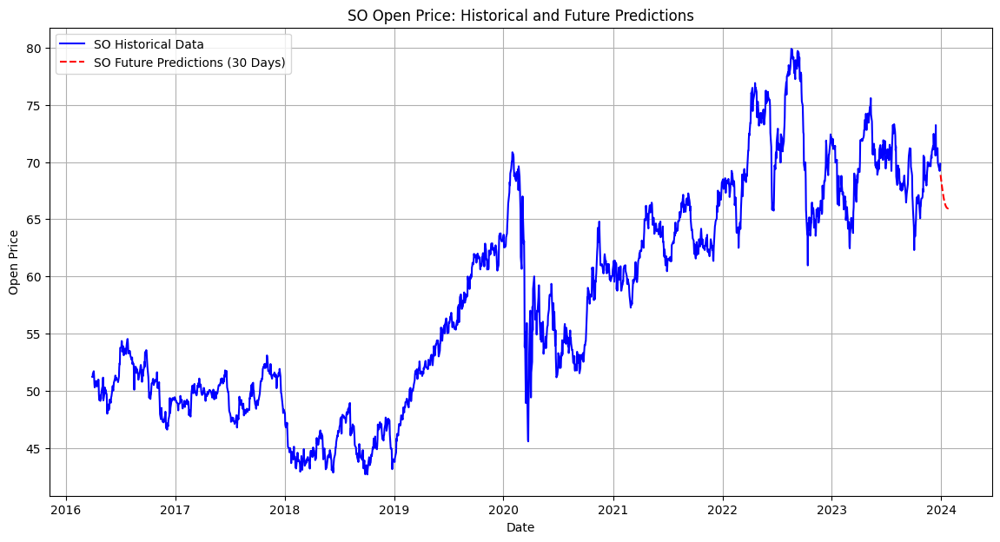

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Metrics for SPG:
  Train MSE: 27.39, Train RMSE: 5.23, Train R²: 0.98
  Test MSE: 18.08, Test RMSE: 4.25, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 

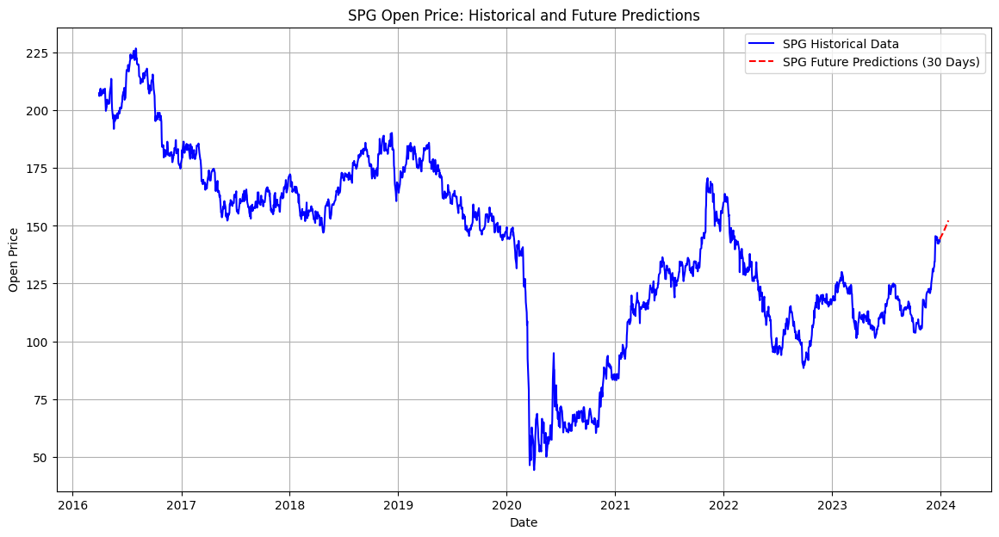

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for TMUS:
  Train MSE: 9.14, Train RMSE: 3.02, Train R²: 0.99
  Test MSE: 17.34, Test RMSE: 4.16, Test R²: 0.56
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 

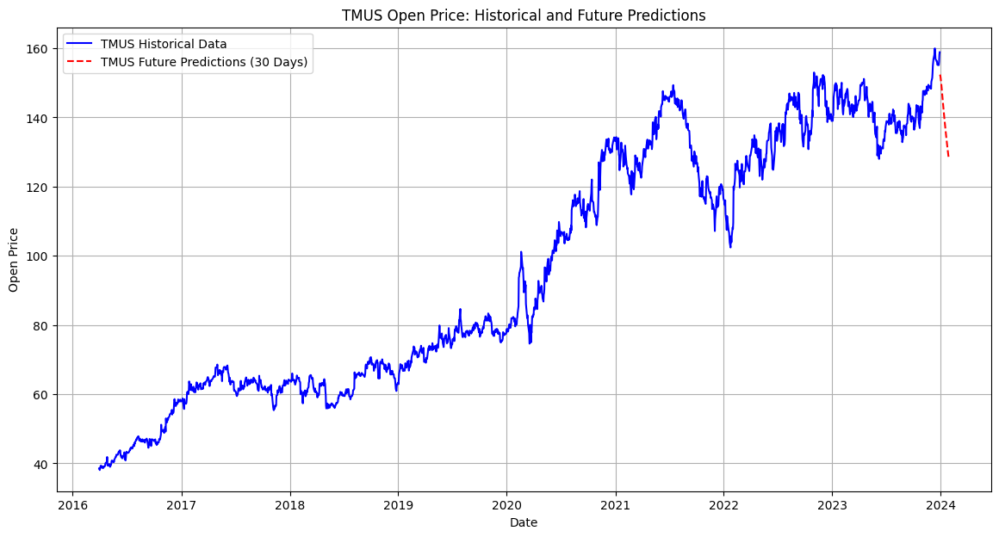

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for TSLA:
  Train MSE: 148.66, Train RMSE: 12.19, Train R²: 0.99
  Test MSE: 240.57, Test RMSE: 15.51, Test R²: 0.86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step

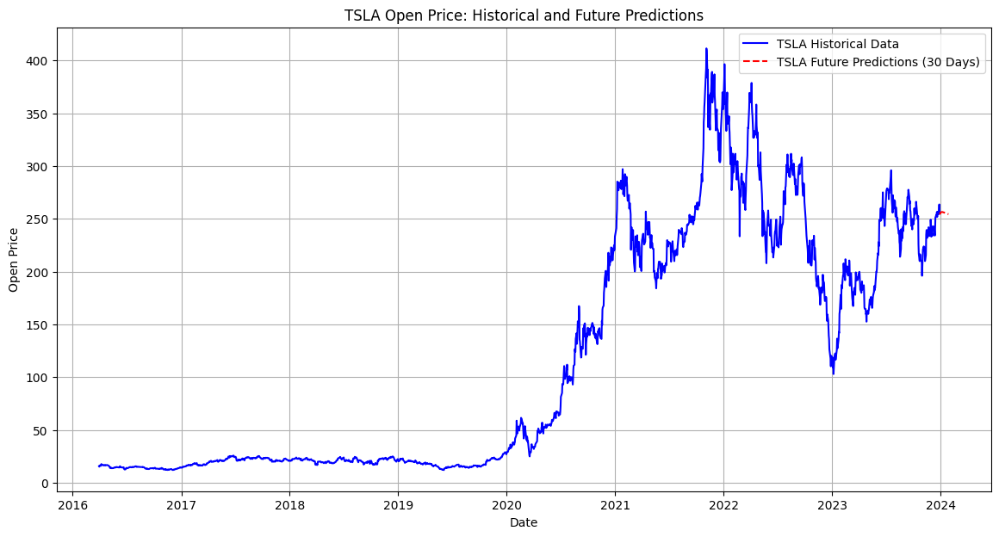

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for TXGE:
  Train MSE: 3403.44, Train RMSE: 58.34, Train R²: 0.97
  Test MSE: 2611.95, Test RMSE: 51.11, Test R²: 0.84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/st

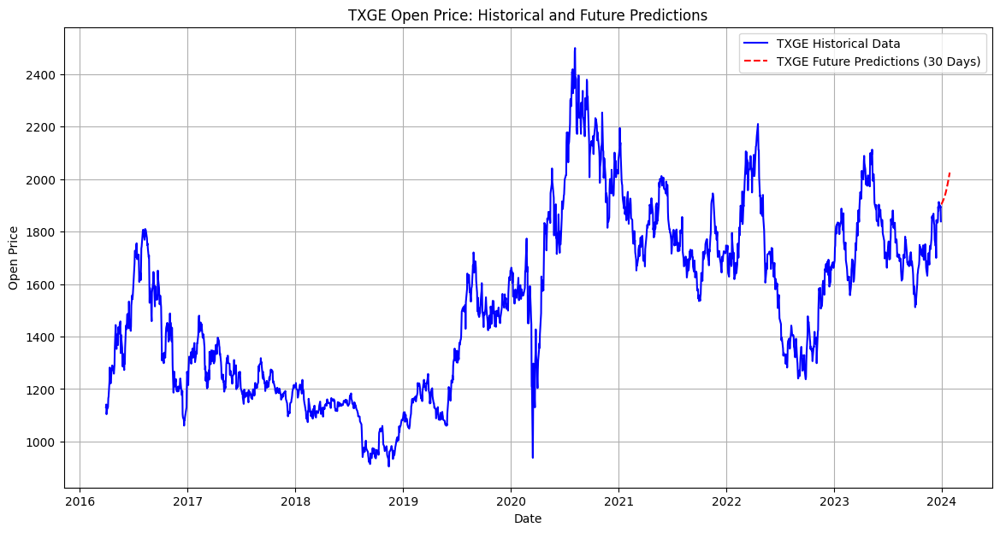

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Metrics for UNH:
  Train MSE: 99.07, Train RMSE: 9.95, Train R²: 0.99
  Test MSE: 179.86, Test RMSE: 13.41, Test R²: 0.68
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/

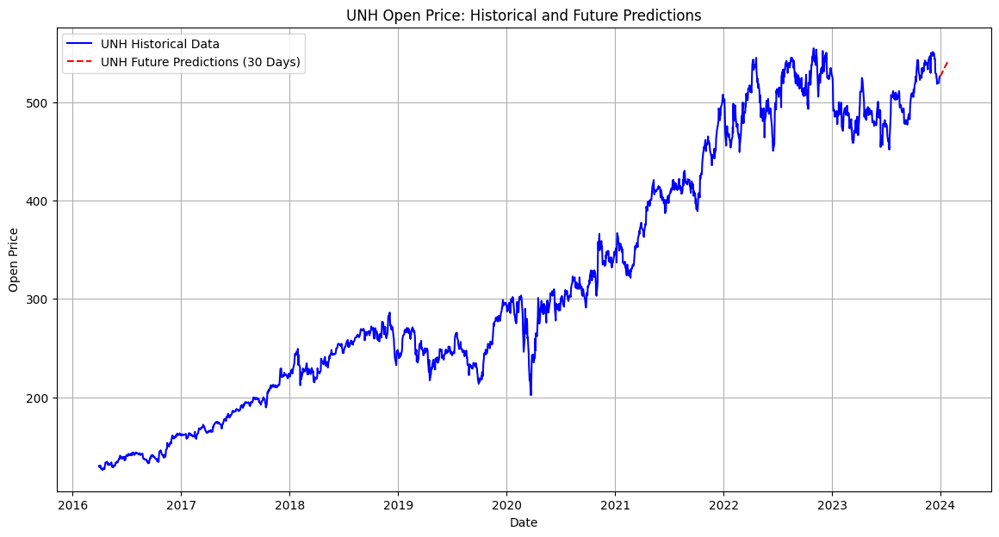

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for V:
  Train MSE: 23.53, Train RMSE: 4.85, Train R²: 0.99
  Test MSE: 26.24, Test RMSE: 5.12, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━

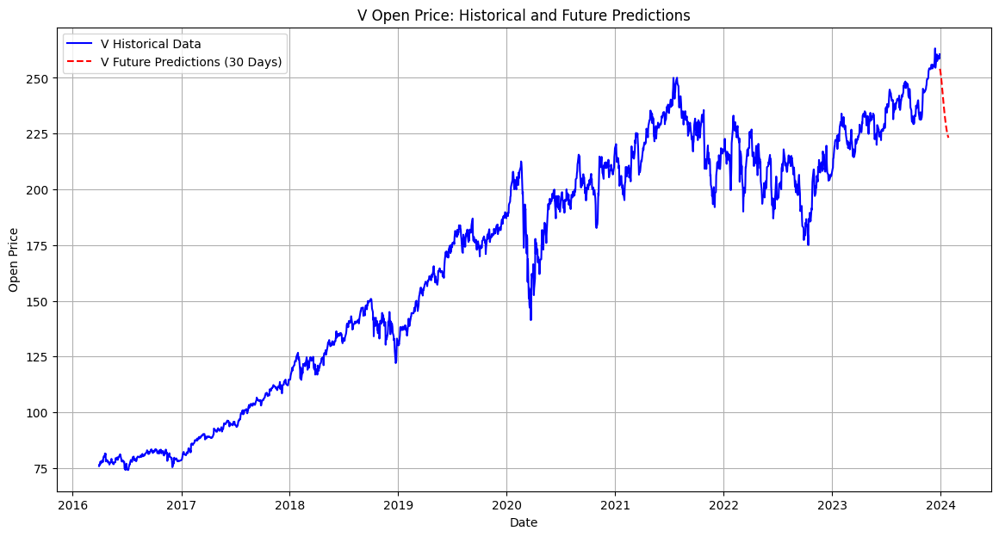

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for WELL:
  Train MSE: 5.89, Train RMSE: 2.43, Train R²: 0.96
  Test MSE: 3.76, Test RMSE: 1.94, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━

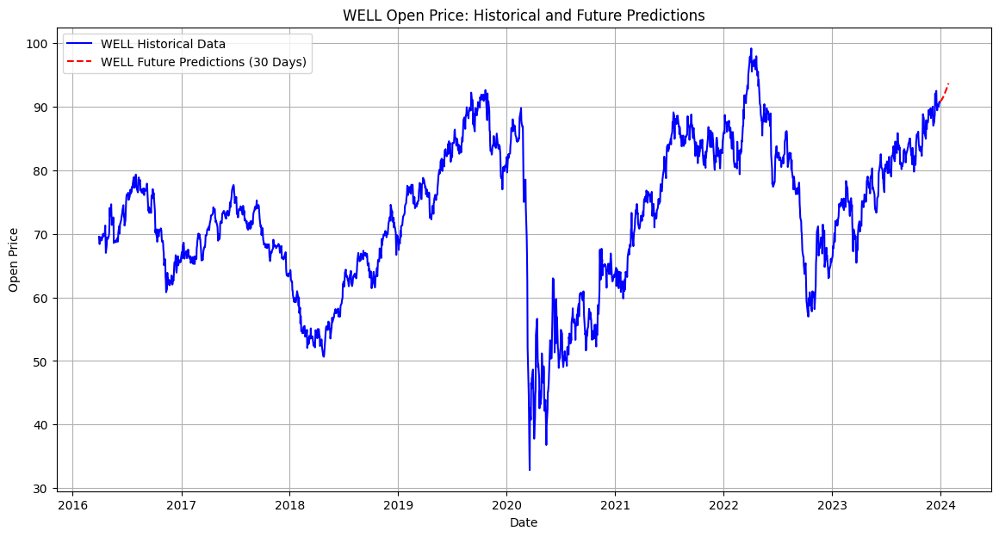

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for WMT:
  Train MSE: 1.58, Train RMSE: 1.26, Train R²: 0.98
  Test MSE: 6.18, Test RMSE: 2.49, Test R²: 0.06
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━

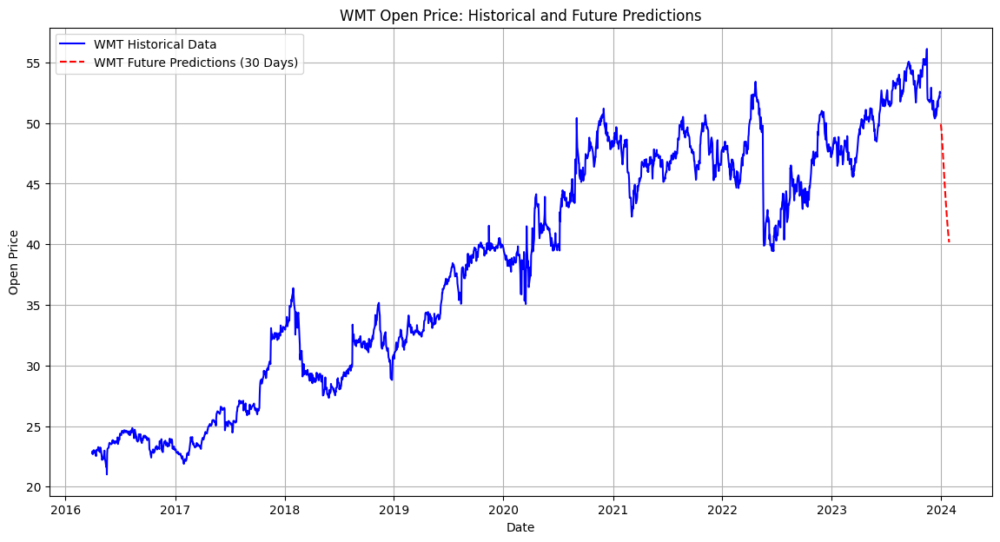

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for XOM:
  Train MSE: 5.71, Train RMSE: 2.39, Train R²: 0.98
  Test MSE: 9.70, Test RMSE: 3.11, Test R²: 0.63
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━

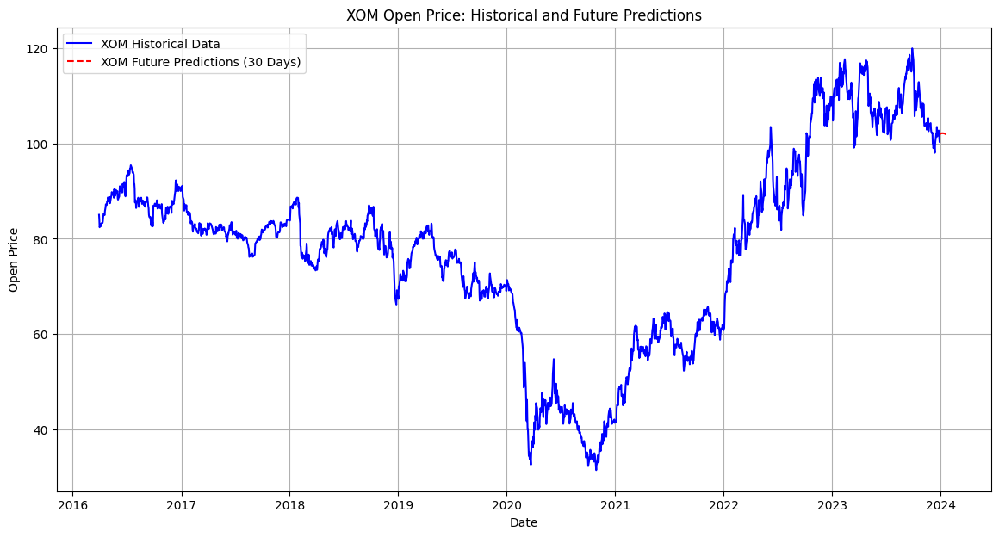

In [19]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

file_path = '/content/stocks_data.csv'
df = pd.read_csv(file_path)

df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df = df.dropna(subset=['Date'])
df = df.sort_values(by=['Ticker', 'Date'])

df['Ticker'] = df['Ticker'].astype(str).str.strip().str.upper()

results_open = {}

for ticker in df['Ticker'].unique():
    company_data = df[df['Ticker'] == ticker].copy()

    company_data['SMA_60'] = company_data['Open'].rolling(window=60).mean()
    company_data = company_data.dropna(subset=['SMA_60'])  # Drop NaN values due to SMA calculation

    train_data = company_data[company_data['Date'] <= '2022-12-31']
    test_data = company_data[company_data['Date'] >= '2023-01-01']

    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(company_data[['Open', 'SMA_60']].values)

    # Create sequences for LSTM
    def create_sequences(data, lookback=30):
        X, y = [], []
        for i in range(lookback, len(data)):
            X.append(data[i - lookback:i, :])  # Use 'Open' and 'SMA_60' as features
            y.append(data[i, 0])  # Use 'Open' as the target
        return np.array(X), np.array(y)

    lookback = 30
    full_X, full_y = create_sequences(scaled_data, lookback)

    # Split into training and testing
    train_size = len(train_data) - lookback
    train_X, train_y = full_X[:train_size], full_y[:train_size]
    test_X, test_y = full_X[train_size:], full_y[train_size:]

    train_X = train_X.reshape(train_X.shape[0], train_X.shape[1], train_X.shape[2])
    test_X = test_X.reshape(test_X.shape[0], test_X.shape[1], test_X.shape[2])

    # Build the LSTM model
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(50, activation='relu', return_sequences=True, input_shape=(lookback, 2)),
        tf.keras.layers.LSTM(50, activation='relu'),
        tf.keras.layers.Dense(1)
    ])

    model.compile(optimizer='adam', loss='mse')

    model.fit(train_X, train_y, epochs=10, batch_size=32, verbose=0)

    train_predictions = model.predict(train_X)
    test_predictions = model.predict(test_X)

    train_predictions = scaler.inverse_transform(np.concatenate((train_predictions, train_X[:, -1, 1:]), axis=1))[:, 0]
    test_predictions = scaler.inverse_transform(np.concatenate((test_predictions, test_X[:, -1, 1:]), axis=1))[:, 0]
    train_y = scaler.inverse_transform(np.concatenate((train_y.reshape(-1, 1), train_X[:, -1, 1:]), axis=1))[:, 0]
    test_y = scaler.inverse_transform(np.concatenate((test_y.reshape(-1, 1), test_X[:, -1, 1:]), axis=1))[:, 0]

    # Calculate metrics
    train_mse = mean_squared_error(train_y, train_predictions)
    train_rmse = np.sqrt(train_mse)
    train_r2 = r2_score(train_y, train_predictions)

    test_mse = mean_squared_error(test_y, test_predictions)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(test_y, test_predictions)

    print(f"Metrics for {ticker}:")
    print(f"  Train MSE: {train_mse:.2f}, Train RMSE: {train_rmse:.2f}, Train R²: {train_r2:.2f}")
    print(f"  Test MSE: {test_mse:.2f}, Test RMSE: {test_rmse:.2f}, Test R²: {test_r2:.2f}")

    # Predict future values (next month, 30 days)
    future_predictions = []
    last_sequence = scaled_data[-lookback:].reshape(1, lookback, 2)

    for _ in range(30):  # Predict for 30 days
        next_pred = model.predict(last_sequence)
        future_predictions.append(next_pred[0, 0])
        last_sequence = np.append(last_sequence[:, 1:, :], [[[next_pred[0, 0], last_sequence[0, -1, 1]]]], axis=1)

    placeholder_sma = np.zeros((len(future_predictions), 1))
    future_predictions_with_placeholder = np.hstack((np.array(future_predictions).reshape(-1, 1), placeholder_sma))

    # Inverse transform
    future_predictions = scaler.inverse_transform(future_predictions_with_placeholder)[:, 0]

    plt.figure(figsize=(14, 7))

    plt.plot(company_data['Date'], company_data['Open'], label=f'{ticker} Historical Data', color='blue')

    future_dates = pd.date_range(start=company_data['Date'].max() + pd.Timedelta(days=1), periods=30)
    plt.plot(future_dates, future_predictions, label=f'{ticker} Future Predictions (30 Days)', color='red', linestyle='dashed')

    # Add plot details
    plt.title(f"{ticker} Open Price: Historical and Future Predictions")
    plt.xlabel("Date")
    plt.ylabel("Open Price")
    plt.legend()
    plt.grid(True)

    plt.show()

    results_open[ticker] = {
        'Company Name': ticker,
        'Train Metrics': {'MSE': train_mse, 'RMSE': train_rmse, 'R²': train_r2},
        'Test Metrics': {'MSE': test_mse, 'RMSE': test_rmse, 'R²': test_r2},
        'Future Predictions': future_predictions.flatten(),
        'Model': model
    }


In [20]:
#result's dictionary OPEN

for ticker, data in results_open.items():
    print(f"Ticker: {ticker}")
    print(f"  Train Metrics:")
    print(f"    MSE: {data['Train Metrics']['MSE']:.2f}")
    print(f"    RMSE: {data['Train Metrics']['RMSE']:.2f}")
    print(f"    R²: {data['Train Metrics']['R²']:.2f}")
    print(f"  Test Metrics:")
    print(f"    MSE: {data['Test Metrics']['MSE']:.2f}")
    print(f"    RMSE: {data['Test Metrics']['RMSE']:.2f}")
    print(f"    R²: {data['Test Metrics']['R²']:.2f}")
    print(f"  Future Predictions (30 Days): {data['Future Predictions'][:30]}")
    print(f"  Total Future Predictions: {len(data['Future Predictions'])}")
    print("-" * 50)


Ticker: AAPL
  Train Metrics:
    MSE: 12.82
    RMSE: 3.58
    R²: 0.99
  Test Metrics:
    MSE: 28.84
    RMSE: 5.37
    R²: 0.91
  Future Predictions (30 Days): [191.1232983  190.6040474  189.98190464 189.28695815 188.54817669
 187.77882583 186.98846765 186.19062929 185.38634645 184.57984571
 183.76962057 182.96162379 182.15903576 181.36185649 180.57579813
 179.79442665 179.02065044 178.25442766 177.49618724 176.74999881
 176.01788153 175.29524263 174.58240646 173.88045056 173.19154053
 172.51432681 171.85056697 171.19724802 170.5546001  169.92637903]
  Total Future Predictions: 30
--------------------------------------------------
Ticker: ABBV
  Train Metrics:
    MSE: 13.12
    RMSE: 3.62
    R²: 0.98
  Test Metrics:
    MSE: 23.79
    RMSE: 4.88
    R²: 0.60
  Future Predictions (30 Days): [156.30251528 156.67136486 157.05283637 157.44291858 157.83882629
 158.23884446 158.6448724  159.05714398 159.47186057 159.88738508
 160.30460338 160.72462813 161.1431717  161.56195623 161.9789

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0588
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0015
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 8.9621e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 7.1473e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 6.4162e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 6.6349e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 6.3749e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 6.2894e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 5.7439e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 4.7412e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Metrics for AAPL:
  Train MSE: 15.01, Train RMSE: 3.87, Train R²: 0.99
  Test MSE: 53.37, Test RMSE: 7.31, Test R²: 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━

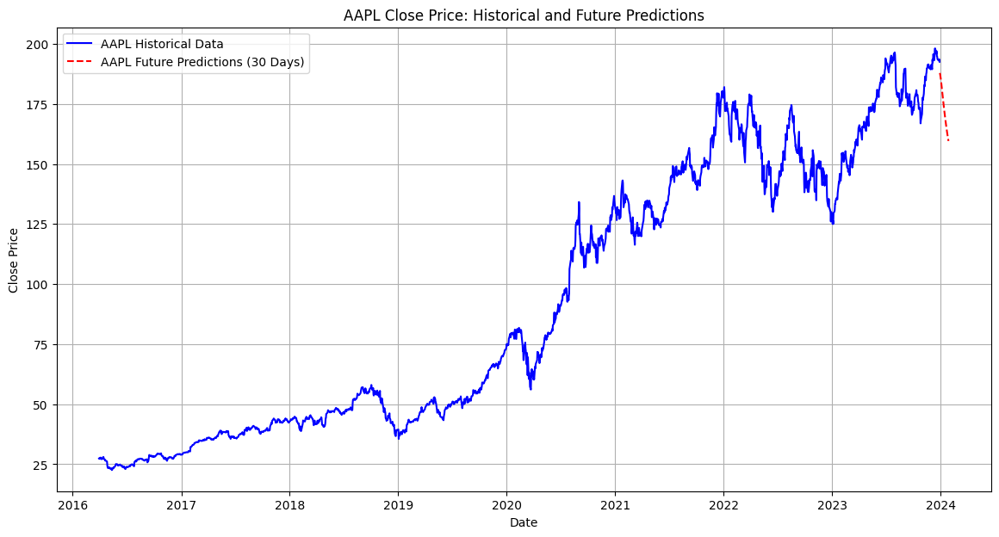

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0557
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0028
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0020
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0015
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0011
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0011
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0010
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 9.4936e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for ABBV:
  Train MSE: 12.81, Train RMSE: 3.58, Train R²: 0.98
  Test MSE: 17.58, Test RMSE: 4.19, Test R²: 0.70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/

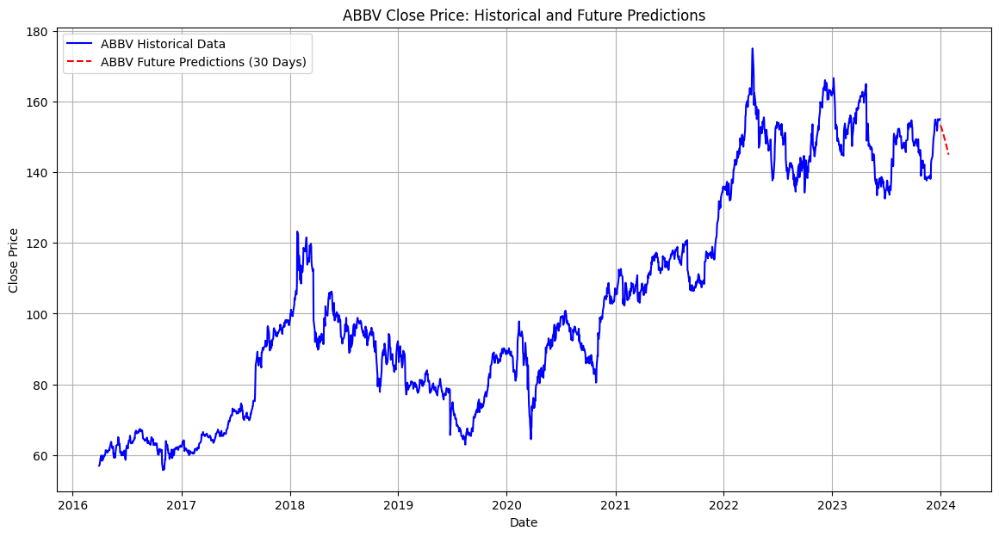

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.1574
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0027
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0018
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0014
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0014
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0011
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0012
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0012
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 9.5730e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0011
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Metrics for AMT:
  Train MSE: 35.38, Train RMSE: 5.95, Train R²: 0.99
  Test MSE: 39.08, Test RMSE: 6.25, Test R²: 0.86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/s

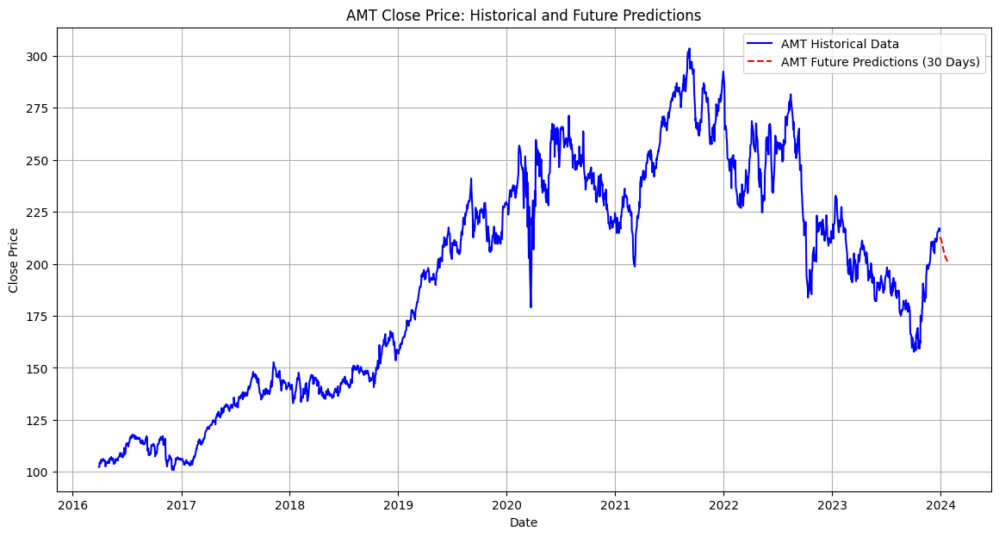

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0914
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0028
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0028
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0020
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0017
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0016
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0014
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0012
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0014
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0012
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Metrics for AMZN:
  Train MSE: 30.64, Train RMSE: 5.54, Train R²: 0.98
  Test MSE: 20.02, Test RMSE: 4.47, Test R²: 0.94
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

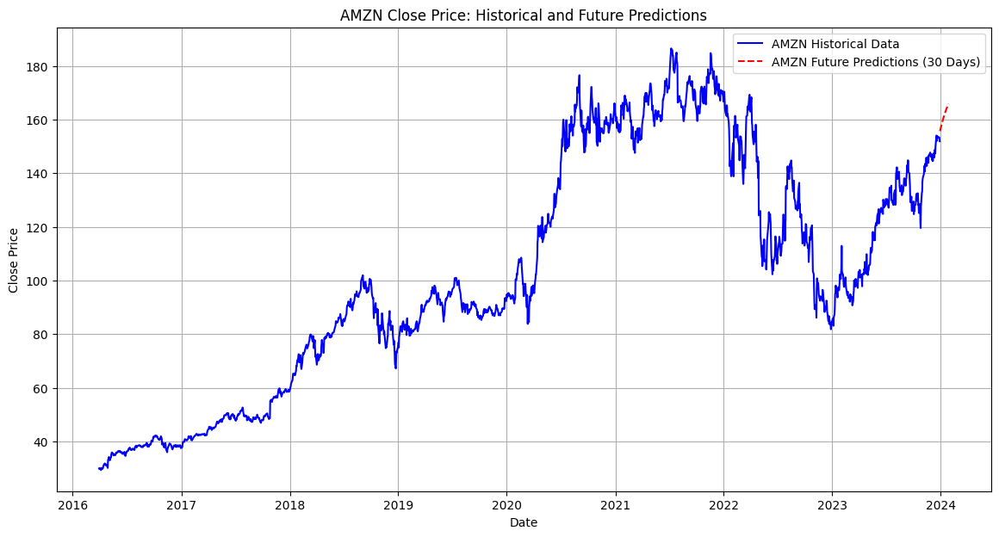

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1244
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0040
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0024
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0019
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0020
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0014
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0016
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0012
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0012
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0012
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Metrics for APD:
  Train MSE: 41.91, Train RMSE: 6.47, Train R²: 0.99
  Test MSE: 70.41, Test RMSE: 8.39, Test R²: 0.53
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1

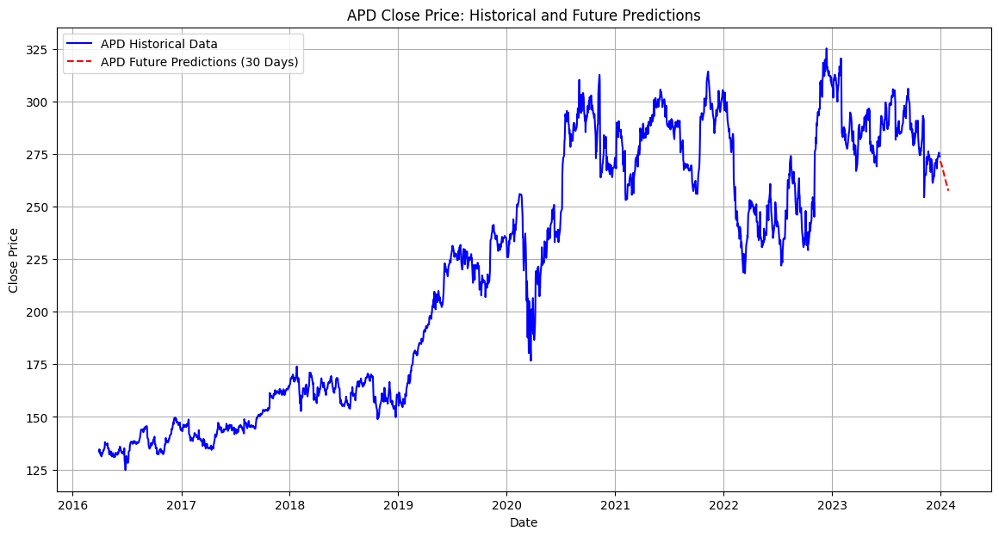

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0257
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 5.7496e-04
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 5.4613e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 4.5622e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 3.7741e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 3.0302e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 3.7437e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 2.7823e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 2.8986e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 2.9030e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for AVGO:
  Train MSE: 3.87, Train RMSE: 1.97, Train R²: 0.98
  Test MSE: 27.58, Test RMSE: 5.25, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/

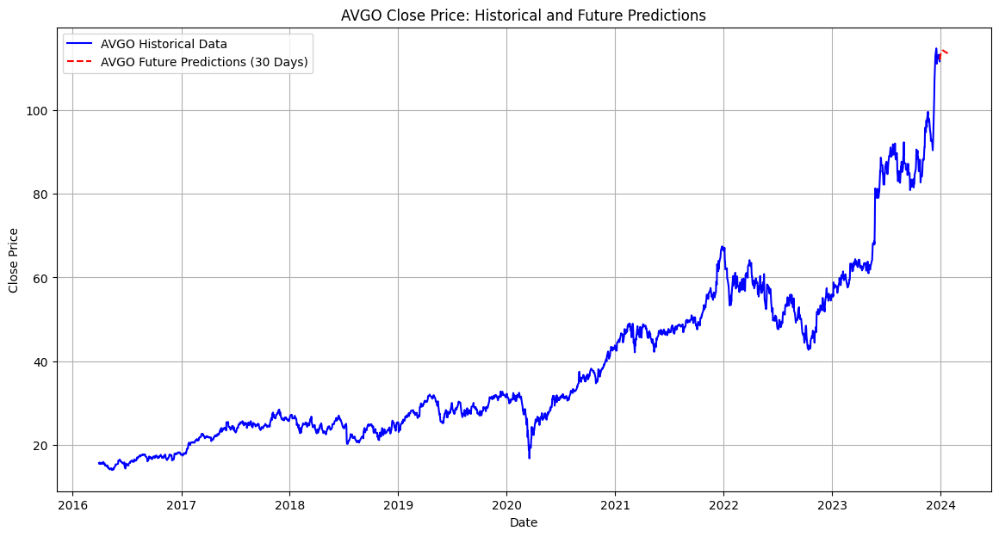

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.1613
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0033
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0020
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0017
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0017
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0013
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0014
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0013
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0010
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0011
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for BAC:
  Train MSE: 1.26, Train RMSE: 1.12, Train R²: 0.98
  Test MSE: 1.13, Test RMSE: 1.06, Test R²: 0.85
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/

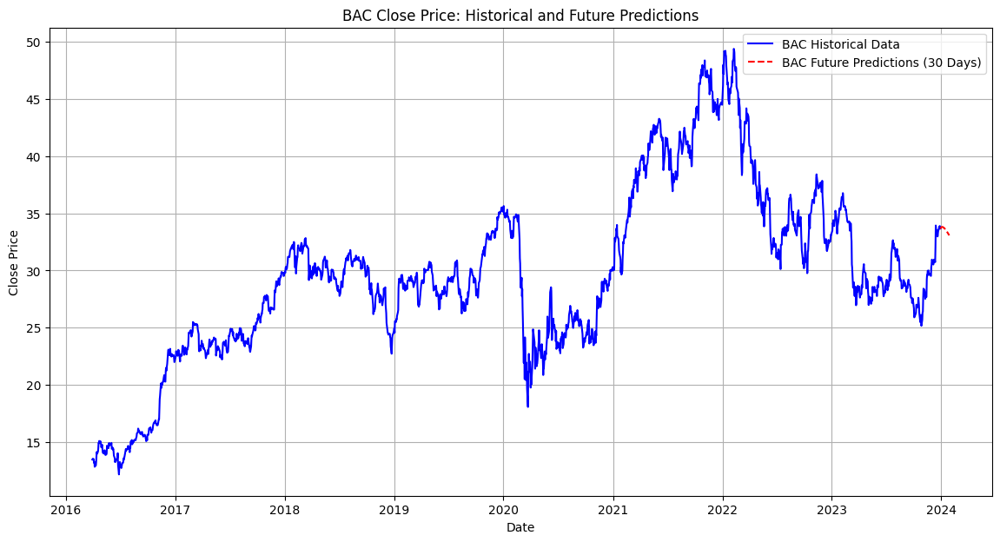

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0355
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0018
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0016
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0017
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0012
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0013
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0011
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 9.9127e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 8.5905e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 8.6193e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for BKNG:
  Train MSE: 4328.96, Train RMSE: 65.79, Train R²: 0.95
  Test MSE: 7988.61, Test RMSE: 89.38, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━

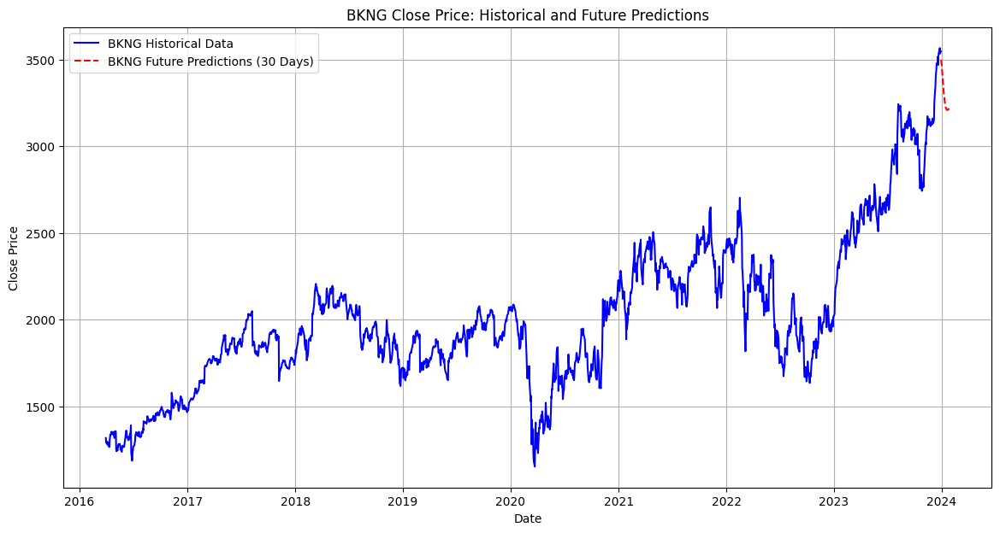

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0458
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0014
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0012
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0010
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 8.7030e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 8.9735e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 8.2270e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 7.8301e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 7.8954e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 6.1759e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for CAT:
  Train MSE: 31.03, Train RMSE: 5.57, Train R²: 0.98
  Test MSE: 62.45, Test RMSE: 7.90, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━

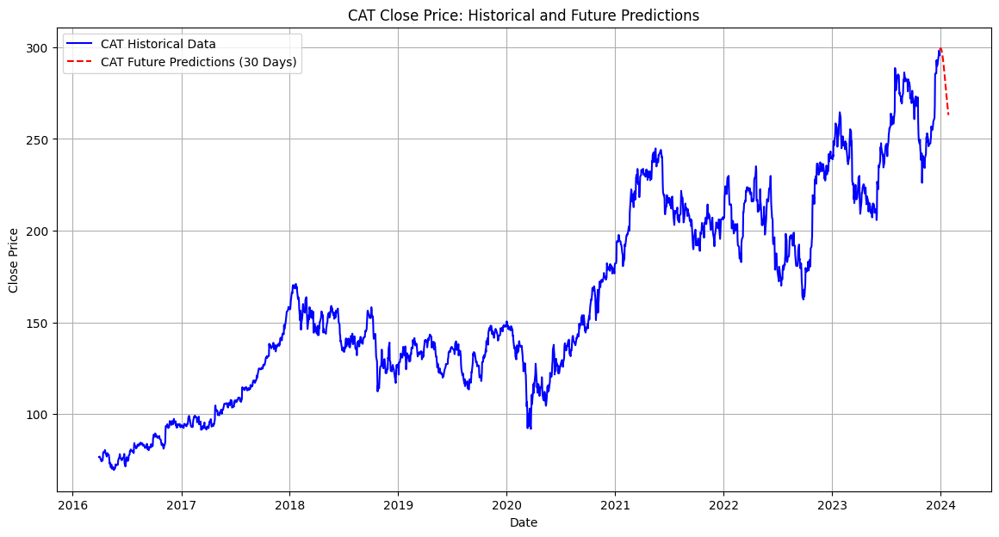

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.1712
Epoch 2/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1270
Epoch 3/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0938
Epoch 4/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0641
Epoch 5/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0264
Epoch 6/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0209
Epoch 7/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0116
Epoch 8/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0133
Epoch 9/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0109
Epoch 10/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0082
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Metrics for CEG:
  Train MSE: 40.08, Train RMSE: 6.33, Train R²: 0.78
  Test MSE: 41.31, Test RMSE: 6.43, Test R²: 0.83
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━

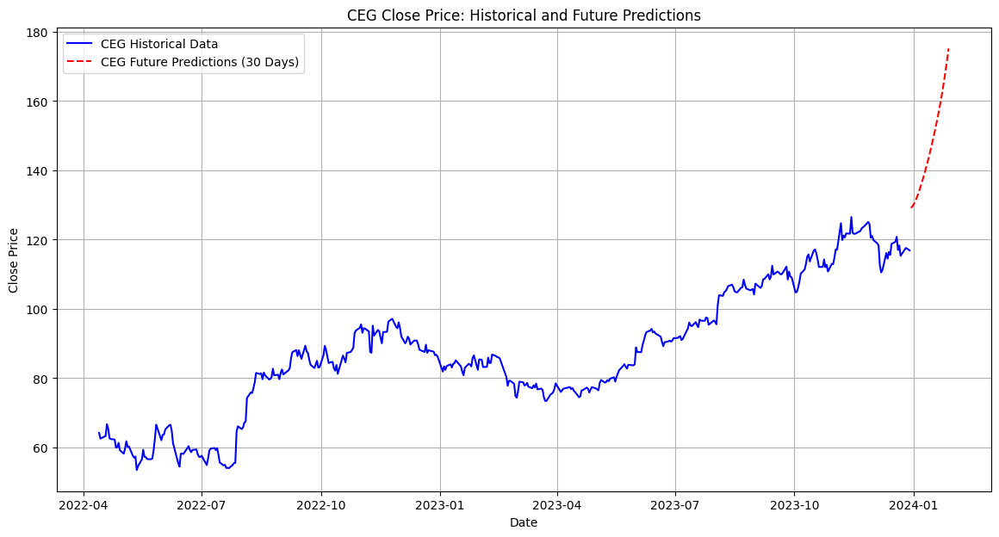

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0424
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0024
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0017
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0013
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0012
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0010
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 9.3321e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 8.2246e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 7.8372e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 7.7222e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for COP:
  Train MSE: 8.10, Train RMSE: 2.85, Train R²: 0.98
  Test MSE: 17.88, Test RMSE: 4.23, Test R²: 0.73
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━

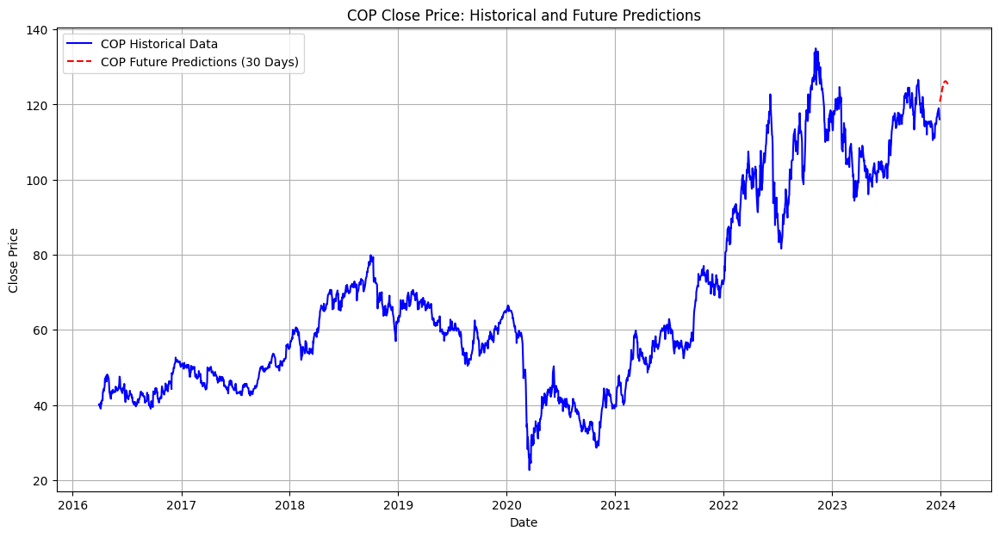

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0487
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0012
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 7.5697e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 6.1109e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 4.4608e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 4.5541e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 4.7861e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 3.4241e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 5.7481e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 2.7893e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for COST:
  Train MSE: 76.88, Train RMSE: 8.77, Train R²: 1.00
  Test MSE: 217.08, Test RMSE: 14.73, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1

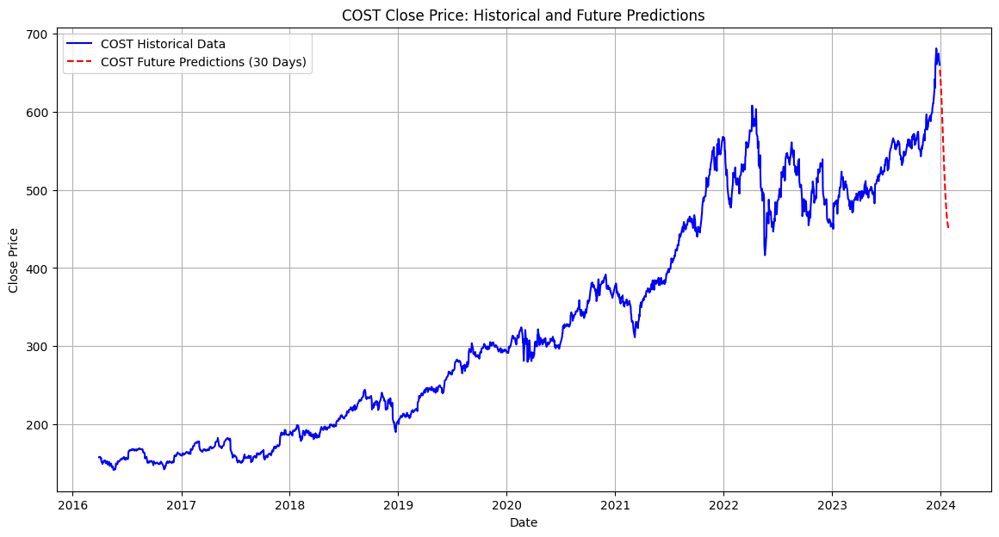

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1009
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0030
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0021
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0015
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0013
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0012
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0012
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0011
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 8.7775e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for CVX:
  Train MSE: 15.07, Train RMSE: 3.88, Train R²: 0.97
  Test MSE: 17.26, Test RMSE: 4.15, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/s

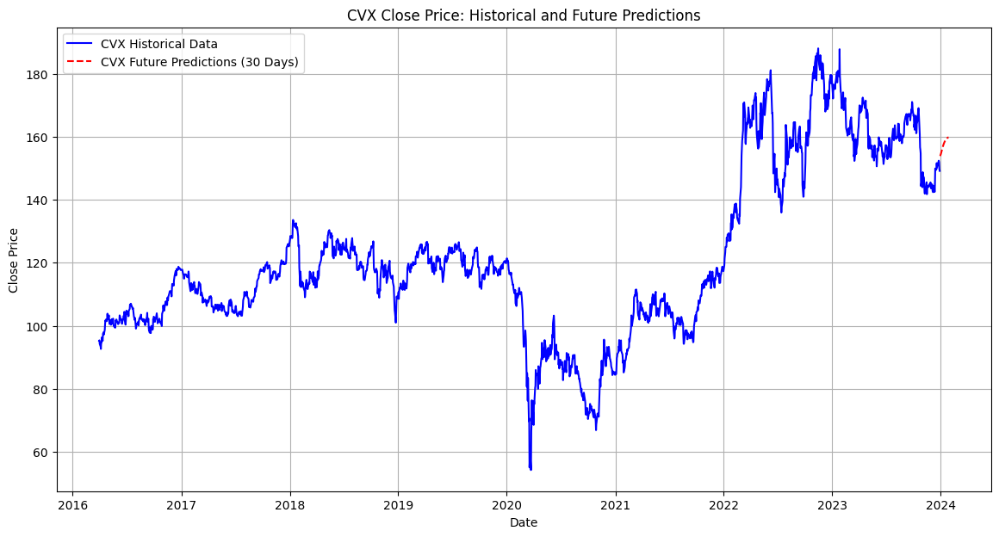

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0612
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0036
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0022
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0021
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0018
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0016
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0015
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0014
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0014
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0010
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for DIS:
  Train MSE: 13.85, Train RMSE: 3.72, Train R²: 0.98
  Test MSE: 10.21, Test RMSE: 3.19, Test R²: 0.83
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


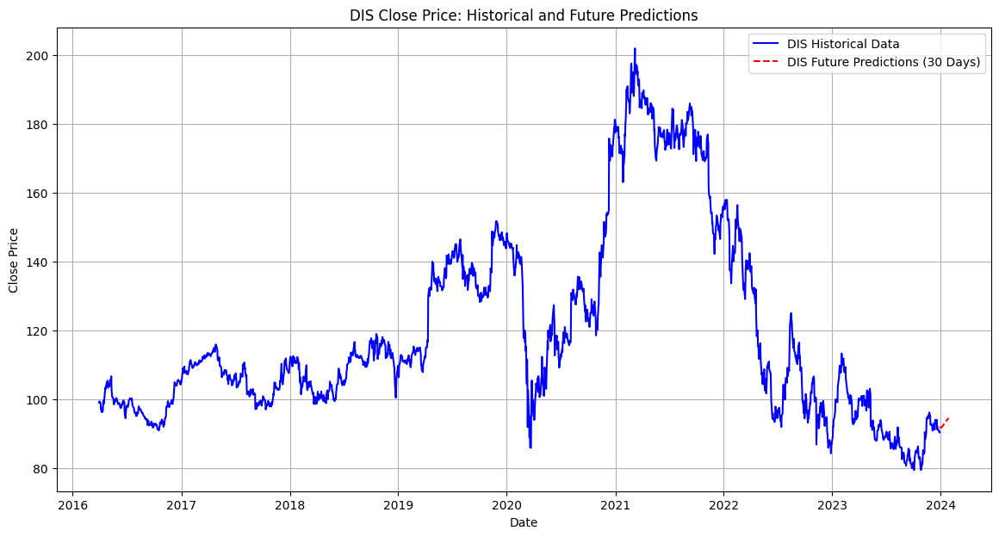

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - loss: 0.0808
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0045
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0031
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0024
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0020
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0019
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0018
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0016
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0017
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0015
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for DUK:
  Train MSE: 4.18, Train RMSE: 2.04, Train R²: 0.96
  Test MSE: 3.83, Test RMSE: 1.96, Test R²: 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/

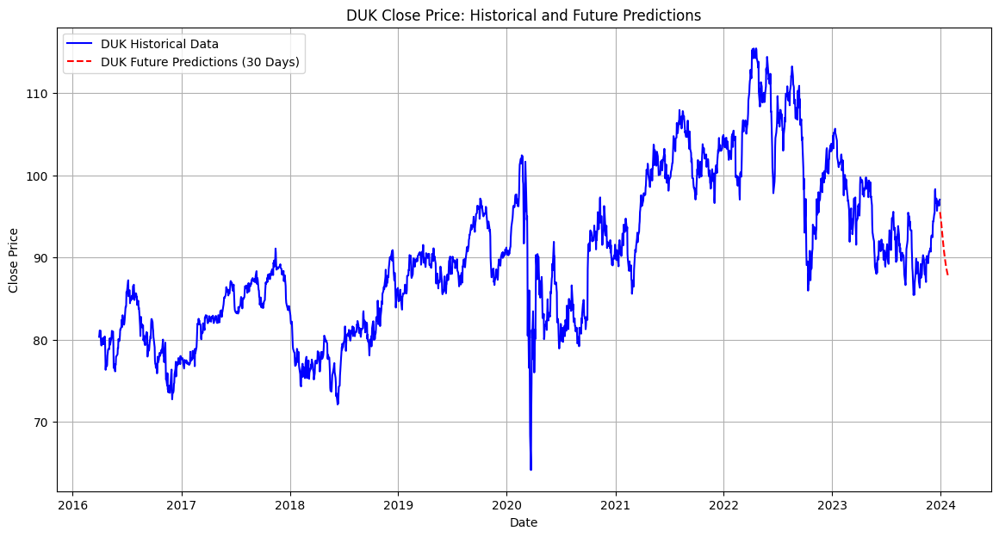

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.1373
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0044
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0030
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0028
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0028
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0024
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0023
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0021
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0020
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0020
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Metrics for ECL:
  Train MSE: 24.76, Train RMSE: 4.98, Train R²: 0.98
  Test MSE: 19.66, Test RMSE: 4.43, Test R²: 0.89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


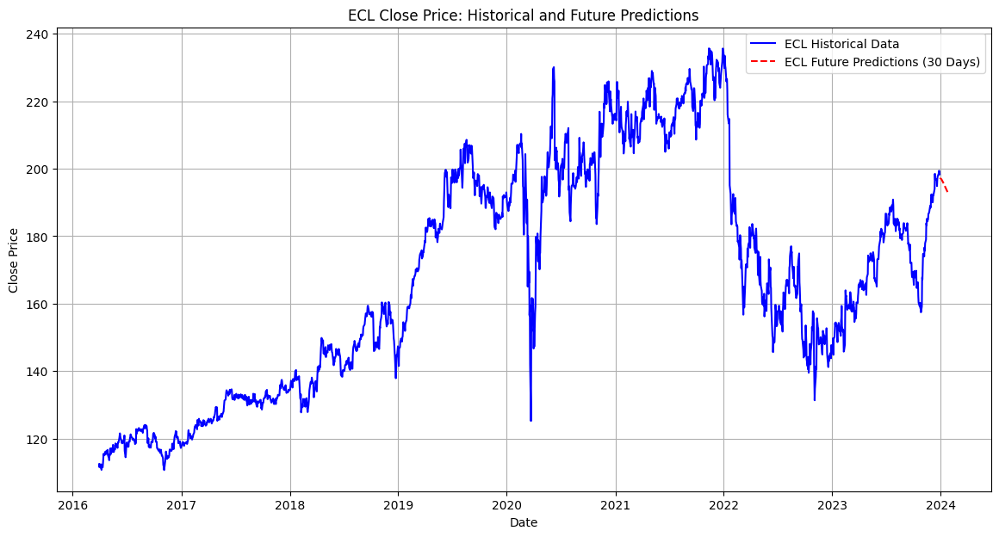

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.1110
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0043
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0027
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0020
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0019
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0016
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0016
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0016
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0013
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0012
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for EOG:
  Train MSE: 15.61, Train RMSE: 3.95, Train R²: 0.97
  Test MSE: 18.84, Test RMSE: 4.34, Test R²: 0.70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


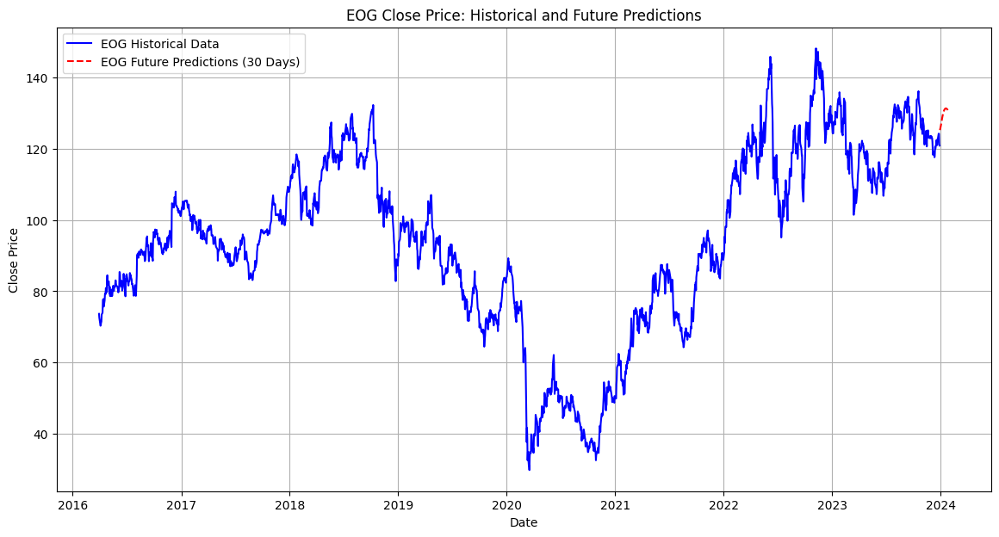

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0856
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0033
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0020
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0021
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0015
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0014
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0012
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0011
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 9.6998e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.4320e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Metrics for EQIX:
  Train MSE: 317.84, Train RMSE: 17.83, Train R²: 0.99
  Test MSE: 513.07, Test RMSE: 22.65, Test R²: 0.69
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

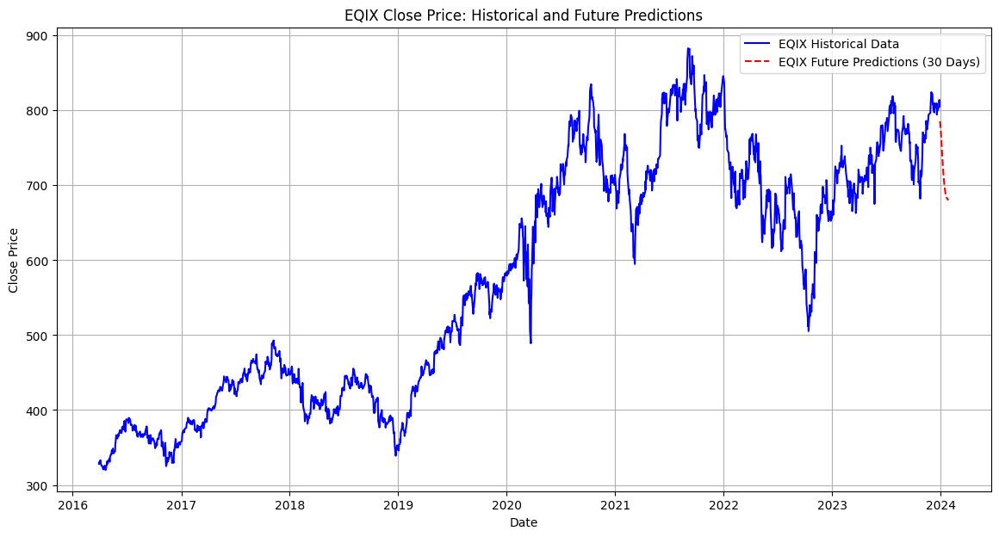

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0329
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0010
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 6.6451e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 4.7492e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 5.0030e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 4.1005e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 4.4289e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 3.9157e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 3.7422e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 3.6459e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for ETN:
  Train MSE: 13.85, Train RMSE: 3.72, Train R²: 0.99
  Test MSE: 40.18, Test RMSE: 6.34, Test R²: 0.94
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━

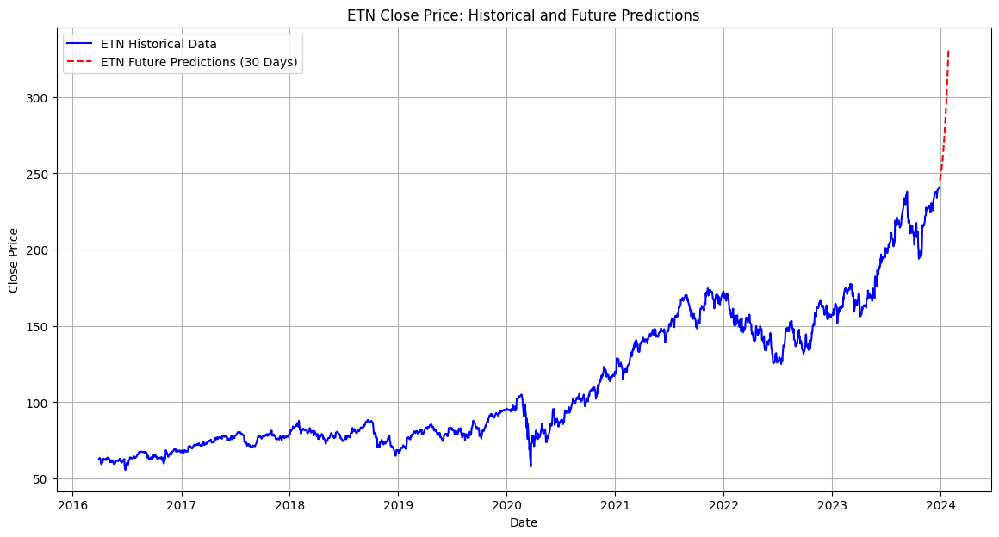

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0896
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0016
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 8.4280e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 6.5279e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 6.8767e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 5.7307e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 5.3306e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 4.6608e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 4.3574e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 4.0540e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for GE:
  Train MSE: 7.33, Train RMSE: 2.71, Train R²: 0.99
  Test MSE: 13.07, Test RMSE: 3.61, Test R²: 0.89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━

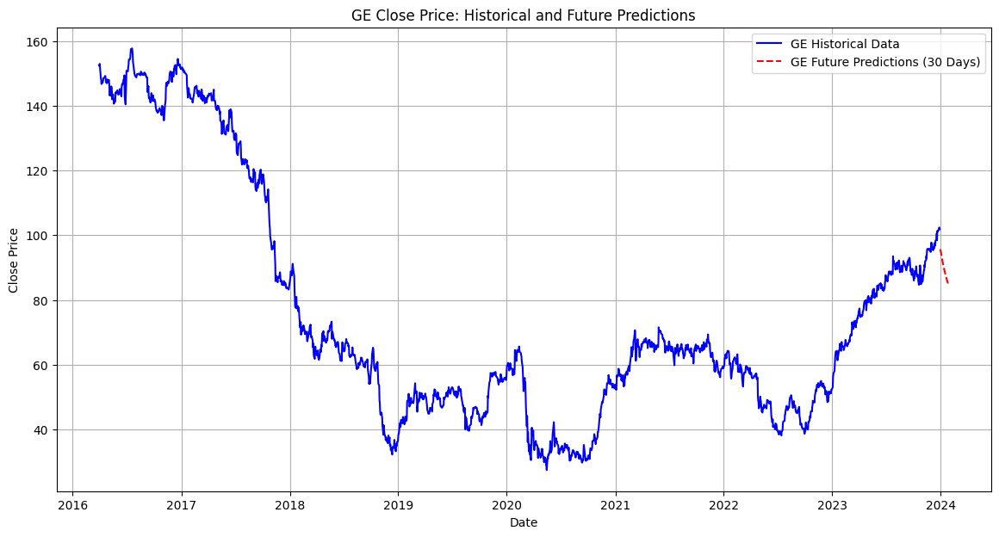

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1140
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0023
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0011
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 8.4287e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0010
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 7.5725e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 8.2875e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 7.1529e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 7.7093e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 6.5273e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for GOOG:
  Train MSE: 9.98, Train RMSE: 3.16, Train R²: 0.99
  Test MSE: 27.01, Test RMSE: 5.20, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━

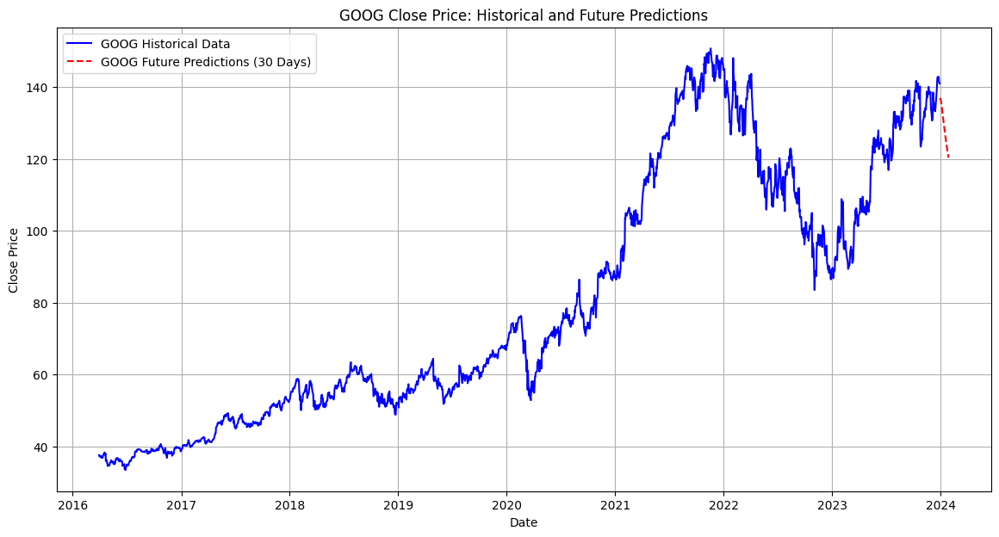

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0799
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0030
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0017
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 9.9571e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 8.9382e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 8.5956e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 7.7527e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 8.8313e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for HD:
  Train MSE: 68.50, Train RMSE: 8.28, Train R²: 0.99
  Test MSE: 66.18, Test RMSE: 8.14, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━

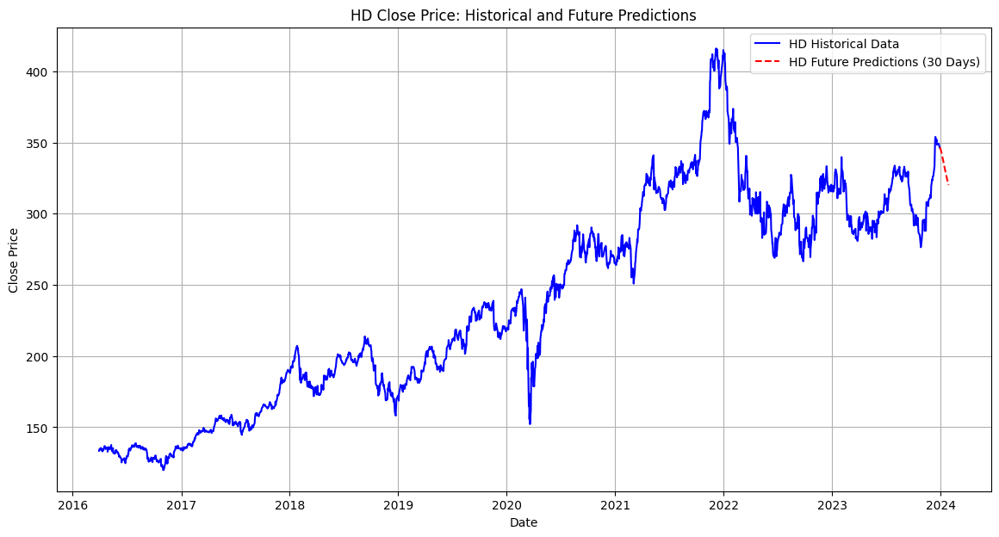

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0930
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0037
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0027
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0024
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0022
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0026
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0018
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0020
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0017
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0016
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for HON:
  Train MSE: 28.91, Train RMSE: 5.38, Train R²: 0.98
  Test MSE: 24.50, Test RMSE: 4.95, Test R²: 0.65
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


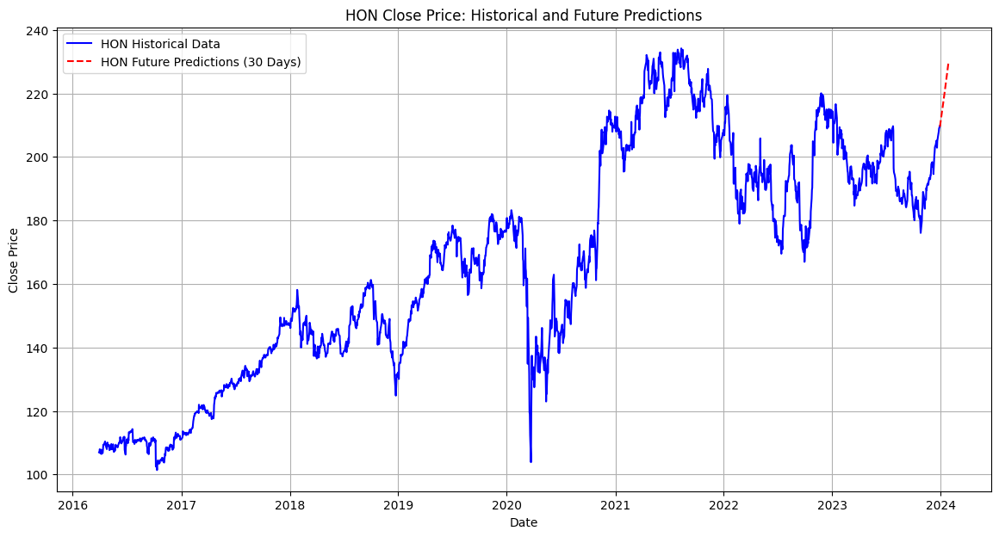

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.1092
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0052
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0031
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0028
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0023
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0019
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0018
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0021
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0018
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0013
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for JNJ:
  Train MSE: 7.94, Train RMSE: 2.82, Train R²: 0.98
  Test MSE: 10.10, Test RMSE: 3.18, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1

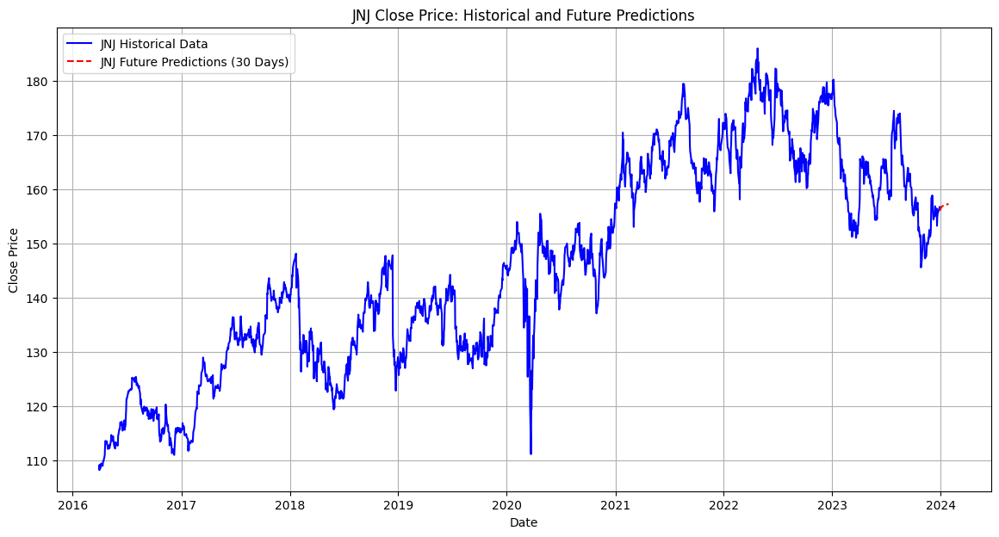

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - loss: 0.1148
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0034
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0019
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0021
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0015
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0016
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0022
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0014
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0014
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0014
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for JPM:
  Train MSE: 14.82, Train RMSE: 3.85, Train R²: 0.98
  Test MSE: 11.90, Test RMSE: 3.45, Test R²: 0.86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


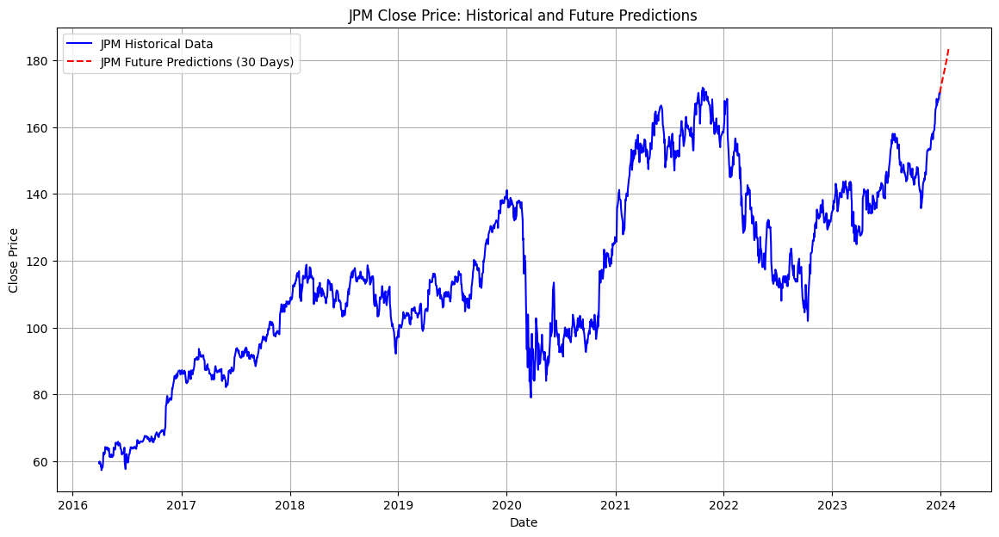

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1144
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0050
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0029
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0022
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0019
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0022
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0019
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0020
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0019
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0015
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for KO:
  Train MSE: 1.25, Train RMSE: 1.12, Train R²: 0.97
  Test MSE: 0.66, Test RMSE: 0.81, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1

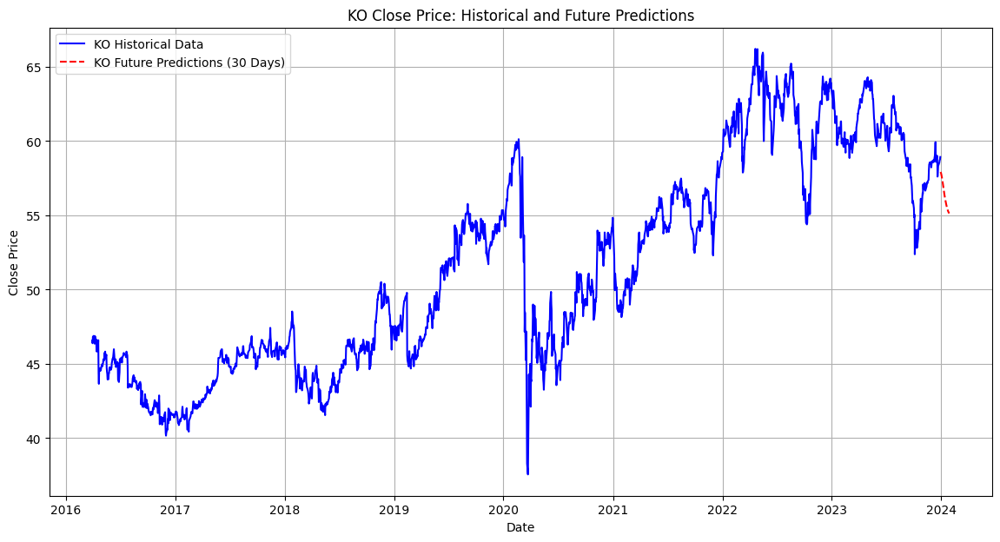

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0499
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0017
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0011
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 7.4124e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 6.2085e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 6.1309e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 6.5728e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 5.1898e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 4.8683e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for LIN:
  Train MSE: 84.51, Train RMSE: 9.19, Train R²: 0.98
  Test MSE: 65.91, Test RMSE: 8.12, Test R²: 0.89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━

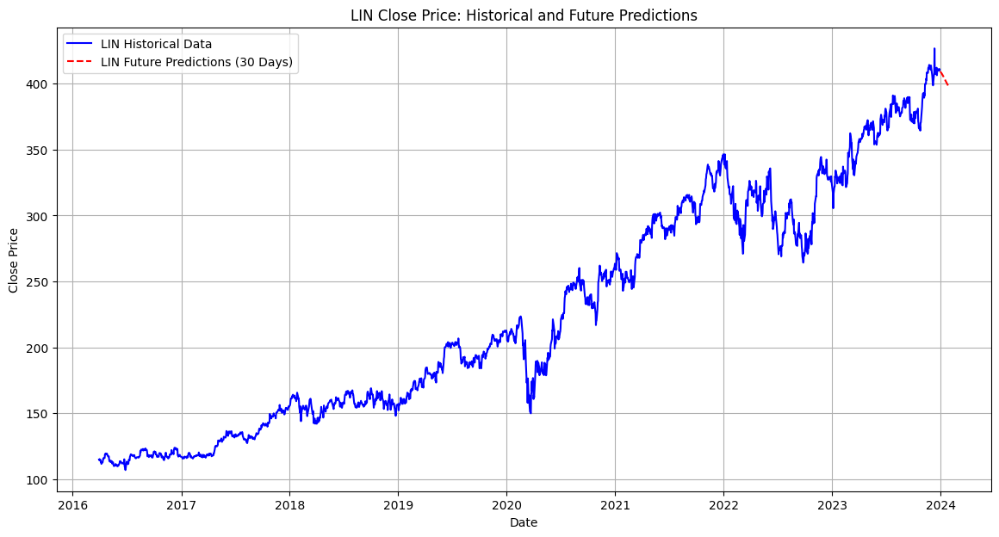

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0207
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 3.9452e-04
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 2.3061e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 2.1789e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 2.1797e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 1.9127e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 1.8516e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 1.7620e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 1.4588e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 2.0179e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Metrics for LLY:
  Train MSE: 44.86, Train RMSE: 6.70, Train R²: 0.99
  Test MSE: 1036.06, Test RMSE: 32.19, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

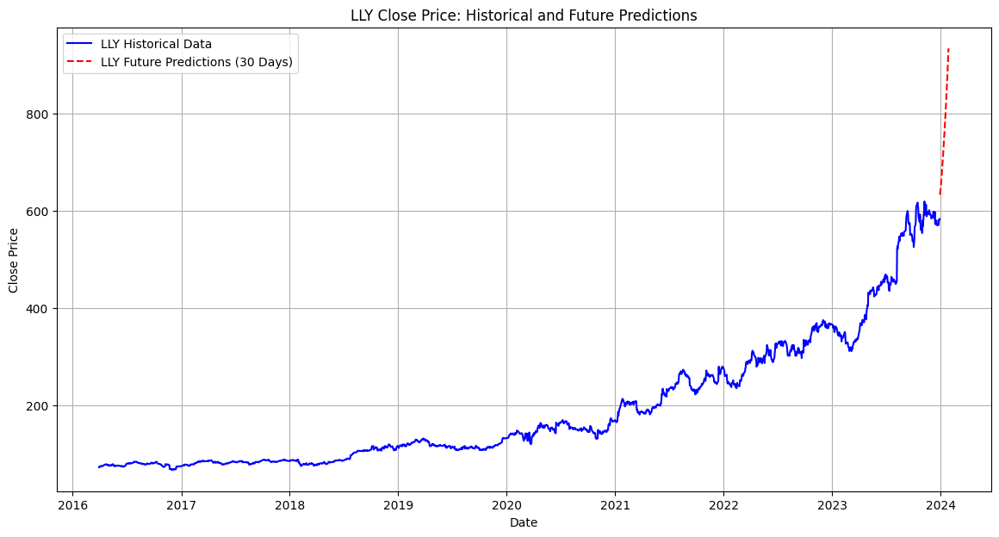

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0779
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0023
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0019
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0014
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0012
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0012
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0011
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 9.4603e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for MA:
  Train MSE: 105.24, Train RMSE: 10.26, Train R²: 0.99
  Test MSE: 73.72, Test RMSE: 8.59, Test R²: 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/

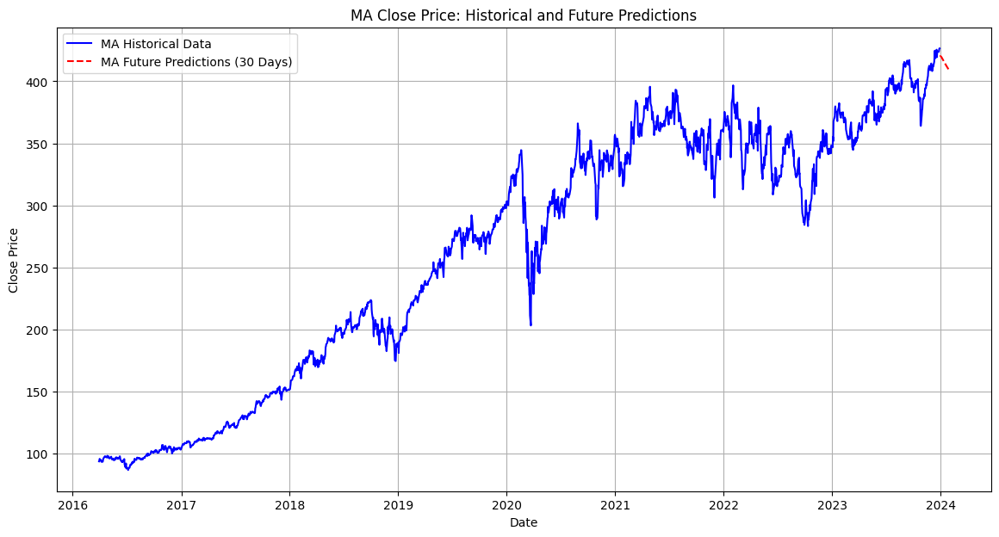

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0622
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0021
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0014
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0012
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0012
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.9978e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 9.8522e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 9.4818e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 7.2852e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Metrics for MCD:
  Train MSE: 25.75, Train RMSE: 5.07, Train R²: 0.99
  Test MSE: 35.20, Test RMSE: 5.93, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━

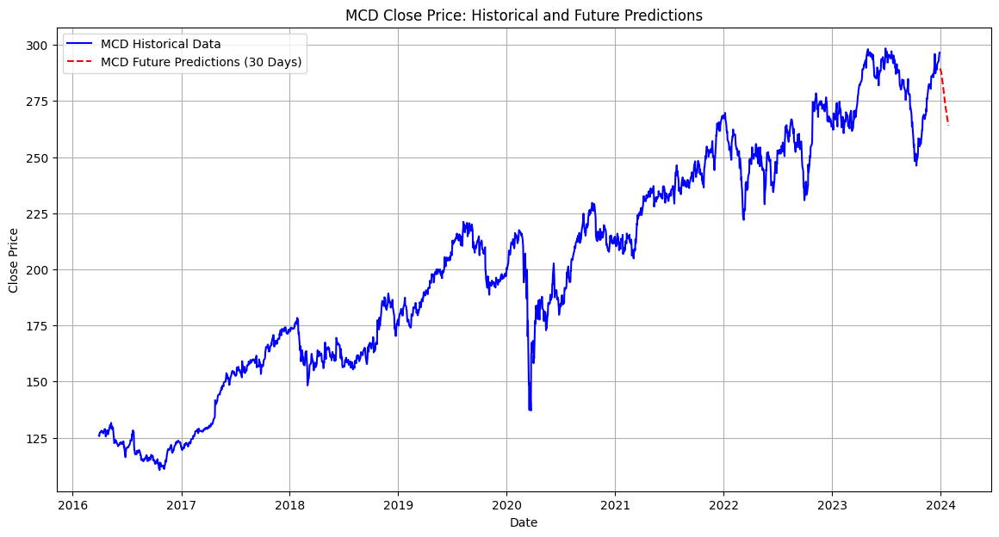

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0775
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0047
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0022
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0018
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0013
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0012
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0011
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0012
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0011
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for META:
  Train MSE: 163.35, Train RMSE: 12.78, Train R²: 0.96
  Test MSE: 408.30, Test RMSE: 20.21, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/

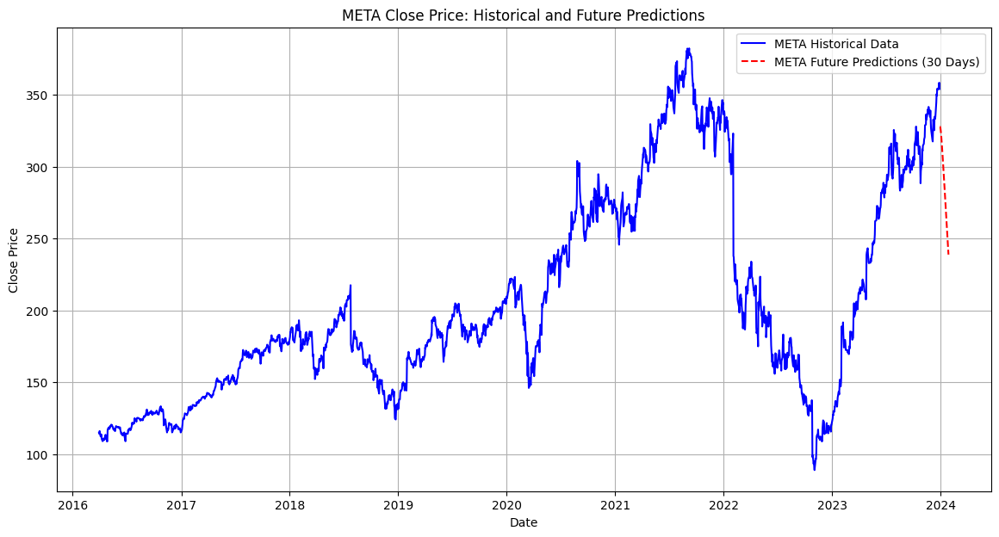

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0408
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0021
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0014
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0012
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0010
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0010
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 9.7864e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 9.5654e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 8.9973e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 8.4605e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Metrics for MRK:
  Train MSE: 3.57, Train RMSE: 1.89, Train R²: 0.98
  Test MSE: 5.12, Test RMSE: 2.26, Test R²: 0.71
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

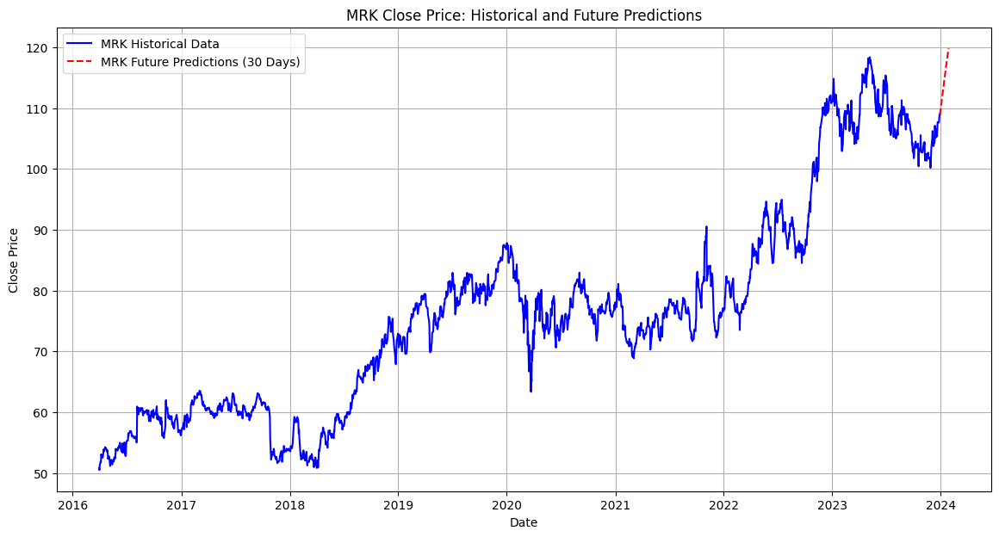

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.0840
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0012
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 7.6716e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 6.0277e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 5.2057e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 5.2969e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 5.1201e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 5.0001e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 4.8280e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 4.9940e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Metrics for MSFT:
  Train MSE: 149.13, Train RMSE: 12.21, Train R²: 0.98
  Test MSE: 680.92, Test RMSE: 26.09, Test R²: 0.59
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1

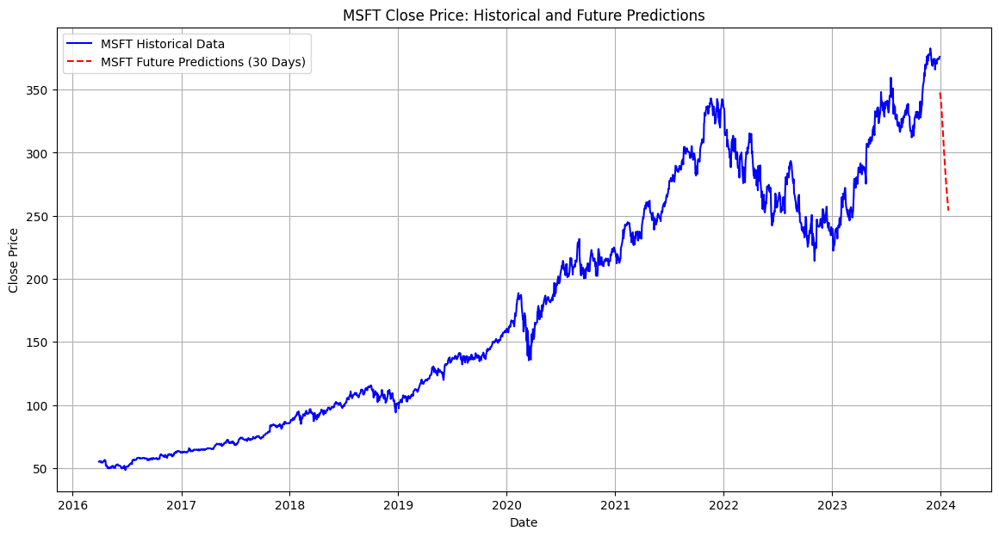

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0840
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0023
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0018
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0018
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0012
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.7814e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.3262e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0013
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 9.6762e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 7.6569e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for NEE:
  Train MSE: 2.96, Train RMSE: 1.72, Train R²: 0.99
  Test MSE: 8.06, Test RMSE: 2.84, Test R²: 0.89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

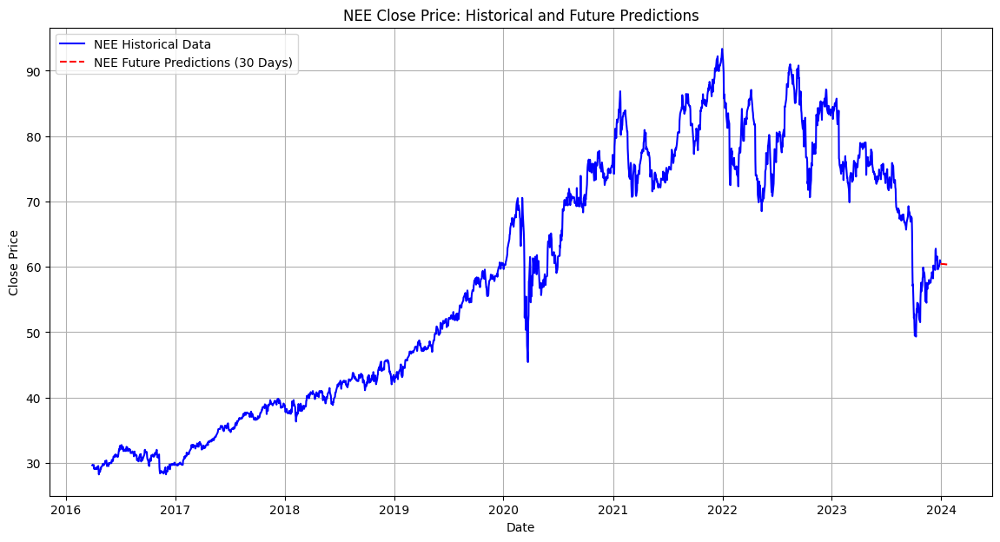

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1156
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0030
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - loss: 0.0013
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0013
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0011
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0011
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 9.8341e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 9.7908e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 9.0770e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 9.1361e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Metrics for NFLX:
  Train MSE: 328.41, Train RMSE: 18.12, Train R²: 0.99
  Test MSE: 287.12, Test RMSE: 16.94, Test R²: 0.90
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━

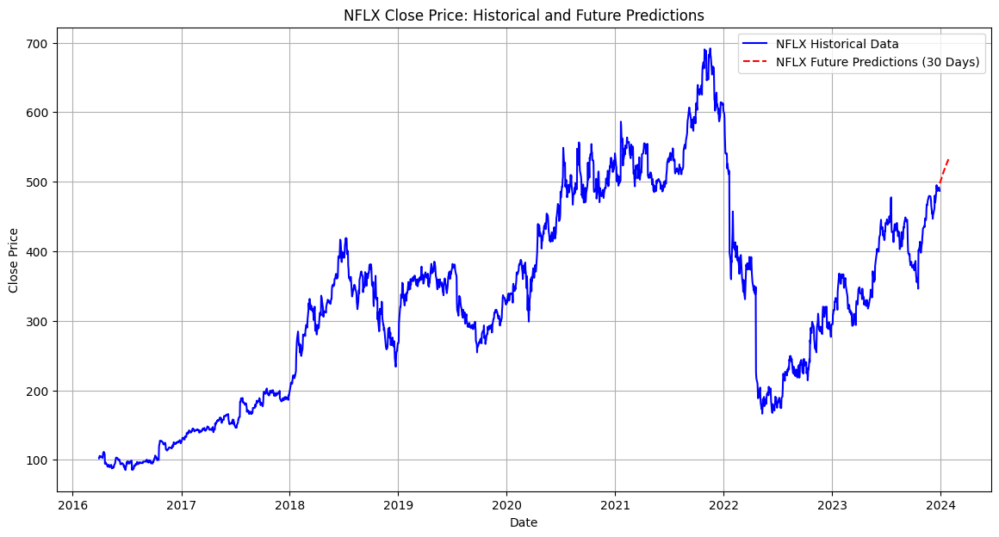

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.0226
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0011
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 6.5054e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 5.0149e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 4.3077e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 5.2722e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 4.1519e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 3.7414e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 3.9638e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 3.7445e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for NVDA:
  Train MSE: 0.70, Train RMSE: 0.83, Train R²: 0.99
  Test MSE: 6.32, Test RMSE: 2.51, Test R²: 0.95
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━

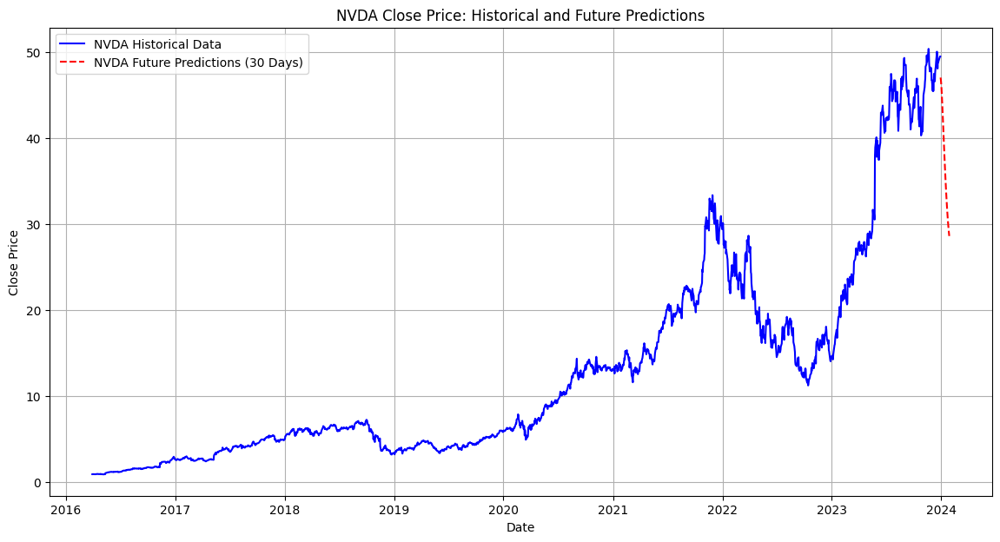

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.0202
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0012
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 8.2327e-04
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 7.0598e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 6.7976e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 6.5380e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 5.1855e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 5.6281e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 5.5394e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 4.5805e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Metrics for ORCL:
  Train MSE: 3.60, Train RMSE: 1.90, Train R²: 0.98
  Test MSE: 17.59, Test RMSE: 4.19, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━

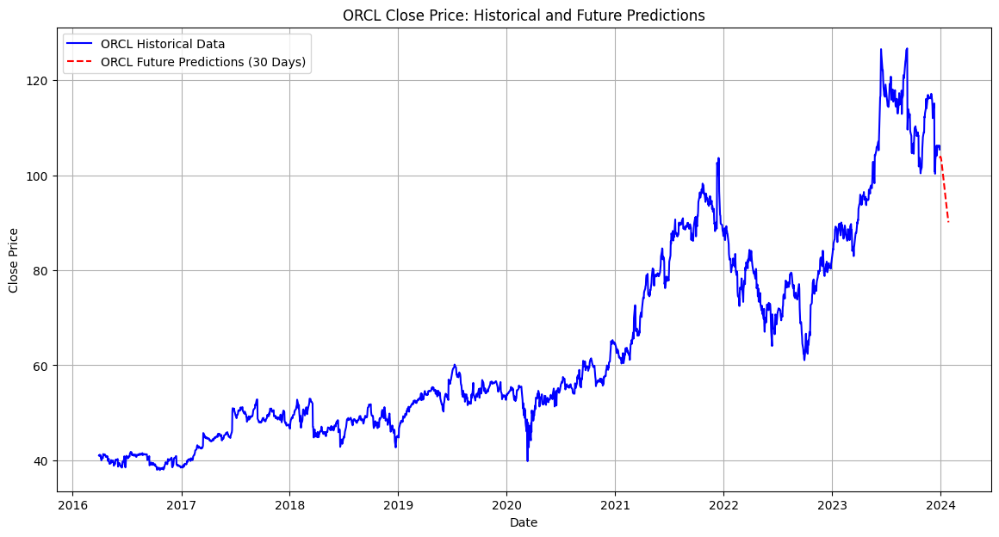

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.0780
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0025
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0015
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 9.7170e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 9.1217e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 7.1708e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 8.1306e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 5.5284e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 6.1135e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Metrics for PEP:
  Train MSE: 5.70, Train RMSE: 2.39, Train R²: 0.99
  Test MSE: 9.17, Test RMSE: 3.03, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━

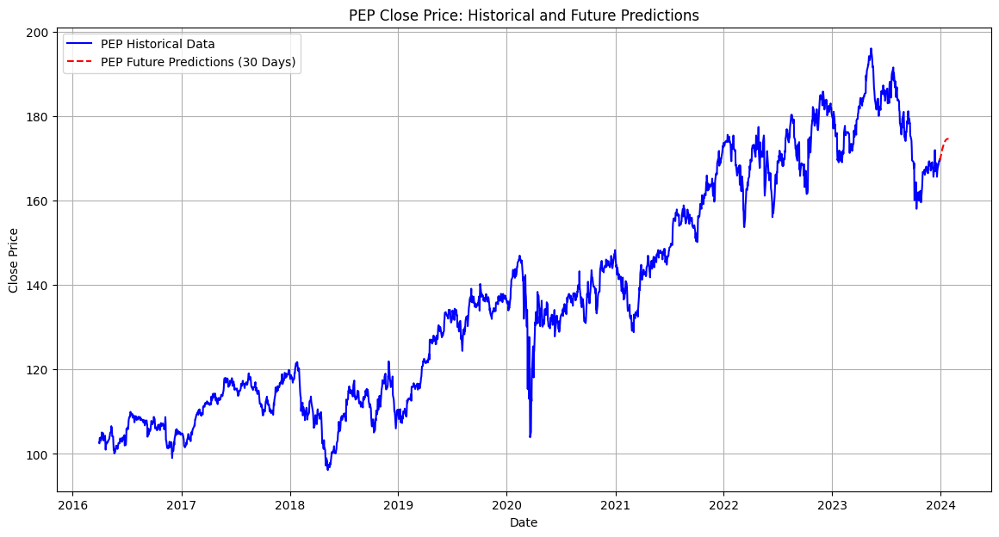

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.1078
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0033
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - loss: 0.0020
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0013
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0011
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0011
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 9.9052e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 9.4387e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 8.0289e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for PG:
  Train MSE: 7.44, Train RMSE: 2.73, Train R²: 0.99
  Test MSE: 9.96, Test RMSE: 3.16, Test R²: 0.63
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 3

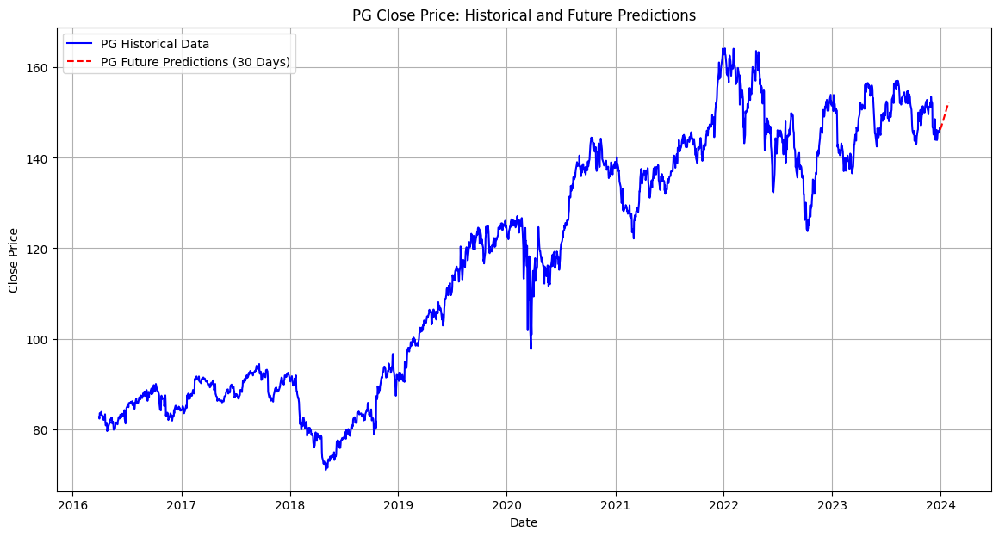

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0606
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0020
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0015
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 8.5293e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0013
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 8.0092e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 7.5435e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 6.0876e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 7.1139e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for PLD:
  Train MSE: 8.85, Train RMSE: 2.97, Train R²: 0.99
  Test MSE: 12.85, Test RMSE: 3.58, Test R²: 0.78
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━

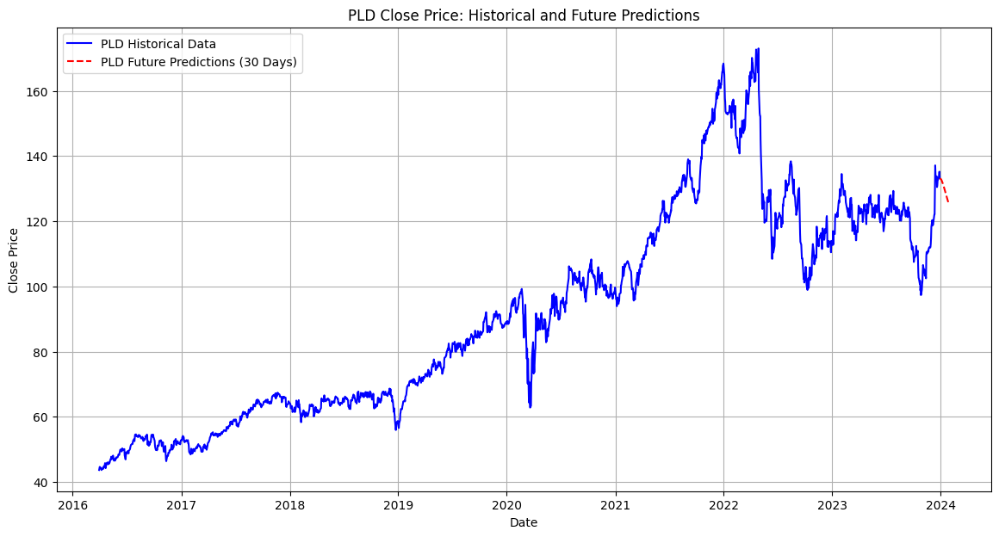

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.1183
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0044
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0035
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0032
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0025
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0023
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0022
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0022
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0018
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0016
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for RTX:
  Train MSE: 5.47, Train RMSE: 2.34, Train R²: 0.96
  Test MSE: 6.25, Test RMSE: 2.50, Test R²: 0.93
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1

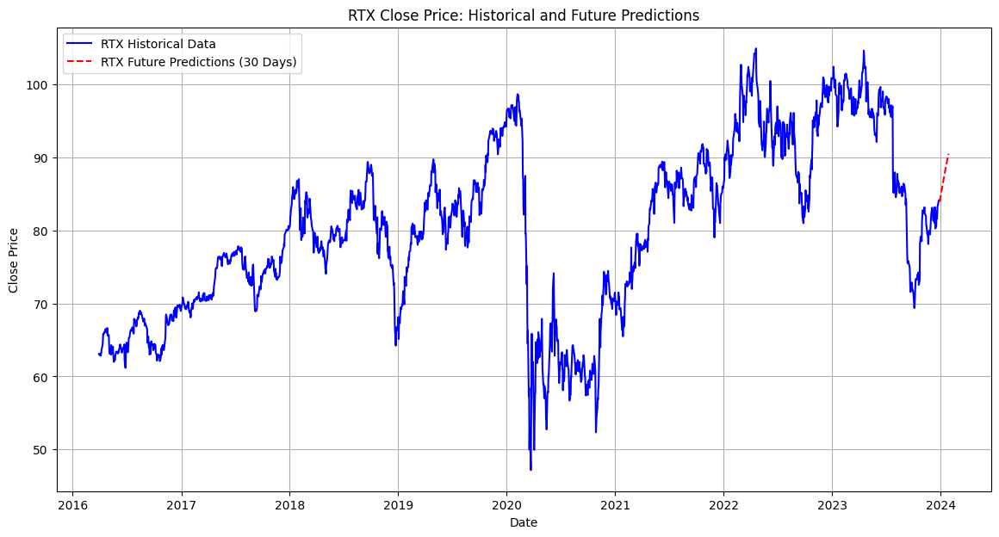

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.0713
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0025
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0016
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0013
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0013
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0011
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0011
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0010
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 9.4479e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for SCCO:
  Train MSE: 3.51, Train RMSE: 1.87, Train R²: 0.98
  Test MSE: 7.70, Test RMSE: 2.77, Test R²: 0.65
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/st

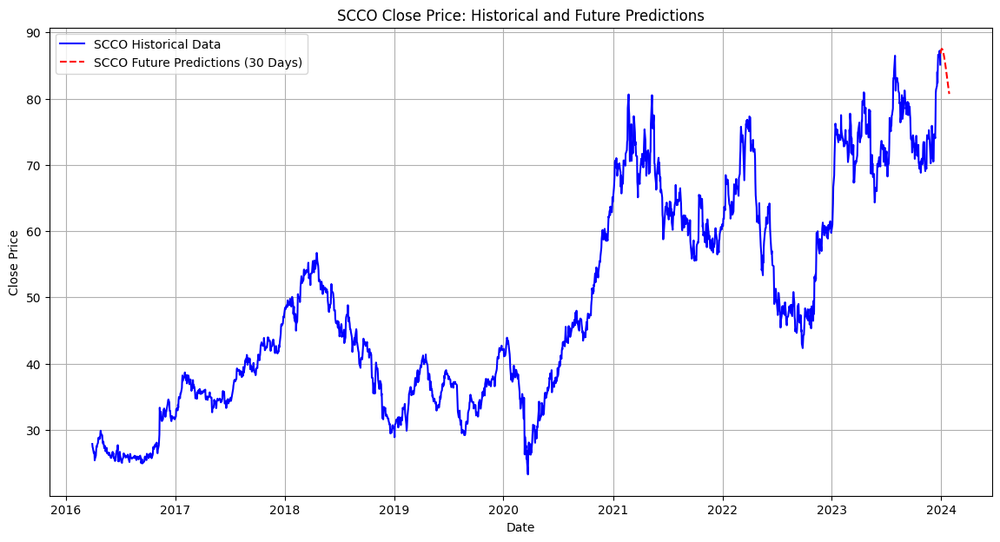

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - loss: 0.0756
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0015
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0010
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 8.2011e-04
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 8.6397e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 6.8925e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 6.6639e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 6.5824e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 5.7780e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 5.8956e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for SHW:
  Train MSE: 37.84, Train RMSE: 6.15, Train R²: 0.99
  Test MSE: 44.28, Test RMSE: 6.65, Test R²: 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━

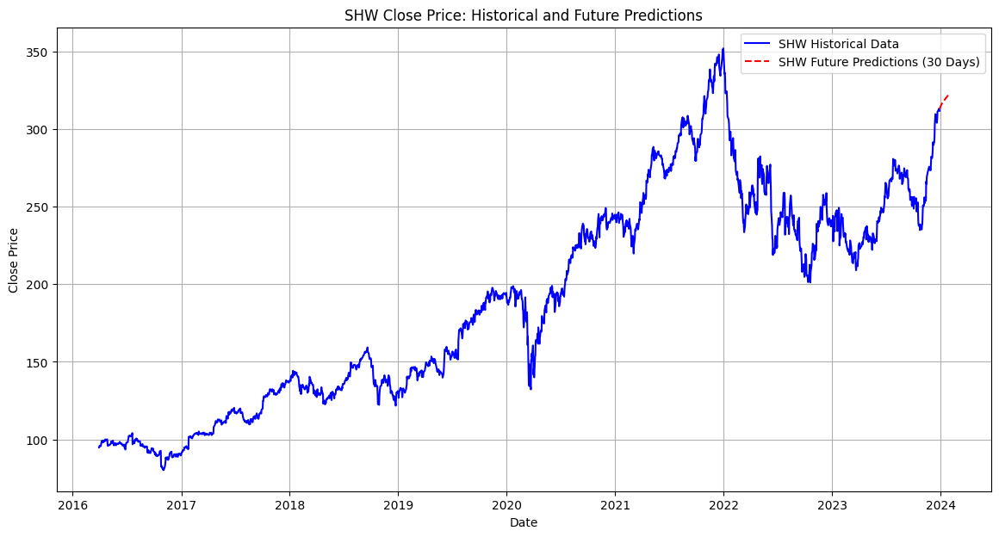

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0838
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0057
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0036
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0024
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0019
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0017
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0014
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0014
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0013
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0013
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for SO:
  Train MSE: 1.53, Train RMSE: 1.24, Train R²: 0.98
  Test MSE: 1.74, Test RMSE: 1.32, Test R²: 0.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1

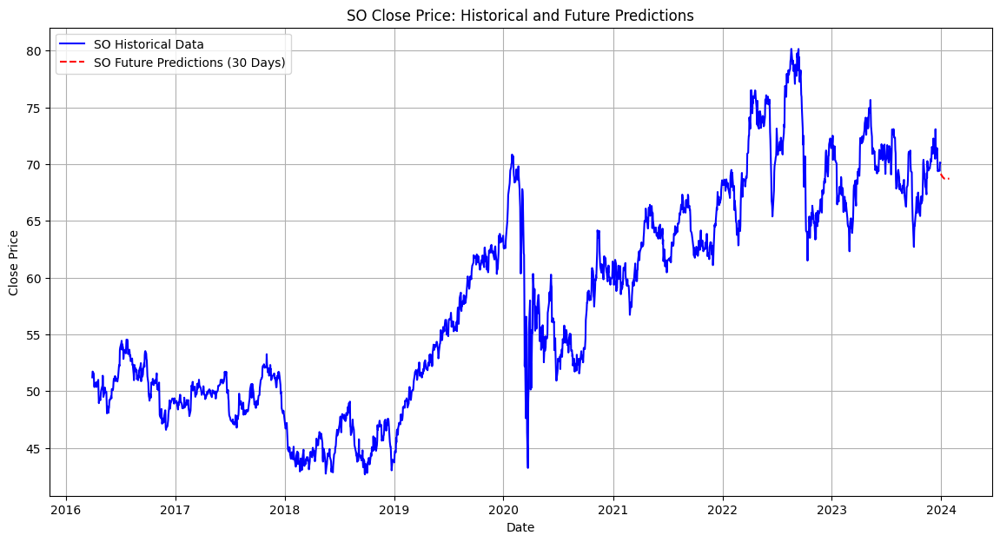

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1520
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0023
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0016
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0012
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0013
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0011
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0011
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 8.8202e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 8.2953e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0010
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for SPG:
  Train MSE: 24.50, Train RMSE: 4.95, Train R²: 0.98
  Test MSE: 16.98, Test RMSE: 4.12, Test R²: 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38

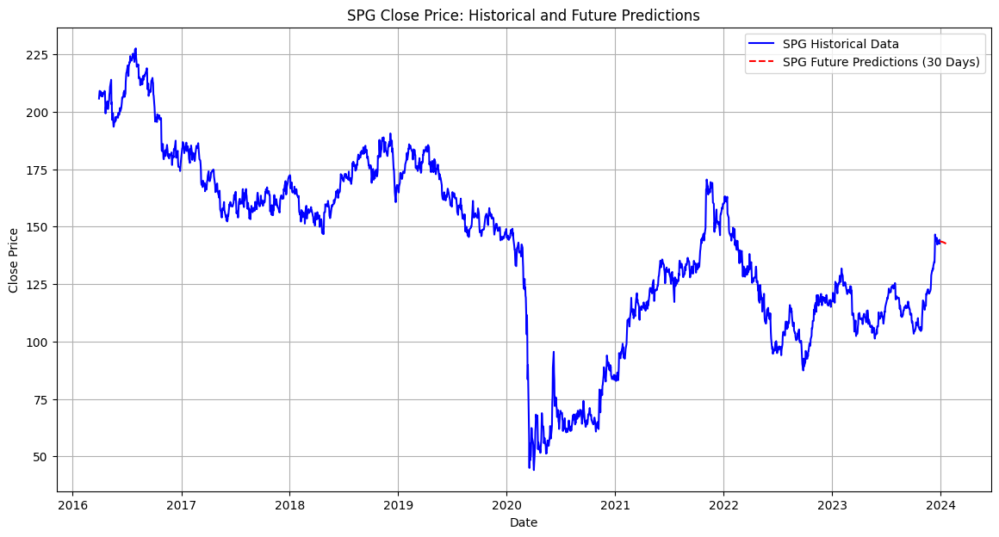

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1297
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0022
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0013
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 8.5879e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 9.2656e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 8.4675e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 8.5188e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 8.0370e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 7.0478e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for TMUS:
  Train MSE: 9.21, Train RMSE: 3.04, Train R²: 0.99
  Test MSE: 11.59, Test RMSE: 3.40, Test R²: 0.72
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━

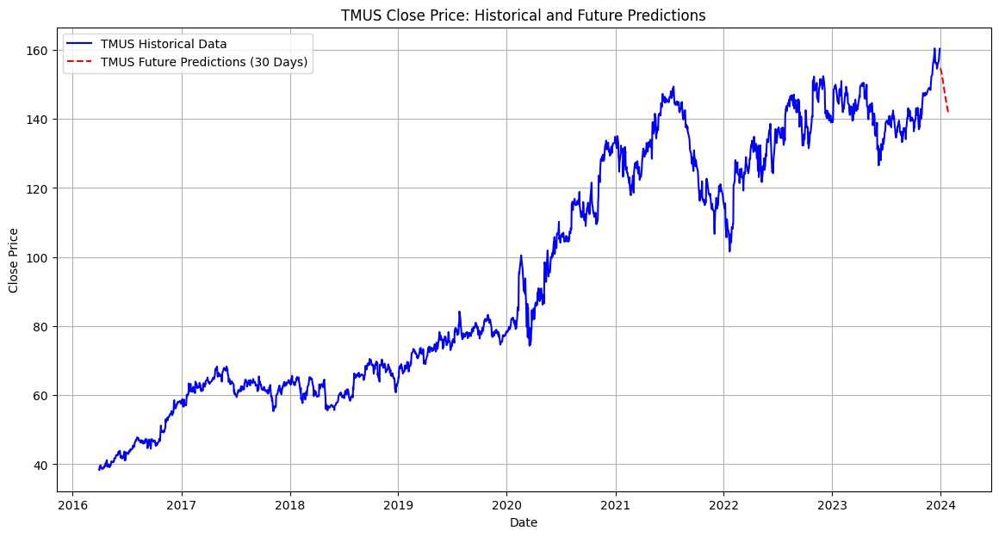

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0461
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0023
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0016
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0017
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0012
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0012
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0010
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0011
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 7.8063e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 8.0424e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Metrics for TSLA:
  Train MSE: 132.50, Train RMSE: 11.51, Train R²: 0.99
  Test MSE: 207.62, Test RMSE: 14.41, Test R²: 0.88
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

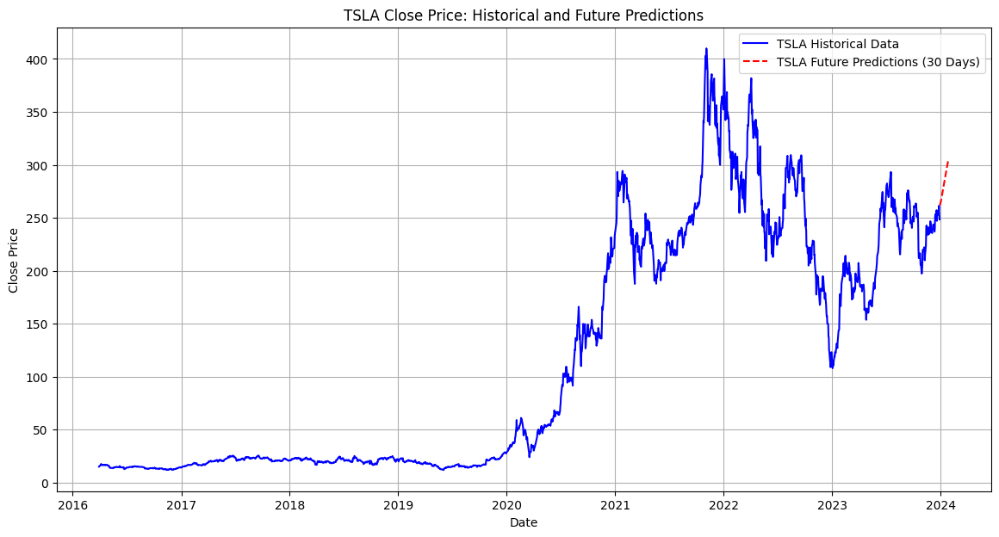

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - loss: 0.0912
Epoch 2/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0035
Epoch 3/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0027
Epoch 4/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.0025
Epoch 5/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0022
Epoch 6/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0020
Epoch 7/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0017
Epoch 8/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0015
Epoch 9/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0020
Epoch 10/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0014
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Metrics for TXGE:
  Train MSE: 3140.72, Train RMSE: 56.04, Train R²: 0.97
  Test MSE: 2594.64, Test RMSE: 50.94, Test R²: 0.85
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38m

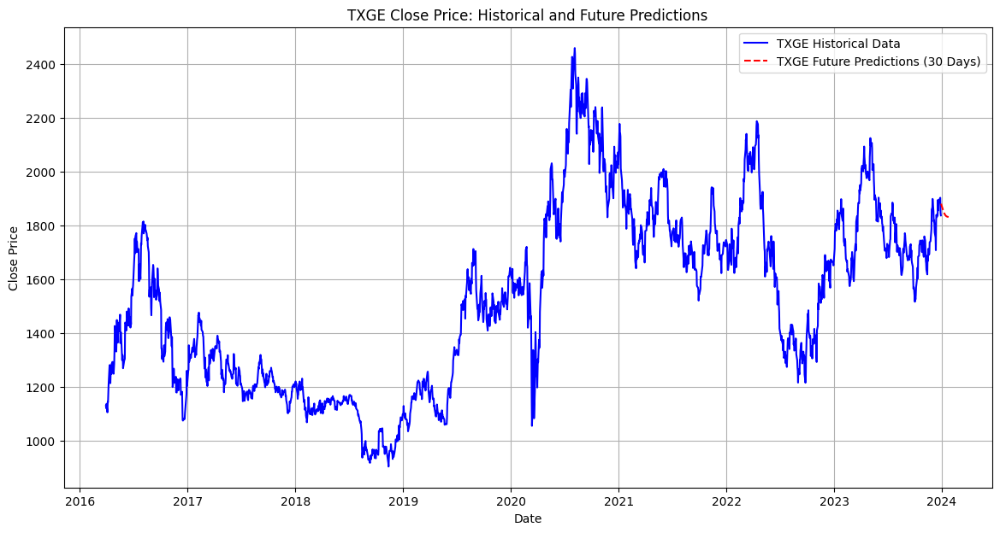

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - loss: 0.1217
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0015
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.0011
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0010
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - loss: 7.6857e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 8.8972e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 9.5033e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 7.2963e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 6.7521e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 6.8643e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Metrics for UNH:
  Train MSE: 163.22, Train RMSE: 12.78, Train R²: 0.99
  Test MSE: 270.79, Test RMSE: 16.46, Test R²: 0.52
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━

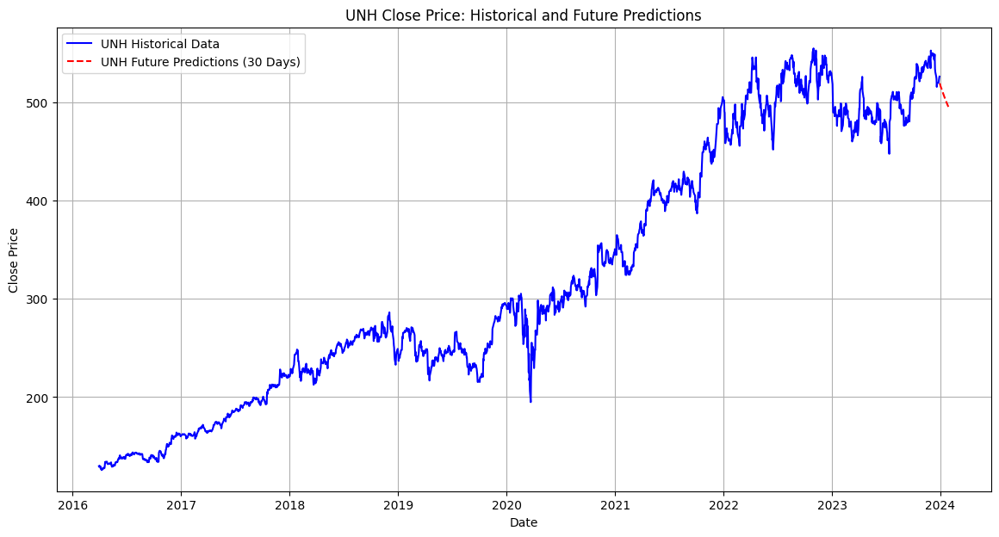

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - loss: 0.0912
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0019
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0014
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.0011
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0010
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.6274e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 8.3446e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 8.1949e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 7.5535e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for V:
  Train MSE: 25.59, Train RMSE: 5.06, Train R²: 0.99
  Test MSE: 21.09, Test RMSE: 4.59, Test R²: 0.84
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

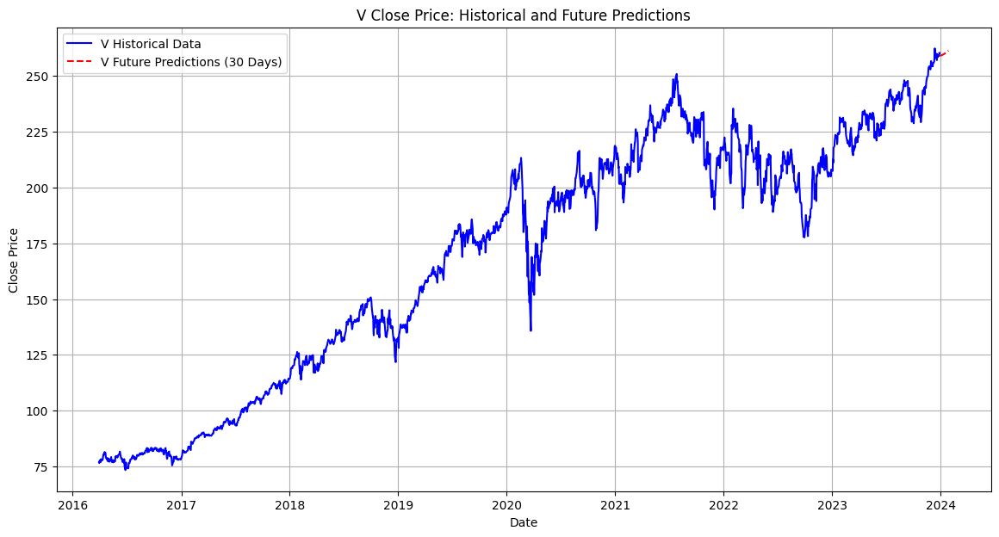

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1786
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0079
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0037
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0025
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0035
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0020
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0019
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0018
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0016
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0016
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Metrics for WELL:
  Train MSE: 6.17, Train RMSE: 2.48, Train R²: 0.96
  Test MSE: 5.05, Test RMSE: 2.25, Test R²: 0.86
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1

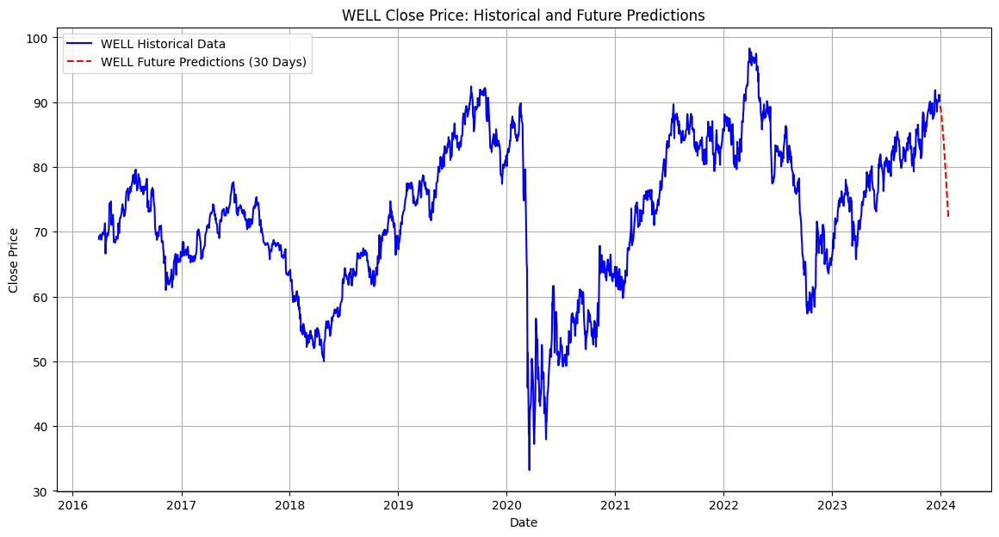

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.0931
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0025
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0022
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.0016
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0014
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0011
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0010
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0013
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 8.8472e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 7.5155e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Metrics for WMT:
  Train MSE: 1.62, Train RMSE: 1.27, Train R²: 0.98
  Test MSE: 1.29, Test RMSE: 1.14, Test R²: 0.80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms

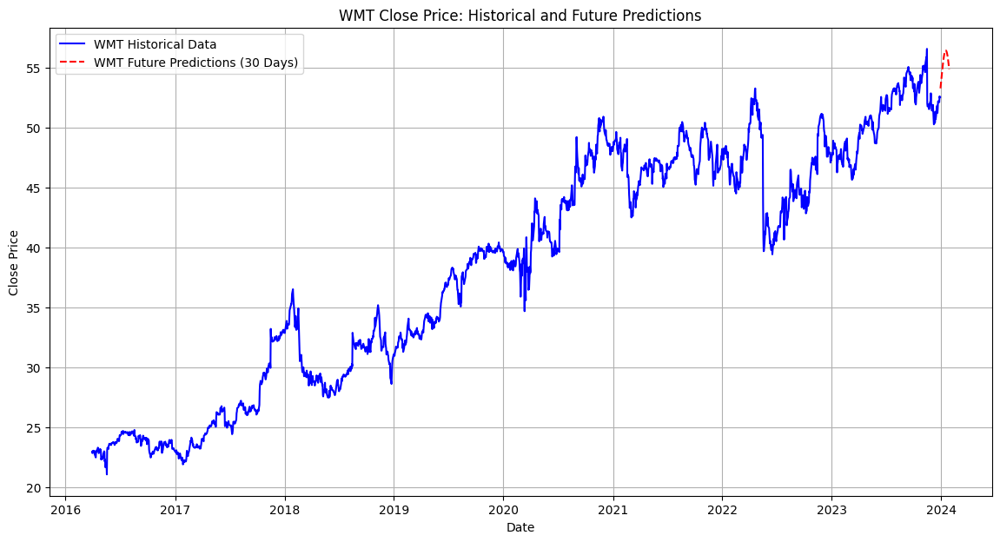

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.0976
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0019
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0014
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0011
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 8.9702e-04
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 9.8423e-04
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 7.9194e-04
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 7.9773e-04
Epoch 9/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 8.1842e-04
Epoch 10/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 7.3232e-04
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Metrics for XOM:
  Train MSE: 10.14, Train RMSE: 3.18, Train R²: 0.97
  Test MSE: 18.99, Test RMSE: 4.36, Test R²: 0.28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━

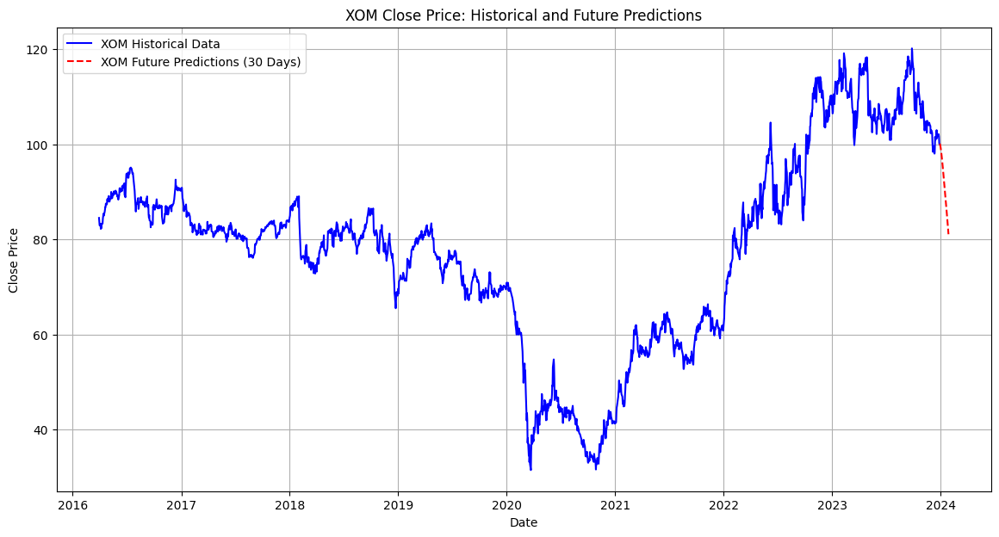

In [21]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

file_path = '/content/stocks_data.csv'
df = pd.read_csv(file_path)

df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df = df.dropna(subset=['Date'])
df = df.sort_values(by=['Ticker', 'Date'])

df['Ticker'] = df['Ticker'].astype(str).str.strip().str.upper()

results_close = {}

for ticker in df['Ticker'].unique():
    company_data = df[df['Ticker'] == ticker].copy()

    company_data['SMA_60'] = company_data['Close'].rolling(window=60).mean()
    company_data = company_data.dropna(subset=['SMA_60'])

    train_data = company_data[company_data['Date'] <= '2022-12-31']
    test_data = company_data[company_data['Date'] >= '2023-01-01']

    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(company_data[['Close', 'SMA_60']].values)

    # Create sequences for LSTM
    def create_sequences(data, lookback=30):
        X, y = [], []
        for i in range(lookback, len(data)):
            X.append(data[i - lookback:i, :])
            y.append(data[i, 0])
        return np.array(X), np.array(y)

    lookback = 30
    full_X, full_y = create_sequences(scaled_data, lookback)

    # Split into training and testing
    train_size = len(train_data) - lookback
    train_X, train_y = full_X[:train_size], full_y[:train_size]
    test_X, test_y = full_X[train_size:], full_y[train_size:]

    # Reshape input data
    train_X = train_X.reshape(train_X.shape[0], train_X.shape[1], train_X.shape[2])
    test_X = test_X.reshape(test_X.shape[0], test_X.shape[1], test_X.shape[2])

    # Build the LSTM model
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(50, activation='relu', return_sequences=True, input_shape=(lookback, 2)),
        tf.keras.layers.LSTM(50, activation='relu'),
        tf.keras.layers.Dense(1)
    ])

    model.compile(optimizer='adam', loss='mse')

    model.fit(train_X, train_y, epochs=10, batch_size=32, verbose=1)

    train_predictions = model.predict(train_X)
    test_predictions = model.predict(test_X)

    # Rescale predictions
    train_predictions = scaler.inverse_transform(np.concatenate((train_predictions, train_X[:, -1, 1:]), axis=1))[:, 0]
    test_predictions = scaler.inverse_transform(np.concatenate((test_predictions, test_X[:, -1, 1:]), axis=1))[:, 0]
    train_y = scaler.inverse_transform(np.concatenate((train_y.reshape(-1, 1), train_X[:, -1, 1:]), axis=1))[:, 0]
    test_y = scaler.inverse_transform(np.concatenate((test_y.reshape(-1, 1), test_X[:, -1, 1:]), axis=1))[:, 0]

    # Calculate metrics
    train_mse = mean_squared_error(train_y, train_predictions)
    train_rmse = np.sqrt(train_mse)
    train_r2 = r2_score(train_y, train_predictions)

    test_mse = mean_squared_error(test_y, test_predictions)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(test_y, test_predictions)

    print(f"Metrics for {ticker}:")
    print(f"  Train MSE: {train_mse:.2f}, Train RMSE: {train_rmse:.2f}, Train R²: {train_r2:.2f}")
    print(f"  Test MSE: {test_mse:.2f}, Test RMSE: {test_rmse:.2f}, Test R²: {test_r2:.2f}")

    #future values(30 days)
    future_predictions = []
    last_sequence = scaled_data[-lookback:].reshape(1, lookback, 2)

    for _ in range(30):
        next_pred = model.predict(last_sequence)
        future_predictions.append(next_pred[0, 0])
        last_sequence = np.append(last_sequence[:, 1:, :], [[[next_pred[0, 0], last_sequence[0, -1, 1]]]], axis=1)

    placeholder_sma = np.zeros((len(future_predictions), 1))  # Dummy values for 'SMA_60'
    future_predictions_with_placeholder = np.hstack((np.array(future_predictions).reshape(-1, 1), placeholder_sma))

    future_predictions = scaler.inverse_transform(future_predictions_with_placeholder)[:, 0]

    plt.figure(figsize=(14, 7))

    plt.plot(company_data['Date'], company_data['Close'], label=f'{ticker} Historical Data', color='blue')

    # Plot future predictions (next 30 days)
    future_dates = pd.date_range(start=company_data['Date'].max() + pd.Timedelta(days=1), periods=30)
    plt.plot(future_dates, future_predictions, label=f'{ticker} Future Predictions (30 Days)', color='red', linestyle='dashed')

    # Add plot details
    plt.title(f"{ticker} Close Price: Historical and Future Predictions")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid(True)

    plt.show()

    results_close[ticker] = {
        'Company Name': ticker,
        'Train Metrics': {'MSE': train_mse, 'RMSE': train_rmse, 'R²': train_r2},
        'Test Metrics': {'MSE': test_mse, 'RMSE': test_rmse, 'R²': test_r2},
        'Future Predictions': future_predictions.flatten(),
        'Model': model
    }

In [22]:
#result's dictionary CLOSE

for ticker, data in results_close.items():
    print(f"Ticker: {ticker}")
    print(f"  Train Metrics:")
    print(f"    MSE: {data['Train Metrics']['MSE']:.2f}")
    print(f"    RMSE: {data['Train Metrics']['RMSE']:.2f}")
    print(f"    R²: {data['Train Metrics']['R²']:.2f}")
    print(f"  Test Metrics:")
    print(f"    MSE: {data['Test Metrics']['MSE']:.2f}")
    print(f"    RMSE: {data['Test Metrics']['RMSE']:.2f}")
    print(f"    R²: {data['Test Metrics']['R²']:.2f}")
    print(f"  Future Predictions (30 Days): {data['Future Predictions'][:30]}")
    print(f"  Total Future Predictions: {len(data['Future Predictions'])}")
    print("-" * 50)


Ticker: AAPL
  Train Metrics:
    MSE: 15.01
    RMSE: 3.87
    R²: 0.99
  Test Metrics:
    MSE: 53.37
    RMSE: 7.31
    R²: 0.82
  Future Predictions (30 Days): [187.87571805 187.23507103 186.43614282 185.5241297  184.51810411
 183.42991961 182.29393375 181.14363573 179.98310576 178.81490708
 177.64720011 176.49757166 175.35721264 174.24263225 173.14734397
 172.07498864 171.02376675 169.99375155 168.98845831 168.00891231
 167.05833588 166.12065922 165.2063863  164.32104109 163.45985289
 162.62898387 161.82235555 161.0408572  160.28377741 159.55152419]
  Total Future Predictions: 30
--------------------------------------------------
Ticker: ABBV
  Train Metrics:
    MSE: 12.81
    RMSE: 3.58
    R²: 0.98
  Test Metrics:
    MSE: 17.58
    RMSE: 4.19
    R²: 0.70
  Future Predictions (30 Days): [153.02436226 153.07705737 153.01708808 152.88147169 152.69509949
 152.47319467 152.22493519 151.96069953 151.68275376 151.39584315
 151.10580691 150.81010905 150.50945281 150.20566384 149.8986

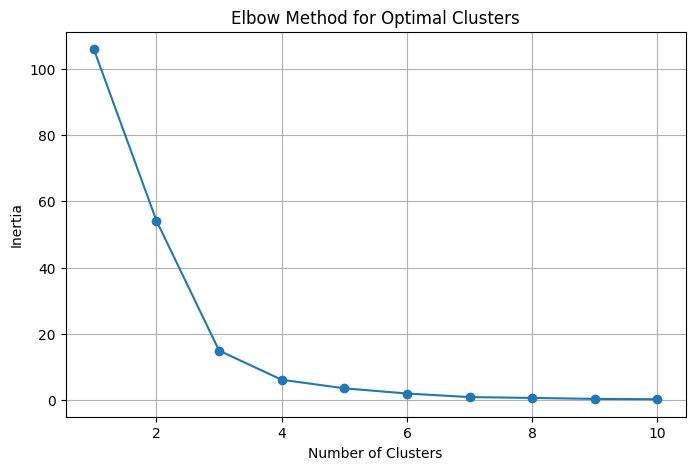

   Ticker  Predicted ROI (%)  Adjusted ROI (%)  Log Predicted ROI  Cluster
0    AAPL          -4.041383          0.001000           0.001000        0
1    ABBV          -7.705816          0.001000           0.001000        0
2     AMT          -5.974980          0.001000           0.001000        0
3    AMZN           2.604755          2.604755           1.282254        0
4     APD          -8.125988          0.001000           0.001000        0
5    AVGO         273.842192        273.842192           5.616197        1
6     BAC           7.197764          7.197764           2.103861        1
7    BKNG         -19.063954          0.001000           0.001000        0
8     CAT         -10.110177          0.001000           0.001000        0
9     CEG           7.080672          7.080672           2.089475        1
10    COP          15.618873         15.618873           2.810539        1
11   COST          -6.026375          0.001000           0.001000        0
12    CVX         -12.164

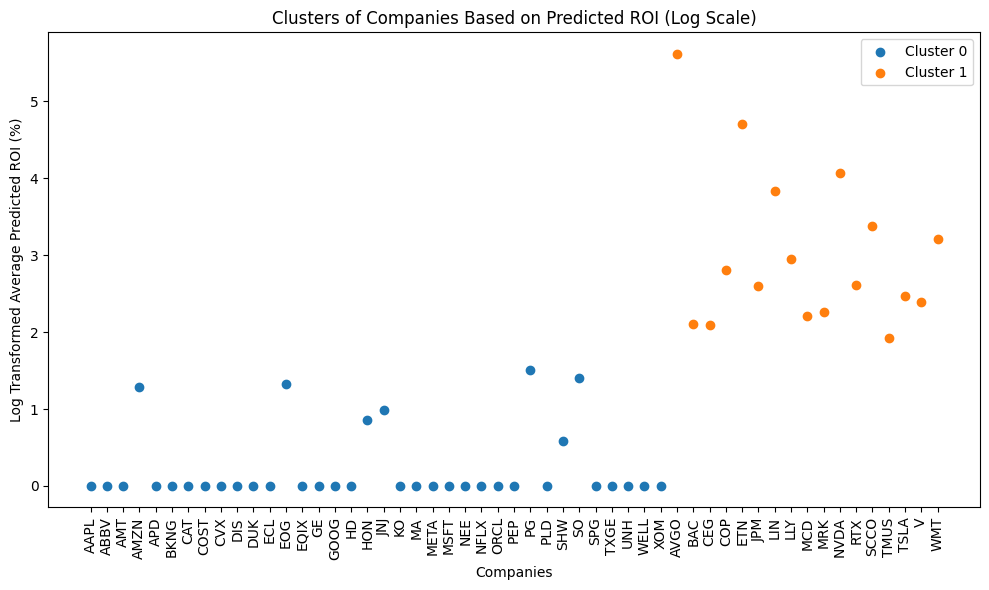

In [96]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

tickers = list(results_open.keys())
num_predictions = len(results_open[tickers[0]]['Future Predictions'])

predicted_data = {
    'Ticker': np.repeat(tickers, num_predictions),
    'Predicted Open': np.concatenate([results_open[ticker]['Future Predictions'] for ticker in tickers]),
    'Predicted Close': np.concatenate([results_close[ticker]['Future Predictions'] for ticker in tickers]),
}

df = pd.DataFrame(predicted_data)
df['Predicted ROI (%)'] = ((df['Predicted Close'] - df['Predicted Open']) / df['Predicted Open']) * 100

aggregated_roi = df.groupby('Ticker')['Predicted ROI (%)'].mean().reset_index()

aggregated_roi['Adjusted ROI (%)'] = aggregated_roi['Predicted ROI (%)'].apply(lambda x: x if x > 0 else 0.001)

aggregated_roi['Log Predicted ROI'] = np.log1p(aggregated_roi['Adjusted ROI (%)'])

X = aggregated_roi[['Adjusted ROI (%)', 'Log Predicted ROI']]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

inertia = []
range_n_clusters = range(1, 11)  # Testing clusters from 1 to 10
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, inertia, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid()
plt.show()

optimal_clusters = 2

#KMeans
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
aggregated_roi['Cluster'] = kmeans.fit_predict(X_scaled)

print(aggregated_roi)

#visualize
plt.figure(figsize=(10, 6))
for cluster in range(optimal_clusters):
    cluster_data = aggregated_roi[aggregated_roi['Cluster'] == cluster]
    plt.scatter(
        cluster_data['Ticker'],
        cluster_data['Log Predicted ROI'],
        label=f'Cluster {cluster}'
    )

plt.title('Clusters of Companies Based on Predicted ROI (Log Scale)')
plt.xlabel('Companies')
plt.ylabel('Log Transformed Average Predicted ROI (%)')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


# **Cluster Summary**

# Cluster 0:
**Risk & Return Profile:**

* **Risk:** Low risk, as lower predicted ROI typically correlates with less volatility.
* **Return:** Low return potential.
* **Investor Suitability:**
Suitable for risk-averse investors or those with a long-term investment horizon who prioritize stability over high returns (e.g., retirees, conservative investors).


#Cluster 1:
**Risk & Return Profile:**
* **Risk:** High risk, as companies with high predicted ROI often exhibit greater volatility.
* **Return:** High return potential.
* **Investor Suitability:**
Suitable for risk-tolerant investors or those with a short-term investment focus, such as active traders or individuals seeking aggressive portfolio growth (e.g., young professionals, speculative investors).

In [128]:
import numpy as np

def calculate_portfolio_sharpe(weights, returns, covariance_matrix, risk_free_rate_monthly):
    portfolio_return = np.dot(weights, returns)
    portfolio_std_dev = np.sqrt(np.dot(weights.T, np.dot(covariance_matrix, weights)))
    if portfolio_std_dev == 0:
        return -np.inf  # Avoid division by zero
    sharpe_ratio = (portfolio_return - risk_free_rate_monthly) / portfolio_std_dev
    return sharpe_ratio

def generate_covariance_matrix(returns):
    if len(returns) > 1:
        return np.cov(returns, rowvar=False)
    else:
        return np.array([[np.var(returns)]])

def generate_top_portfolios(cluster_data, risk_free_rate_monthly, num_portfolios=1000, max_portfolio_size=10):
    companies = cluster_data['Ticker'].values
    returns = cluster_data['Predicted ROI (%)'].values

    num_companies = len(companies)
    portfolio_size = min(max_portfolio_size, num_companies)  # Adjust portfolio size to available companies

    if num_companies < 2:
        print(f"Cluster with fewer than 2 companies: {companies}")
        return []

    covariance_matrix = generate_covariance_matrix(returns)

    portfolios = []

    for _ in range(num_portfolios):
        selected_indices = np.random.choice(range(num_companies), size=portfolio_size, replace=False)
        selected_companies = [companies[i] for i in selected_indices]
        selected_returns = [returns[i] for i in selected_indices]

        weights = np.ones(portfolio_size) / portfolio_size

        if covariance_matrix.ndim == 2:
            subset_cov_matrix = covariance_matrix[np.ix_(selected_indices, selected_indices)]
        else:
            subset_cov_matrix = np.diag([covariance_matrix] * portfolio_size)

        sharpe_ratio = calculate_portfolio_sharpe(weights, selected_returns, subset_cov_matrix, risk_free_rate_monthly)
        portfolios.append((selected_companies, sharpe_ratio))

    return portfolios

risk_free_rate_annual = 4.43
risk_free_rate_monthly = risk_free_rate_annual / 12

portfolio_results = {}

for cluster in aggregated_roi['Cluster'].unique():
    cluster_data = aggregated_roi[aggregated_roi['Cluster'] == cluster]

    portfolio_results[cluster] = generate_top_portfolios(cluster_data, risk_free_rate_monthly)

# Display top portfolios for each cluster
for cluster, portfolios in portfolio_results.items():
    print(f"\nTop portfolios for Cluster {cluster}:")
    sorted_portfolios = sorted(portfolios, key=lambda x: x[1], reverse=True)[:2]
    for i, (portfolio, sharpe_ratio) in enumerate(sorted_portfolios, start=1):
        print(f"Portfolio {i}: {portfolio}, Sharpe Ratio: {sharpe_ratio:.2f}")



Top portfolios for Cluster 0:
Portfolio 1: ['SO', 'GE', 'AMZN', 'DIS', 'PG', 'NFLX', 'PLD', 'HON', 'GOOG', 'DUK'], Sharpe Ratio: -0.67
Portfolio 2: ['GE', 'PEP', 'AAPL', 'UNH', 'DUK', 'SO', 'HON', 'PG', 'EOG', 'APD'], Sharpe Ratio: -0.77

Top portfolios for Cluster 1:
Portfolio 1: ['JPM', 'LIN', 'SCCO', 'NVDA', 'V', 'WMT', 'MCD', 'LLY', 'AVGO', 'ETN'], Sharpe Ratio: 2.79
Portfolio 2: ['JPM', 'TSLA', 'NVDA', 'MCD', 'RTX', 'LIN', 'SCCO', 'AVGO', 'ETN', 'WMT'], Sharpe Ratio: 2.77
